In [2]:
%reload_ext autoreload
%autoreload 2

import time
from hugeica import *

import glob
import torch, imageio
import torchvision
shape = (3, 96, 96)
torch.cuda.is_available(), torch.pinverse(torch.zeros((2,2)).cuda()).device

(True, device(type='cuda', index=0))

In [3]:
!ls /mnt/ds1/ILSVRC2015/Data/CLS-LOC/val

ls: cannot access '/mnt/ds1/ILSVRC2015/Data/CLS-LOC/val': No such file or directory


In [4]:


class Imagenet():
    
    def __init__(self, root="/mnt/ds1/ILSVRC2015/Data/CLS-LOC/", dataset="train",
                       transforms=torchvision.transforms.Compose([torchvision.transforms.ToTensor()]), limit=-1): 

        self.size = 200 // 2
        self.root = root
        
        if dataset == "train":
            self.paths = glob.glob(root + "train/**/**.JPEG") 
        if dataset == "test":
            self.paths = glob.glob(root + "test/**.JPEG") 
        if dataset == "val":
            self.paths = glob.glob(root + "val/**.JPEG") 
   
        self.transforms = transforms
        
        if limit > 0:
            self.paths = self.paths[:limit]      

    def __iter__(self):
        self.a = -1
        return self
    
    def __next__(self):
        self.a += 1
        if self.a >= len(self):
            raise StopIteration()        
        return self[self.a]
    
    def __getitem__(self, i):
        x = imageio.imread(self.paths[i])
        
        ch, cw = x.shape[0]//2, x.shape[1]//2
        if len(x.shape) == 3:
            x = x[ch-self.size:ch+self.size,cw-self.size:cw+self.size,:]
        else:
            x = x[ch-self.size:ch+self.size,cw-self.size:cw+self.size, None]    
        x = x - x.mean()
        
        x_ = np.zeros((200, 200, 3))
        x_[:x.shape[0], :x.shape[1], :] = x[:, :, :3]
        
        if self.transforms:
            x_ = self.transforms(x_).contiguous()
            
        return x_.float().view(-1), -1
        
    def __len__(self):
        return len(self.paths)
    
    def __repr__(self):
        return f"{self.__class__.__name__}(root={self.root})"

In [5]:
imagenet = Imagenet(root="/home_ext/ios/ram_blob/", dataset="train", limit=1281000)
imagenetv = Imagenet(root="/home_ext/ios/blob/",dataset="val", limit=500)

(len(imagenet), len(imagenet[0][0]))

(1281000, 120000)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


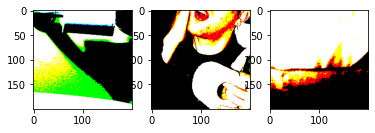

In [6]:
plt.subplot(1,3,1)
plt.imshow(imagenet[0][0].numpy().reshape(3,200,200).transpose(1,2,0))
plt.subplot(1,3,2)
plt.imshow(imagenet[1][0].numpy().reshape(3,200,200).transpose(1,2,0))
plt.subplot(1,3,3)
plt.imshow(imagenet[2][0].numpy().reshape(3,200,200).transpose(1,2,0))

In [19]:
dl = torch.utils.data.DataLoader(imagenet, num_workers=2, batch_size=484)
dlv = torch.utils.data.DataLoader(imagenetv, num_workers=2, batch_size=484)

In [20]:
model = HugeICA(484, loss="neglogcosh", optimistic_whitening_rate=0.1, whitening_strategy="batch")
# model = FasterICA(484, loss="neglogcosh", optimistic_whitening_rate=0.01, whitening_strategy="GHA")

model.to("cuda")

FasterICA()

1



  0%|          | 0/2647 [00:00<?, ?it/s]


  0%|          | 1/2647 [00:06<4:42:11,  6.40s/it]


  0%|          | 2/2647 [00:11<4:30:52,  6.14s/it]


  0%|          | 3/2647 [00:16<4:13:45,  5.76s/it]


  0%|          | 4/2647 [00:21<4:01:10,  5.48s/it]


  0%|          | 5/2647 [00:26<3:47:21,  5.16s/it]


  0%|          | 6/2647 [00:30<3:35:35,  4.90s/it]


  0%|          | 7/2647 [00:34<3:31:17,  4.80s/it]


  0%|          | 8/2647 [00:39<3:30:02,  4.78s/it]


  0%|          | 9/2647 [00:43<3:24:13,  4.64s/it]


  0%|          | 10/2647 [00:48<3:27:54,  4.73s/it]


  0%|          | 11/2647 [00:53<3:25:41,  4.68s/it]


  0%|          | 12/2647 [00:58<3:24:48,  4.66s/it]


  0%|          | 13/2647 [01:02<3:20:44,  4.57s/it]


  1%|          | 14/2647 [01:06<3:16:13,  4.47s/it]


  1%|          | 15/2647 [01:11<3:21:46,  4.60s/it]


  1%|          | 16/2647 [01:16<3:23:42,  4.65s/it]


  1%|          | 17/2647 [01:21<3:29:40,  4.78s/it]


  1%|          | 18/2647 [01:26<3:28:07,  4

 10%|▉         | 257/2647 [19:46<2:58:58,  4.49s/it]


 10%|▉         | 258/2647 [19:50<2:51:46,  4.31s/it]


 10%|▉         | 259/2647 [19:54<2:48:44,  4.24s/it]


 10%|▉         | 260/2647 [19:58<2:50:10,  4.28s/it]


 10%|▉         | 261/2647 [20:03<2:51:34,  4.31s/it]


 10%|▉         | 262/2647 [20:07<2:53:44,  4.37s/it]


 10%|▉         | 263/2647 [20:12<2:57:09,  4.46s/it]


 10%|▉         | 264/2647 [20:17<2:57:49,  4.48s/it]


 10%|█         | 265/2647 [20:21<2:56:06,  4.44s/it]


 10%|█         | 266/2647 [20:21<2:04:51,  3.15s/it]


 10%|█         | 267/2647 [20:21<1:28:47,  2.24s/it]


 10%|█         | 268/2647 [20:21<1:03:28,  1.60s/it]


 10%|█         | 269/2647 [20:23<1:08:51,  1.74s/it]


 10%|█         | 270/2647 [20:24<51:42,  1.31s/it]  


 10%|█         | 271/2647 [20:26<1:03:44,  1.61s/it]


 10%|█         | 272/2647 [20:26<46:28,  1.17s/it]  


 10%|█         | 273/2647 [20:28<58:53,  1.49s/it]


 10%|█         | 274/2647 [20:29<45:14,  1.14s/it]


 10%|█        

 20%|█▉        | 518/2647 [25:55<47:57,  1.35s/it]


 20%|█▉        | 519/2647 [25:56<36:37,  1.03s/it]


 20%|█▉        | 520/2647 [25:58<51:17,  1.45s/it]


 20%|█▉        | 521/2647 [25:58<38:13,  1.08s/it]


 20%|█▉        | 522/2647 [26:01<54:47,  1.55s/it]


 20%|█▉        | 523/2647 [26:01<42:42,  1.21s/it]


 20%|█▉        | 524/2647 [26:04<56:05,  1.59s/it]


 20%|█▉        | 525/2647 [26:04<43:48,  1.24s/it]


 20%|█▉        | 526/2647 [26:07<57:31,  1.63s/it]


 20%|█▉        | 527/2647 [26:07<47:10,  1.34s/it]


 20%|█▉        | 528/2647 [26:10<59:19,  1.68s/it]


 20%|█▉        | 529/2647 [26:10<43:03,  1.22s/it]


 20%|██        | 530/2647 [26:12<55:25,  1.57s/it]


 20%|██        | 531/2647 [26:12<40:27,  1.15s/it]


 20%|██        | 532/2647 [26:15<57:31,  1.63s/it]


 20%|██        | 533/2647 [26:16<45:27,  1.29s/it]


 20%|██        | 534/2647 [26:18<53:48,  1.53s/it]


 20%|██        | 535/2647 [26:18<44:09,  1.25s/it]


 20%|██        | 536/2647 [26:20<50:15,  1.43s

 30%|██▉       | 782/2647 [31:44<41:19,  1.33s/it]


 30%|██▉       | 783/2647 [31:47<52:58,  1.71s/it]


 30%|██▉       | 784/2647 [31:47<38:30,  1.24s/it]


  1%|          | 14/2647 [34:58<109:37:32, 149.89s/it]


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff865de54d0>
Traceback (most recent call last):
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
    self._shutdown_workers()
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process





  1%|          | 14/2647 [35:00<109:44:11, 150.04s/it]


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff865de54d0>
Traceback (most recent call last):
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
    self._shutdown_workers()
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process





 30%|██▉       | 787/2647 [31:51<45:55,  1.48s/it]


 30%|██▉       | 788/2647 [31:52<37:06,  1.20s/it]


 30%|██▉       | 789/2647 [31:54<47:56,  1.55s/it]


 30%|██▉       | 790/2647 [31:55<35:17,  1.14s/it]


 30%|██▉       | 791/2647 [31:57<47:01,  1.52s/it]


 30%|██▉       | 792/2647 [31:57<34:06,  1.10s/it]


 30%|██▉       | 793/2647 [31:59<41:10,  1.33s/it]


 30%|██▉       | 794/2647 [31:59<30:12,  1.02it/s]


 30%|███       | 795/2647 [32:02<46:38,  1.51s/it]


 30%|███       | 796/2647 [32:02<33:54,  1.10s/it]


 30%|███       | 797/2647 [32:05<49:41,  1.61s/it]


 30%|███       | 798/2647 [32:05<36:03,  1.17s/it]


 30%|███       | 799/2647 [32:08<50:58,  1.66s/it]


 30%|███       | 800/2647 [32:08<36:59,  1.20s/it]


 30%|███       | 801/2647 [32:10<46:53,  1.52s/it]


 30%|███       | 802/2647 [32:10<34:08,  1.11s/it]


 30%|███       | 803/2647 [32:13<45:28,  1.48s/it]


 30%|███       | 804/2647 [32:13<33:12,  1.08s/it]


 30%|███       | 805/2647 [32:15<47:58,  1.

 40%|███▉      | 1050/2647 [37:45<39:15,  1.48s/it]


 40%|███▉      | 1051/2647 [37:45<28:40,  1.08s/it]


 40%|███▉      | 1052/2647 [37:47<37:12,  1.40s/it]


 40%|███▉      | 1053/2647 [37:47<27:08,  1.02s/it]


 40%|███▉      | 1054/2647 [37:49<35:11,  1.33s/it]


 40%|███▉      | 1055/2647 [37:49<25:42,  1.03it/s]


 40%|███▉      | 1056/2647 [37:52<37:24,  1.41s/it]


 40%|███▉      | 1057/2647 [37:52<27:18,  1.03s/it]


 40%|███▉      | 1058/2647 [37:55<42:01,  1.59s/it]


 40%|████      | 1059/2647 [37:55<30:34,  1.16s/it]


 40%|████      | 1060/2647 [37:57<38:03,  1.44s/it]


 40%|████      | 1061/2647 [37:57<27:44,  1.05s/it]


 40%|████      | 1062/2647 [38:00<39:20,  1.49s/it]


 40%|████      | 1063/2647 [38:00<28:36,  1.08s/it]


 40%|████      | 1064/2647 [38:02<37:29,  1.42s/it]


 40%|████      | 1065/2647 [38:02<27:35,  1.05s/it]


 40%|████      | 1066/2647 [38:05<41:22,  1.57s/it]


 40%|████      | 1067/2647 [38:05<30:03,  1.14s/it]


 40%|████      | 1068/2647 [

 49%|████▉     | 1310/2647 [43:32<23:01,  1.03s/it]


 50%|████▉     | 1311/2647 [43:34<28:11,  1.27s/it]


 50%|████▉     | 1312/2647 [43:34<20:49,  1.07it/s]


 50%|████▉     | 1313/2647 [43:36<28:49,  1.30s/it]


 50%|████▉     | 1314/2647 [43:37<22:36,  1.02s/it]


 50%|████▉     | 1315/2647 [43:39<28:24,  1.28s/it]


 50%|████▉     | 1316/2647 [43:39<23:42,  1.07s/it]


 50%|████▉     | 1317/2647 [43:41<30:34,  1.38s/it]


 50%|████▉     | 1318/2647 [43:43<30:43,  1.39s/it]


 50%|████▉     | 1319/2647 [43:45<34:31,  1.56s/it]


 50%|████▉     | 1320/2647 [43:45<25:09,  1.14s/it]


 50%|████▉     | 1321/2647 [43:47<31:27,  1.42s/it]


 50%|████▉     | 1322/2647 [43:48<26:38,  1.21s/it]


 50%|████▉     | 1323/2647 [43:50<32:57,  1.49s/it]


 50%|█████     | 1324/2647 [43:50<27:15,  1.24s/it]


 50%|█████     | 1325/2647 [43:53<33:23,  1.52s/it]


 50%|█████     | 1326/2647 [43:53<28:17,  1.29s/it]


 50%|█████     | 1327/2647 [43:55<33:43,  1.53s/it]


 50%|█████     | 1328/2647 [

 59%|█████▉    | 1570/2647 [49:22<24:39,  1.37s/it]


 59%|█████▉    | 1571/2647 [49:24<28:49,  1.61s/it]


 59%|█████▉    | 1572/2647 [49:24<20:55,  1.17s/it]


 59%|█████▉    | 1573/2647 [49:27<26:07,  1.46s/it]


 59%|█████▉    | 1574/2647 [49:27<18:56,  1.06s/it]


 60%|█████▉    | 1575/2647 [49:29<24:09,  1.35s/it]


 60%|█████▉    | 1576/2647 [49:29<17:41,  1.01it/s]


 60%|█████▉    | 1577/2647 [49:32<26:52,  1.51s/it]


 60%|█████▉    | 1578/2647 [49:32<19:35,  1.10s/it]


 60%|█████▉    | 1579/2647 [49:34<25:39,  1.44s/it]


 60%|█████▉    | 1580/2647 [49:34<18:46,  1.06s/it]


 60%|█████▉    | 1581/2647 [49:37<27:05,  1.53s/it]


 60%|█████▉    | 1582/2647 [49:37<19:42,  1.11s/it]


 60%|█████▉    | 1583/2647 [49:39<27:28,  1.55s/it]


 60%|█████▉    | 1584/2647 [49:40<20:02,  1.13s/it]


 60%|█████▉    | 1585/2647 [49:41<23:39,  1.34s/it]


 60%|█████▉    | 1586/2647 [49:42<17:10,  1.03it/s]


 60%|█████▉    | 1587/2647 [49:43<22:09,  1.25s/it]


 60%|█████▉    | 1588/2647 [

 69%|██████▉   | 1830/2647 [55:14<21:17,  1.56s/it]


 69%|██████▉   | 1831/2647 [55:14<16:19,  1.20s/it]


 69%|██████▉   | 1832/2647 [55:17<21:29,  1.58s/it]


 69%|██████▉   | 1833/2647 [55:17<15:38,  1.15s/it]


 69%|██████▉   | 1834/2647 [55:19<20:46,  1.53s/it]


 69%|██████▉   | 1835/2647 [55:20<15:06,  1.12s/it]


 69%|██████▉   | 1836/2647 [55:22<22:03,  1.63s/it]


 69%|██████▉   | 1837/2647 [55:23<16:01,  1.19s/it]


 69%|██████▉   | 1838/2647 [55:25<22:06,  1.64s/it]


 69%|██████▉   | 1839/2647 [55:25<16:01,  1.19s/it]


 70%|██████▉   | 1840/2647 [55:28<22:24,  1.67s/it]


 70%|██████▉   | 1841/2647 [55:28<16:16,  1.21s/it]


 70%|██████▉   | 1842/2647 [55:31<21:31,  1.60s/it]


 70%|██████▉   | 1843/2647 [55:31<16:11,  1.21s/it]


 70%|██████▉   | 1844/2647 [55:35<26:03,  1.95s/it]


 70%|██████▉   | 1845/2647 [55:35<18:50,  1.41s/it]


 70%|██████▉   | 1846/2647 [55:37<22:39,  1.70s/it]


 70%|██████▉   | 1847/2647 [55:37<16:30,  1.24s/it]


 70%|██████▉   | 1848/2647 [

 79%|███████▉  | 2088/2647 [1:00:52<10:18,  1.11s/it]


 79%|███████▉  | 2089/2647 [1:00:55<15:55,  1.71s/it]


 79%|███████▉  | 2090/2647 [1:00:56<11:31,  1.24s/it]


 79%|███████▉  | 2091/2647 [1:00:58<13:46,  1.49s/it]


 79%|███████▉  | 2092/2647 [1:00:58<10:00,  1.08s/it]


 79%|███████▉  | 2093/2647 [1:01:00<14:05,  1.53s/it]


 79%|███████▉  | 2094/2647 [1:01:01<10:13,  1.11s/it]


 79%|███████▉  | 2095/2647 [1:01:03<13:47,  1.50s/it]


 79%|███████▉  | 2096/2647 [1:01:03<10:06,  1.10s/it]


 79%|███████▉  | 2097/2647 [1:01:05<13:26,  1.47s/it]


 79%|███████▉  | 2098/2647 [1:01:06<09:45,  1.07s/it]


 79%|███████▉  | 2099/2647 [1:01:08<13:52,  1.52s/it]


 79%|███████▉  | 2100/2647 [1:01:08<10:04,  1.11s/it]


 79%|███████▉  | 2101/2647 [1:01:11<14:31,  1.60s/it]


 79%|███████▉  | 2102/2647 [1:01:11<10:39,  1.17s/it]


 79%|███████▉  | 2103/2647 [1:01:13<12:51,  1.42s/it]


 79%|███████▉  | 2104/2647 [1:01:13<09:25,  1.04s/it]


 80%|███████▉  | 2105/2647 [1:01:16<13:02,  1.44

 88%|████████▊ | 2340/2647 [1:06:21<09:37,  1.88s/it]


 88%|████████▊ | 2341/2647 [1:06:21<06:58,  1.37s/it]


 88%|████████▊ | 2342/2647 [1:06:24<09:04,  1.79s/it]


 89%|████████▊ | 2343/2647 [1:06:24<06:33,  1.29s/it]


 89%|████████▊ | 2344/2647 [1:06:27<08:28,  1.68s/it]


 89%|████████▊ | 2345/2647 [1:06:27<06:09,  1.22s/it]


 89%|████████▊ | 2346/2647 [1:06:29<08:00,  1.60s/it]


 89%|████████▊ | 2347/2647 [1:06:30<05:48,  1.16s/it]


 89%|████████▊ | 2348/2647 [1:06:32<07:02,  1.41s/it]


 89%|████████▊ | 2349/2647 [1:06:32<05:08,  1.04s/it]


 89%|████████▉ | 2350/2647 [1:06:34<07:18,  1.48s/it]


 89%|████████▉ | 2351/2647 [1:06:34<05:18,  1.08s/it]


 89%|████████▉ | 2352/2647 [1:06:37<08:07,  1.65s/it]


 89%|████████▉ | 2353/2647 [1:06:37<05:55,  1.21s/it]


 89%|████████▉ | 2354/2647 [1:06:41<09:26,  1.93s/it]


 89%|████████▉ | 2355/2647 [1:06:41<06:48,  1.40s/it]


 89%|████████▉ | 2356/2647 [1:06:45<10:28,  2.16s/it]


 89%|████████▉ | 2357/2647 [1:06:45<07:31,  1.56

 98%|█████████▊| 2592/2647 [1:12:27<00:59,  1.08s/it]


 98%|█████████▊| 2593/2647 [1:12:29<01:21,  1.51s/it]


 98%|█████████▊| 2594/2647 [1:12:29<00:58,  1.11s/it]


 98%|█████████▊| 2595/2647 [1:12:32<01:18,  1.51s/it]


 98%|█████████▊| 2596/2647 [1:12:32<00:56,  1.10s/it]


 98%|█████████▊| 2597/2647 [1:12:34<01:18,  1.57s/it]


 98%|█████████▊| 2598/2647 [1:12:35<00:55,  1.14s/it]


 98%|█████████▊| 2599/2647 [1:12:37<01:17,  1.62s/it]


 98%|█████████▊| 2600/2647 [1:12:38<00:55,  1.18s/it]


 98%|█████████▊| 2601/2647 [1:12:40<01:12,  1.58s/it]


 98%|█████████▊| 2602/2647 [1:12:40<00:51,  1.15s/it]


 98%|█████████▊| 2603/2647 [1:12:43<01:07,  1.52s/it]


 98%|█████████▊| 2604/2647 [1:12:43<00:47,  1.11s/it]


 98%|█████████▊| 2605/2647 [1:12:45<01:05,  1.55s/it]


 98%|█████████▊| 2606/2647 [1:12:45<00:46,  1.13s/it]


 98%|█████████▊| 2607/2647 [1:12:48<01:04,  1.61s/it]


 99%|█████████▊| 2608/2647 [1:12:48<00:45,  1.17s/it]


 99%|█████████▊| 2609/2647 [1:12:51<01:00,  1.58

  8%|▊         | 199/2647 [04:56<48:38,  1.19s/it]  


  8%|▊         | 200/2647 [04:58<1:06:58,  1.64s/it]


  8%|▊         | 201/2647 [04:58<48:34,  1.19s/it]  


  8%|▊         | 202/2647 [05:01<1:10:04,  1.72s/it]


  8%|▊         | 203/2647 [05:02<50:55,  1.25s/it]  


  8%|▊         | 204/2647 [05:05<1:12:44,  1.79s/it]


  8%|▊         | 205/2647 [05:05<52:43,  1.30s/it]  


  8%|▊         | 206/2647 [05:07<1:07:11,  1.65s/it]


  8%|▊         | 207/2647 [05:07<48:42,  1.20s/it]  


  8%|▊         | 208/2647 [05:10<1:03:27,  1.56s/it]


  8%|▊         | 209/2647 [05:10<46:21,  1.14s/it]  


  8%|▊         | 210/2647 [05:12<1:00:57,  1.50s/it]


  8%|▊         | 211/2647 [05:12<44:24,  1.09s/it]  


  8%|▊         | 212/2647 [05:15<1:01:54,  1.53s/it]


  8%|▊         | 213/2647 [05:15<45:02,  1.11s/it]  


  8%|▊         | 214/2647 [05:18<1:11:49,  1.77s/it]


  8%|▊         | 215/2647 [05:18<52:02,  1.28s/it]  


  8%|▊         | 216/2647 [05:21<1:07:17,  1.66s/it]


  8%|▊    

 17%|█▋        | 458/2647 [10:40<40:08,  1.10s/it]


 17%|█▋        | 459/2647 [10:42<47:14,  1.30s/it]


 17%|█▋        | 460/2647 [10:42<34:25,  1.06it/s]


 17%|█▋        | 461/2647 [10:45<56:33,  1.55s/it]


 17%|█▋        | 462/2647 [10:45<40:59,  1.13s/it]


 17%|█▋        | 463/2647 [10:48<1:00:52,  1.67s/it]


 18%|█▊        | 464/2647 [10:48<44:02,  1.21s/it]  


 18%|█▊        | 465/2647 [10:51<59:49,  1.64s/it]


 18%|█▊        | 466/2647 [10:51<43:29,  1.20s/it]


 18%|█▊        | 467/2647 [10:53<50:04,  1.38s/it]


 18%|█▊        | 468/2647 [10:53<36:32,  1.01s/it]


 18%|█▊        | 469/2647 [10:56<52:43,  1.45s/it]


 18%|█▊        | 470/2647 [10:56<38:38,  1.06s/it]


 18%|█▊        | 471/2647 [10:58<51:13,  1.41s/it]


 18%|█▊        | 472/2647 [10:58<37:38,  1.04s/it]


 18%|█▊        | 473/2647 [11:01<52:04,  1.44s/it]


 18%|█▊        | 474/2647 [11:01<38:03,  1.05s/it]


 18%|█▊        | 475/2647 [11:04<57:04,  1.58s/it]


 18%|█▊        | 476/2647 [11:04<50:18,  1

 27%|██▋       | 722/2647 [16:27<33:54,  1.06s/it]


 27%|██▋       | 723/2647 [16:29<43:23,  1.35s/it]


 27%|██▋       | 724/2647 [16:30<31:42,  1.01it/s]


 27%|██▋       | 725/2647 [16:32<48:34,  1.52s/it]


 27%|██▋       | 726/2647 [16:32<35:25,  1.11s/it]


 27%|██▋       | 727/2647 [16:35<48:10,  1.51s/it]


 28%|██▊       | 728/2647 [16:35<35:04,  1.10s/it]


 28%|██▊       | 729/2647 [16:37<47:04,  1.47s/it]


 28%|██▊       | 730/2647 [16:38<34:15,  1.07s/it]


 28%|██▊       | 731/2647 [16:40<44:29,  1.39s/it]


 28%|██▊       | 732/2647 [16:40<32:39,  1.02s/it]


 28%|██▊       | 733/2647 [16:42<44:06,  1.38s/it]


 28%|██▊       | 734/2647 [16:42<32:11,  1.01s/it]


 28%|██▊       | 735/2647 [16:45<48:39,  1.53s/it]


 28%|██▊       | 736/2647 [16:45<35:28,  1.11s/it]


 28%|██▊       | 737/2647 [16:47<47:09,  1.48s/it]


 28%|██▊       | 738/2647 [16:48<34:29,  1.08s/it]


 28%|██▊       | 739/2647 [16:50<44:14,  1.39s/it]


 28%|██▊       | 740/2647 [16:50<32:17,  1.02s

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff865de54d0>
Traceback (most recent call last):
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
    self._shutdown_workers()
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process





 29%|██▊       | 755/2647 [17:10<41:25,  1.31s/it]


  1%|          | 14/2647 [1:34:19<295:39:35, 404.24s/it]


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff865de54d0>
Traceback (most recent call last):
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
    self._shutdown_workers()
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process





 29%|██▊       | 757/2647 [17:13<41:26,  1.32s/it]


 29%|██▊       | 758/2647 [17:13<30:31,  1.03it/s]


 29%|██▊       | 759/2647 [17:15<36:34,  1.16s/it]


 29%|██▊       | 760/2647 [17:15<27:07,  1.16it/s]


 29%|██▊       | 761/2647 [17:17<40:38,  1.29s/it]


 29%|██▉       | 762/2647 [17:17<30:25,  1.03it/s]


 29%|██▉       | 763/2647 [17:19<41:28,  1.32s/it]


 29%|██▉       | 764/2647 [17:20<30:38,  1.02it/s]


 29%|██▉       | 765/2647 [17:22<41:31,  1.32s/it]


 29%|██▉       | 766/2647 [17:22<33:35,  1.07s/it]


 29%|██▉       | 767/2647 [17:24<44:35,  1.42s/it]


 29%|██▉       | 768/2647 [17:25<34:20,  1.10s/it]


 29%|██▉       | 769/2647 [17:27<42:31,  1.36s/it]


 29%|██▉       | 770/2647 [17:27<30:59,  1.01it/s]


 29%|██▉       | 771/2647 [17:30<47:48,  1.53s/it]


 29%|██▉       | 772/2647 [17:30<34:52,  1.12s/it]


 29%|██▉       | 773/2647 [17:32<47:59,  1.54s/it]


 29%|██▉       | 774/2647 [17:32<34:51,  1.12s/it]


 29%|██▉       | 775/2647 [17:35<49:03,  1.

 39%|███▊      | 1020/2647 [23:06<40:53,  1.51s/it]


 39%|███▊      | 1021/2647 [23:06<29:53,  1.10s/it]


 39%|███▊      | 1022/2647 [23:10<47:31,  1.75s/it]


 39%|███▊      | 1023/2647 [23:10<34:28,  1.27s/it]


 39%|███▊      | 1024/2647 [23:13<48:49,  1.80s/it]


 39%|███▊      | 1025/2647 [23:13<35:17,  1.31s/it]


 39%|███▉      | 1026/2647 [23:16<46:49,  1.73s/it]


 39%|███▉      | 1027/2647 [23:16<33:50,  1.25s/it]


 39%|███▉      | 1028/2647 [23:18<40:06,  1.49s/it]


 39%|███▉      | 1029/2647 [23:18<29:14,  1.08s/it]


 39%|███▉      | 1030/2647 [23:21<47:20,  1.76s/it]


 39%|███▉      | 1031/2647 [23:22<34:22,  1.28s/it]


 39%|███▉      | 1032/2647 [23:24<47:19,  1.76s/it]


 39%|███▉      | 1033/2647 [23:25<34:13,  1.27s/it]


 39%|███▉      | 1034/2647 [23:27<44:09,  1.64s/it]


 39%|███▉      | 1035/2647 [23:27<32:04,  1.19s/it]


 39%|███▉      | 1036/2647 [23:30<42:43,  1.59s/it]


 39%|███▉      | 1037/2647 [23:30<31:02,  1.16s/it]


 39%|███▉      | 1038/2647 [

 48%|████▊     | 1280/2647 [28:57<25:09,  1.10s/it]


 48%|████▊     | 1281/2647 [28:59<33:13,  1.46s/it]


 48%|████▊     | 1282/2647 [28:59<24:12,  1.06s/it]


 48%|████▊     | 1283/2647 [29:01<32:21,  1.42s/it]


 49%|████▊     | 1284/2647 [29:02<23:38,  1.04s/it]


 49%|████▊     | 1285/2647 [29:04<34:00,  1.50s/it]


 49%|████▊     | 1286/2647 [29:04<24:48,  1.09s/it]


 49%|████▊     | 1287/2647 [29:06<30:33,  1.35s/it]


 49%|████▊     | 1288/2647 [29:06<22:23,  1.01it/s]


 49%|████▊     | 1289/2647 [29:09<36:00,  1.59s/it]


 49%|████▊     | 1290/2647 [29:10<26:04,  1.15s/it]


 49%|████▉     | 1291/2647 [29:12<36:47,  1.63s/it]


 49%|████▉     | 1292/2647 [29:12<26:43,  1.18s/it]


 49%|████▉     | 1293/2647 [29:15<38:43,  1.72s/it]


 49%|████▉     | 1294/2647 [29:16<28:04,  1.24s/it]


 49%|████▉     | 1295/2647 [29:19<41:01,  1.82s/it]


 49%|████▉     | 1296/2647 [29:19<29:34,  1.31s/it]


 49%|████▉     | 1297/2647 [29:21<37:56,  1.69s/it]


 49%|████▉     | 1298/2647 [

 58%|█████▊    | 1540/2647 [34:42<21:17,  1.15s/it]


 58%|█████▊    | 1541/2647 [34:45<29:15,  1.59s/it]


 58%|█████▊    | 1542/2647 [34:45<21:20,  1.16s/it]


 58%|█████▊    | 1543/2647 [34:47<29:01,  1.58s/it]


 58%|█████▊    | 1544/2647 [34:47<21:12,  1.15s/it]


 58%|█████▊    | 1545/2647 [34:50<31:03,  1.69s/it]


 58%|█████▊    | 1546/2647 [34:51<22:32,  1.23s/it]


 58%|█████▊    | 1547/2647 [34:53<29:29,  1.61s/it]


 58%|█████▊    | 1548/2647 [34:53<21:28,  1.17s/it]


 59%|█████▊    | 1549/2647 [34:55<26:50,  1.47s/it]


 59%|█████▊    | 1550/2647 [34:56<19:41,  1.08s/it]


 59%|█████▊    | 1551/2647 [34:57<24:08,  1.32s/it]


 59%|█████▊    | 1552/2647 [34:58<17:38,  1.03it/s]


 59%|█████▊    | 1553/2647 [35:01<28:41,  1.57s/it]


 59%|█████▊    | 1554/2647 [35:01<20:51,  1.14s/it]


 59%|█████▊    | 1555/2647 [35:03<28:46,  1.58s/it]


 59%|█████▉    | 1556/2647 [35:03<20:54,  1.15s/it]


 59%|█████▉    | 1557/2647 [35:07<32:50,  1.81s/it]


 59%|█████▉    | 1558/2647 [

 68%|██████▊   | 1800/2647 [40:36<21:07,  1.50s/it]


 68%|██████▊   | 1801/2647 [40:38<22:27,  1.59s/it]


 68%|██████▊   | 1802/2647 [40:40<25:44,  1.83s/it]


 68%|██████▊   | 1803/2647 [40:41<21:31,  1.53s/it]


 68%|██████▊   | 1804/2647 [40:43<22:46,  1.62s/it]


 68%|██████▊   | 1805/2647 [40:44<19:00,  1.35s/it]


 68%|██████▊   | 1806/2647 [40:45<20:59,  1.50s/it]


 68%|██████▊   | 1807/2647 [40:46<17:43,  1.27s/it]


 68%|██████▊   | 1808/2647 [40:48<20:11,  1.44s/it]


 68%|██████▊   | 1809/2647 [40:49<17:20,  1.24s/it]


 68%|██████▊   | 1810/2647 [40:51<20:13,  1.45s/it]


 68%|██████▊   | 1811/2647 [40:51<17:19,  1.24s/it]


 68%|██████▊   | 1812/2647 [40:53<19:33,  1.41s/it]


 68%|██████▊   | 1813/2647 [40:54<16:47,  1.21s/it]


 69%|██████▊   | 1814/2647 [40:56<19:44,  1.42s/it]


 69%|██████▊   | 1815/2647 [40:57<16:36,  1.20s/it]


 69%|██████▊   | 1816/2647 [40:59<20:09,  1.46s/it]


 69%|██████▊   | 1817/2647 [40:59<16:21,  1.18s/it]


 69%|██████▊   | 1818/2647 [

 78%|███████▊  | 2060/2647 [46:22<10:53,  1.11s/it]


 78%|███████▊  | 2061/2647 [46:25<14:52,  1.52s/it]


 78%|███████▊  | 2062/2647 [46:25<10:45,  1.10s/it]


 78%|███████▊  | 2063/2647 [46:27<13:37,  1.40s/it]


 78%|███████▊  | 2064/2647 [46:27<09:58,  1.03s/it]


 78%|███████▊  | 2065/2647 [46:29<12:00,  1.24s/it]


 78%|███████▊  | 2066/2647 [46:29<08:48,  1.10it/s]


 78%|███████▊  | 2067/2647 [46:31<13:12,  1.37s/it]


 78%|███████▊  | 2068/2647 [46:32<09:42,  1.01s/it]


 78%|███████▊  | 2069/2647 [46:34<13:37,  1.41s/it]


 78%|███████▊  | 2070/2647 [46:34<09:54,  1.03s/it]


 78%|███████▊  | 2071/2647 [46:37<14:25,  1.50s/it]


 78%|███████▊  | 2072/2647 [46:37<10:29,  1.09s/it]


 78%|███████▊  | 2073/2647 [46:39<14:31,  1.52s/it]


 78%|███████▊  | 2074/2647 [46:40<10:36,  1.11s/it]


 78%|███████▊  | 2075/2647 [46:41<12:24,  1.30s/it]


 78%|███████▊  | 2076/2647 [46:41<09:04,  1.05it/s]


 78%|███████▊  | 2077/2647 [46:44<14:02,  1.48s/it]


 79%|███████▊  | 2078/2647 [

 88%|████████▊ | 2320/2647 [51:55<06:34,  1.21s/it]


 88%|████████▊ | 2321/2647 [51:57<08:41,  1.60s/it]


 88%|████████▊ | 2322/2647 [51:58<07:51,  1.45s/it]


 88%|████████▊ | 2323/2647 [52:00<08:09,  1.51s/it]


 88%|████████▊ | 2324/2647 [52:01<07:47,  1.45s/it]


 88%|████████▊ | 2325/2647 [52:03<08:08,  1.52s/it]


 88%|████████▊ | 2326/2647 [52:04<08:17,  1.55s/it]


 88%|████████▊ | 2327/2647 [52:06<08:20,  1.56s/it]


 88%|████████▊ | 2328/2647 [52:08<08:21,  1.57s/it]


 88%|████████▊ | 2329/2647 [52:09<07:47,  1.47s/it]


 88%|████████▊ | 2330/2647 [52:11<08:07,  1.54s/it]


 88%|████████▊ | 2331/2647 [52:11<06:08,  1.17s/it]


 88%|████████▊ | 2332/2647 [52:13<07:13,  1.38s/it]


 88%|████████▊ | 2333/2647 [52:13<05:46,  1.10s/it]


 88%|████████▊ | 2334/2647 [52:16<07:43,  1.48s/it]


 88%|████████▊ | 2335/2647 [52:16<06:15,  1.20s/it]


 88%|████████▊ | 2336/2647 [52:19<08:29,  1.64s/it]


 88%|████████▊ | 2337/2647 [52:20<07:34,  1.47s/it]


 88%|████████▊ | 2338/2647 [

 97%|█████████▋| 2580/2647 [58:15<01:28,  1.33s/it]


 98%|█████████▊| 2581/2647 [58:18<01:46,  1.62s/it]


 98%|█████████▊| 2582/2647 [58:18<01:22,  1.27s/it]


 98%|█████████▊| 2583/2647 [58:20<01:38,  1.53s/it]


 98%|█████████▊| 2584/2647 [58:21<01:17,  1.23s/it]


 98%|█████████▊| 2585/2647 [58:23<01:33,  1.51s/it]


 98%|█████████▊| 2586/2647 [58:23<01:12,  1.19s/it]


 98%|█████████▊| 2587/2647 [58:26<01:30,  1.51s/it]


 98%|█████████▊| 2588/2647 [58:26<01:06,  1.13s/it]


 98%|█████████▊| 2589/2647 [58:28<01:21,  1.41s/it]


 98%|█████████▊| 2590/2647 [58:29<01:06,  1.18s/it]


 98%|█████████▊| 2591/2647 [58:30<01:19,  1.41s/it]


 98%|█████████▊| 2592/2647 [58:31<01:04,  1.17s/it]


 98%|█████████▊| 2593/2647 [58:33<01:18,  1.44s/it]


 98%|█████████▊| 2594/2647 [58:34<01:02,  1.19s/it]


 98%|█████████▊| 2595/2647 [58:36<01:14,  1.43s/it]


 98%|█████████▊| 2596/2647 [58:37<01:04,  1.26s/it]


 98%|█████████▊| 2597/2647 [58:39<01:13,  1.47s/it]


 98%|█████████▊| 2598/2647 [

  7%|▋         | 189/2647 [04:42<1:04:21,  1.57s/it]


  7%|▋         | 190/2647 [04:42<46:48,  1.14s/it]  


  7%|▋         | 191/2647 [04:45<1:04:11,  1.57s/it]


  7%|▋         | 192/2647 [04:45<46:44,  1.14s/it]  


  7%|▋         | 193/2647 [04:47<1:03:07,  1.54s/it]


  7%|▋         | 194/2647 [04:47<45:57,  1.12s/it]  


  7%|▋         | 195/2647 [04:50<1:04:58,  1.59s/it]


  7%|▋         | 196/2647 [04:50<47:17,  1.16s/it]  


  7%|▋         | 197/2647 [04:53<1:05:30,  1.60s/it]


  7%|▋         | 198/2647 [04:53<47:40,  1.17s/it]  


  8%|▊         | 199/2647 [04:55<1:03:48,  1.56s/it]


  8%|▊         | 200/2647 [04:56<46:24,  1.14s/it]  


  8%|▊         | 201/2647 [04:58<1:06:44,  1.64s/it]


  8%|▊         | 202/2647 [04:59<48:09,  1.18s/it]  


  8%|▊         | 203/2647 [05:01<1:05:16,  1.60s/it]


  8%|▊         | 204/2647 [05:01<47:31,  1.17s/it]  


  8%|▊         | 205/2647 [05:05<1:14:42,  1.84s/it]


  8%|▊         | 206/2647 [05:05<53:59,  1.33s/it]  


  8%|▊    

 17%|█▋        | 449/2647 [10:23<35:39,  1.03it/s]


 17%|█▋        | 450/2647 [10:25<51:21,  1.40s/it]


 17%|█▋        | 451/2647 [10:26<37:28,  1.02s/it]


 17%|█▋        | 452/2647 [10:29<1:01:20,  1.68s/it]


 17%|█▋        | 453/2647 [10:29<44:28,  1.22s/it]  


 17%|█▋        | 454/2647 [10:31<56:04,  1.53s/it]


 17%|█▋        | 455/2647 [10:31<40:45,  1.12s/it]


 17%|█▋        | 456/2647 [10:34<52:52,  1.45s/it]


 17%|█▋        | 457/2647 [10:34<38:30,  1.05s/it]


 17%|█▋        | 458/2647 [10:36<49:28,  1.36s/it]


 17%|█▋        | 459/2647 [10:36<36:09,  1.01it/s]


 17%|█▋        | 460/2647 [10:38<45:43,  1.25s/it]


 17%|█▋        | 461/2647 [10:38<36:38,  1.01s/it]


 17%|█▋        | 462/2647 [10:41<55:45,  1.53s/it]


 17%|█▋        | 463/2647 [10:41<43:06,  1.18s/it]


 18%|█▊        | 464/2647 [10:44<58:02,  1.60s/it]


 18%|█▊        | 465/2647 [10:44<42:59,  1.18s/it]


 18%|█▊        | 466/2647 [10:46<55:02,  1.51s/it]


 18%|█▊        | 467/2647 [10:47<40:00,  1

 27%|██▋       | 711/2647 [16:08<43:26,  1.35s/it]


 27%|██▋       | 712/2647 [16:08<32:15,  1.00s/it]


 27%|██▋       | 713/2647 [16:11<51:25,  1.60s/it]


 27%|██▋       | 714/2647 [16:11<37:24,  1.16s/it]


 27%|██▋       | 715/2647 [16:13<44:46,  1.39s/it]


 27%|██▋       | 716/2647 [16:14<34:34,  1.07s/it]


 27%|██▋       | 717/2647 [16:16<44:36,  1.39s/it]


 27%|██▋       | 718/2647 [16:16<33:15,  1.03s/it]


 27%|██▋       | 719/2647 [16:18<43:48,  1.36s/it]


 27%|██▋       | 720/2647 [16:19<35:26,  1.10s/it]


 27%|██▋       | 721/2647 [16:21<46:33,  1.45s/it]


 27%|██▋       | 722/2647 [16:21<34:19,  1.07s/it]


 27%|██▋       | 723/2647 [16:23<42:30,  1.33s/it]


 27%|██▋       | 724/2647 [16:23<31:23,  1.02it/s]


 27%|██▋       | 725/2647 [16:26<47:41,  1.49s/it]


 27%|██▋       | 726/2647 [16:26<34:49,  1.09s/it]


 27%|██▋       | 727/2647 [16:28<47:22,  1.48s/it]


 28%|██▊       | 728/2647 [16:29<34:38,  1.08s/it]


 28%|██▊       | 729/2647 [16:31<46:20,  1.45s

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff865de54d0>
Traceback (most recent call last):
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
    self._shutdown_workers()
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process





  1%|          | 14/2647 [2:34:15<483:33:08, 661.14s/it]


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff865de54d0>
Traceback (most recent call last):
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
    self._shutdown_workers()
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process





 29%|██▊       | 757/2647 [17:06<40:11,  1.28s/it]


 29%|██▊       | 758/2647 [17:06<30:30,  1.03it/s]


 29%|██▊       | 759/2647 [17:08<36:02,  1.15s/it]


 29%|██▊       | 760/2647 [17:08<30:36,  1.03it/s]


 29%|██▊       | 761/2647 [17:10<39:37,  1.26s/it]


 29%|██▉       | 762/2647 [17:11<33:40,  1.07s/it]


 29%|██▉       | 763/2647 [17:13<41:19,  1.32s/it]


 29%|██▉       | 764/2647 [17:13<31:12,  1.01it/s]


 29%|██▉       | 765/2647 [17:15<43:02,  1.37s/it]


 29%|██▉       | 766/2647 [17:16<34:18,  1.09s/it]


 29%|██▉       | 767/2647 [17:18<45:33,  1.45s/it]


 29%|██▉       | 768/2647 [17:18<33:44,  1.08s/it]


 29%|██▉       | 769/2647 [17:20<43:05,  1.38s/it]


 29%|██▉       | 770/2647 [17:20<31:28,  1.01s/it]


 29%|██▉       | 771/2647 [17:23<48:54,  1.56s/it]


 29%|██▉       | 772/2647 [17:23<35:24,  1.13s/it]


 29%|██▉       | 773/2647 [17:26<49:47,  1.59s/it]


 29%|██▉       | 774/2647 [17:26<36:29,  1.17s/it]


 29%|██▉       | 775/2647 [17:29<48:36,  1.

 39%|███▊      | 1020/2647 [22:54<41:00,  1.51s/it]


 39%|███▊      | 1021/2647 [22:54<29:50,  1.10s/it]


 39%|███▊      | 1022/2647 [22:58<47:28,  1.75s/it]


 39%|███▊      | 1023/2647 [22:58<34:32,  1.28s/it]


 39%|███▊      | 1024/2647 [23:01<49:31,  1.83s/it]


 39%|███▊      | 1025/2647 [23:01<35:54,  1.33s/it]


 39%|███▉      | 1026/2647 [23:04<47:47,  1.77s/it]


 39%|███▉      | 1027/2647 [23:04<34:43,  1.29s/it]


 39%|███▉      | 1028/2647 [23:06<41:02,  1.52s/it]


 39%|███▉      | 1029/2647 [23:06<29:39,  1.10s/it]


 39%|███▉      | 1030/2647 [23:10<47:53,  1.78s/it]


 39%|███▉      | 1031/2647 [23:10<34:40,  1.29s/it]


 39%|███▉      | 1032/2647 [23:13<47:55,  1.78s/it]


 39%|███▉      | 1033/2647 [23:13<34:36,  1.29s/it]


 39%|███▉      | 1034/2647 [23:15<45:13,  1.68s/it]


 39%|███▉      | 1035/2647 [23:16<32:41,  1.22s/it]


 39%|███▉      | 1036/2647 [23:18<43:18,  1.61s/it]


 39%|███▉      | 1037/2647 [23:18<31:23,  1.17s/it]


 39%|███▉      | 1038/2647 [

 48%|████▊     | 1280/2647 [28:43<25:03,  1.10s/it]


 48%|████▊     | 1281/2647 [28:45<33:03,  1.45s/it]


 48%|████▊     | 1282/2647 [28:45<24:05,  1.06s/it]


 48%|████▊     | 1283/2647 [28:48<32:21,  1.42s/it]


 49%|████▊     | 1284/2647 [28:48<23:37,  1.04s/it]


 49%|████▊     | 1285/2647 [28:50<34:21,  1.51s/it]


 49%|████▊     | 1286/2647 [28:50<24:59,  1.10s/it]


 49%|████▊     | 1287/2647 [28:52<30:46,  1.36s/it]


 49%|████▊     | 1288/2647 [28:53<22:30,  1.01it/s]


 49%|████▊     | 1289/2647 [28:56<35:51,  1.58s/it]


 49%|████▊     | 1290/2647 [28:56<26:03,  1.15s/it]


 49%|████▉     | 1291/2647 [28:58<36:50,  1.63s/it]


 49%|████▉     | 1292/2647 [28:59<26:45,  1.18s/it]


 49%|████▉     | 1293/2647 [29:01<38:22,  1.70s/it]


 49%|████▉     | 1294/2647 [29:02<27:51,  1.24s/it]


 49%|████▉     | 1295/2647 [29:05<41:03,  1.82s/it]


 49%|████▉     | 1296/2647 [29:05<29:40,  1.32s/it]


 49%|████▉     | 1297/2647 [29:07<37:50,  1.68s/it]


 49%|████▉     | 1298/2647 [

 58%|█████▊    | 1540/2647 [34:29<20:45,  1.13s/it]


 58%|█████▊    | 1541/2647 [34:31<28:39,  1.55s/it]


 58%|█████▊    | 1542/2647 [34:32<20:52,  1.13s/it]


 58%|█████▊    | 1543/2647 [34:34<28:37,  1.56s/it]


 58%|█████▊    | 1544/2647 [34:34<20:45,  1.13s/it]


 58%|█████▊    | 1545/2647 [34:37<30:45,  1.67s/it]


 58%|█████▊    | 1546/2647 [34:37<22:19,  1.22s/it]


 58%|█████▊    | 1547/2647 [34:40<29:36,  1.61s/it]


 58%|█████▊    | 1548/2647 [34:40<21:28,  1.17s/it]


 59%|█████▊    | 1549/2647 [34:42<27:09,  1.48s/it]


 59%|█████▊    | 1550/2647 [34:42<19:42,  1.08s/it]


 59%|█████▊    | 1551/2647 [34:44<24:19,  1.33s/it]


 59%|█████▊    | 1552/2647 [34:44<17:49,  1.02it/s]


 59%|█████▊    | 1553/2647 [34:47<28:37,  1.57s/it]


 59%|█████▊    | 1554/2647 [34:47<20:47,  1.14s/it]


 59%|█████▊    | 1555/2647 [34:50<28:49,  1.58s/it]


 59%|█████▉    | 1556/2647 [34:50<20:52,  1.15s/it]


 59%|█████▉    | 1557/2647 [34:54<32:26,  1.79s/it]


 59%|█████▉    | 1558/2647 [

 68%|██████▊   | 1800/2647 [40:23<24:07,  1.71s/it]


 68%|██████▊   | 1801/2647 [40:24<19:47,  1.40s/it]


 68%|██████▊   | 1802/2647 [40:27<28:12,  2.00s/it]


 68%|██████▊   | 1803/2647 [40:27<20:17,  1.44s/it]


 68%|██████▊   | 1804/2647 [40:30<24:53,  1.77s/it]


 68%|██████▊   | 1805/2647 [40:30<17:59,  1.28s/it]


 68%|██████▊   | 1806/2647 [40:33<22:46,  1.63s/it]


 68%|██████▊   | 1807/2647 [40:33<16:32,  1.18s/it]


 68%|██████▊   | 1808/2647 [40:35<21:32,  1.54s/it]


 68%|██████▊   | 1809/2647 [40:35<15:40,  1.12s/it]


 68%|██████▊   | 1810/2647 [40:38<21:25,  1.54s/it]


 68%|██████▊   | 1811/2647 [40:38<15:33,  1.12s/it]


 68%|██████▊   | 1812/2647 [40:40<20:43,  1.49s/it]


 68%|██████▊   | 1813/2647 [40:40<15:01,  1.08s/it]


 69%|██████▊   | 1814/2647 [40:43<20:50,  1.50s/it]


 69%|██████▊   | 1815/2647 [40:43<15:09,  1.09s/it]


 69%|██████▊   | 1816/2647 [40:46<21:13,  1.53s/it]


 69%|██████▊   | 1817/2647 [40:46<15:29,  1.12s/it]


 69%|██████▊   | 1818/2647 [

 78%|███████▊  | 2060/2647 [46:09<14:42,  1.50s/it]


 78%|███████▊  | 2061/2647 [46:09<10:39,  1.09s/it]


 78%|███████▊  | 2062/2647 [46:12<13:55,  1.43s/it]


 78%|███████▊  | 2063/2647 [46:12<10:07,  1.04s/it]


 78%|███████▊  | 2064/2647 [46:14<12:33,  1.29s/it]


 78%|███████▊  | 2065/2647 [46:14<09:11,  1.06it/s]


 78%|███████▊  | 2066/2647 [46:16<13:13,  1.37s/it]


 78%|███████▊  | 2067/2647 [46:16<09:36,  1.01it/s]


 78%|███████▊  | 2068/2647 [46:19<13:54,  1.44s/it]


 78%|███████▊  | 2069/2647 [46:19<10:10,  1.06s/it]


 78%|███████▊  | 2070/2647 [46:21<13:43,  1.43s/it]


 78%|███████▊  | 2071/2647 [46:21<09:59,  1.04s/it]


 78%|███████▊  | 2072/2647 [46:24<13:58,  1.46s/it]


 78%|███████▊  | 2073/2647 [46:24<10:14,  1.07s/it]


 78%|███████▊  | 2074/2647 [46:26<12:42,  1.33s/it]


 78%|███████▊  | 2075/2647 [46:26<09:15,  1.03it/s]


 78%|███████▊  | 2076/2647 [46:28<12:38,  1.33s/it]


 78%|███████▊  | 2077/2647 [46:28<09:16,  1.02it/s]


 79%|███████▊  | 2078/2647 [

 88%|████████▊ | 2320/2647 [51:41<09:20,  1.71s/it]


 88%|████████▊ | 2321/2647 [51:41<06:49,  1.25s/it]


 88%|████████▊ | 2322/2647 [51:45<10:30,  1.94s/it]


 88%|████████▊ | 2323/2647 [51:45<07:33,  1.40s/it]


 88%|████████▊ | 2324/2647 [51:48<09:51,  1.83s/it]


 88%|████████▊ | 2325/2647 [51:48<07:07,  1.33s/it]


 88%|████████▊ | 2326/2647 [51:51<09:45,  1.82s/it]


 88%|████████▊ | 2327/2647 [51:51<07:02,  1.32s/it]


 88%|████████▊ | 2328/2647 [51:54<09:50,  1.85s/it]


 88%|████████▊ | 2329/2647 [51:54<07:04,  1.34s/it]


 88%|████████▊ | 2330/2647 [51:57<09:19,  1.77s/it]


 88%|████████▊ | 2331/2647 [51:57<06:45,  1.28s/it]


 88%|████████▊ | 2332/2647 [51:59<07:51,  1.50s/it]


 88%|████████▊ | 2333/2647 [51:59<05:42,  1.09s/it]


 88%|████████▊ | 2334/2647 [52:02<08:10,  1.57s/it]


 88%|████████▊ | 2335/2647 [52:02<05:55,  1.14s/it]


 88%|████████▊ | 2336/2647 [52:05<08:53,  1.72s/it]


 88%|████████▊ | 2337/2647 [52:05<06:26,  1.25s/it]


 88%|████████▊ | 2338/2647 [

 97%|█████████▋| 2580/2647 [58:02<01:32,  1.39s/it]


 98%|█████████▊| 2581/2647 [58:04<01:41,  1.53s/it]


 98%|█████████▊| 2582/2647 [58:05<01:27,  1.34s/it]


 98%|█████████▊| 2583/2647 [58:07<01:34,  1.48s/it]


 98%|█████████▊| 2584/2647 [58:08<01:21,  1.30s/it]


 98%|█████████▊| 2585/2647 [58:10<01:31,  1.48s/it]


 98%|█████████▊| 2586/2647 [58:10<01:16,  1.26s/it]


 98%|█████████▊| 2587/2647 [58:12<01:28,  1.47s/it]


 98%|█████████▊| 2588/2647 [58:13<01:10,  1.19s/it]


 98%|█████████▊| 2589/2647 [58:15<01:19,  1.37s/it]


 98%|█████████▊| 2590/2647 [58:16<01:09,  1.23s/it]


 98%|█████████▊| 2591/2647 [58:17<01:17,  1.39s/it]


 98%|█████████▊| 2592/2647 [58:18<01:06,  1.21s/it]


 98%|█████████▊| 2593/2647 [58:20<01:16,  1.42s/it]


 98%|█████████▊| 2594/2647 [58:21<01:03,  1.21s/it]


 98%|█████████▊| 2595/2647 [58:23<01:13,  1.41s/it]


 98%|█████████▊| 2596/2647 [58:24<01:04,  1.26s/it]


 98%|█████████▊| 2597/2647 [58:26<01:13,  1.47s/it]


 98%|█████████▊| 2598/2647 [

  7%|▋         | 190/2647 [04:43<46:20,  1.13s/it]  


  7%|▋         | 191/2647 [04:46<1:01:49,  1.51s/it]


  7%|▋         | 192/2647 [04:46<45:03,  1.10s/it]  


  7%|▋         | 193/2647 [04:48<1:02:00,  1.52s/it]


  7%|▋         | 194/2647 [04:48<45:06,  1.10s/it]  


  7%|▋         | 195/2647 [04:51<1:04:25,  1.58s/it]


  7%|▋         | 196/2647 [04:51<47:05,  1.15s/it]  


  7%|▋         | 197/2647 [04:54<1:04:59,  1.59s/it]


  7%|▋         | 198/2647 [04:54<47:26,  1.16s/it]  


  8%|▊         | 199/2647 [04:57<1:03:32,  1.56s/it]


  8%|▊         | 200/2647 [04:57<46:23,  1.14s/it]  


  8%|▊         | 201/2647 [04:59<1:05:00,  1.59s/it]


  8%|▊         | 202/2647 [05:00<47:20,  1.16s/it]  


  8%|▊         | 203/2647 [05:02<1:05:58,  1.62s/it]


  8%|▊         | 204/2647 [05:02<48:09,  1.18s/it]  


  8%|▊         | 205/2647 [05:06<1:14:02,  1.82s/it]


  8%|▊         | 206/2647 [05:06<53:32,  1.32s/it]  


  8%|▊         | 207/2647 [05:08<1:08:27,  1.68s/it]


  8%|▊    

 17%|█▋        | 450/2647 [10:26<40:15,  1.10s/it]


 17%|█▋        | 451/2647 [10:29<56:37,  1.55s/it]


 17%|█▋        | 452/2647 [10:30<47:14,  1.29s/it]


 17%|█▋        | 453/2647 [10:32<55:14,  1.51s/it]


 17%|█▋        | 454/2647 [10:32<42:09,  1.15s/it]


 17%|█▋        | 455/2647 [10:34<53:53,  1.48s/it]


 17%|█▋        | 456/2647 [10:34<39:19,  1.08s/it]


 17%|█▋        | 457/2647 [10:37<52:26,  1.44s/it]


 17%|█▋        | 458/2647 [10:37<38:13,  1.05s/it]


 17%|█▋        | 459/2647 [10:39<46:37,  1.28s/it]


 17%|█▋        | 460/2647 [10:39<34:08,  1.07it/s]


 17%|█▋        | 461/2647 [10:42<56:59,  1.56s/it]


 17%|█▋        | 462/2647 [10:42<41:29,  1.14s/it]


 17%|█▋        | 463/2647 [10:45<1:01:19,  1.68s/it]


 18%|█▊        | 464/2647 [10:45<44:30,  1.22s/it]  


 18%|█▊        | 465/2647 [10:48<1:01:02,  1.68s/it]


 18%|█▊        | 466/2647 [10:48<44:12,  1.22s/it]  


 18%|█▊        | 467/2647 [10:50<50:39,  1.39s/it]


 18%|█▊        | 468/2647 [10:50<36:57

 27%|██▋       | 713/2647 [16:10<40:59,  1.27s/it]


 27%|██▋       | 714/2647 [16:12<48:34,  1.51s/it]


 27%|██▋       | 715/2647 [16:12<35:36,  1.11s/it]


 27%|██▋       | 716/2647 [16:15<50:13,  1.56s/it]


 27%|██▋       | 717/2647 [16:15<36:31,  1.14s/it]


 27%|██▋       | 718/2647 [16:17<46:39,  1.45s/it]


 27%|██▋       | 719/2647 [16:17<33:56,  1.06s/it]


 27%|██▋       | 720/2647 [16:19<47:24,  1.48s/it]


 27%|██▋       | 721/2647 [16:20<34:29,  1.07s/it]


 27%|██▋       | 722/2647 [16:22<45:25,  1.42s/it]


 27%|██▋       | 723/2647 [16:22<33:08,  1.03s/it]


 27%|██▋       | 724/2647 [16:24<39:59,  1.25s/it]


 27%|██▋       | 725/2647 [16:24<32:25,  1.01s/it]


 27%|██▋       | 726/2647 [16:26<42:50,  1.34s/it]


 27%|██▋       | 727/2647 [16:27<34:35,  1.08s/it]


 28%|██▊       | 728/2647 [16:29<43:18,  1.35s/it]


 28%|██▊       | 729/2647 [16:29<34:44,  1.09s/it]


 28%|██▊       | 730/2647 [16:31<44:04,  1.38s/it]


 28%|██▊       | 731/2647 [16:31<32:35,  1.02s

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff865de54d0>
Traceback (most recent call last):
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
    self._shutdown_workers()
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process


  1%|          | 14/2647 [3:34:12<671:24:56, 918.00s/it]


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff865de54d0>
Traceback (most recent call last):
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
    self._shutdown_workers()
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process





 29%|██▊       | 756/2647 [17:05<42:48,  1.36s/it]


 29%|██▊       | 757/2647 [17:05<31:15,  1.01it/s]


 29%|██▊       | 758/2647 [17:07<39:25,  1.25s/it]


 29%|██▊       | 759/2647 [17:07<28:51,  1.09it/s]


 29%|██▊       | 760/2647 [17:09<40:21,  1.28s/it]


 29%|██▊       | 761/2647 [17:09<29:38,  1.06it/s]


 29%|██▉       | 762/2647 [17:11<43:31,  1.39s/it]


 29%|██▉       | 763/2647 [17:12<31:54,  1.02s/it]


 29%|██▉       | 764/2647 [17:14<41:13,  1.31s/it]


 29%|██▉       | 765/2647 [17:14<30:03,  1.04it/s]


 29%|██▉       | 766/2647 [17:16<45:00,  1.44s/it]


 29%|██▉       | 767/2647 [17:16<32:59,  1.05s/it]


 29%|██▉       | 768/2647 [17:19<45:11,  1.44s/it]


 29%|██▉       | 769/2647 [17:19<32:55,  1.05s/it]


 29%|██▉       | 770/2647 [17:20<37:10,  1.19s/it]


 29%|██▉       | 771/2647 [17:21<35:45,  1.14s/it]


 29%|██▉       | 772/2647 [17:23<42:28,  1.36s/it]


 29%|██▉       | 773/2647 [17:24<37:23,  1.20s/it]


 29%|██▉       | 774/2647 [17:26<44:57,  1.

 38%|███▊      | 1019/2647 [22:52<33:20,  1.23s/it]


 39%|███▊      | 1020/2647 [22:54<40:52,  1.51s/it]


 39%|███▊      | 1021/2647 [22:55<30:05,  1.11s/it]


 39%|███▊      | 1022/2647 [22:58<47:48,  1.77s/it]


 39%|███▊      | 1023/2647 [22:58<34:38,  1.28s/it]


 39%|███▊      | 1024/2647 [23:01<48:44,  1.80s/it]


 39%|███▊      | 1025/2647 [23:01<35:19,  1.31s/it]


 39%|███▉      | 1026/2647 [23:04<46:38,  1.73s/it]


 39%|███▉      | 1027/2647 [23:04<33:47,  1.25s/it]


 39%|███▉      | 1028/2647 [23:06<39:54,  1.48s/it]


 39%|███▉      | 1029/2647 [23:06<29:01,  1.08s/it]


 39%|███▉      | 1030/2647 [23:10<47:03,  1.75s/it]


 39%|███▉      | 1031/2647 [23:10<34:02,  1.26s/it]


 39%|███▉      | 1032/2647 [23:13<47:13,  1.75s/it]


 39%|███▉      | 1033/2647 [23:13<34:11,  1.27s/it]


 39%|███▉      | 1034/2647 [23:15<43:31,  1.62s/it]


 39%|███▉      | 1035/2647 [23:15<31:38,  1.18s/it]


 39%|███▉      | 1036/2647 [23:18<42:13,  1.57s/it]


 39%|███▉      | 1037/2647 [

 48%|████▊     | 1279/2647 [28:44<34:03,  1.49s/it]


 48%|████▊     | 1280/2647 [28:44<24:52,  1.09s/it]


 48%|████▊     | 1281/2647 [28:46<33:26,  1.47s/it]


 48%|████▊     | 1282/2647 [28:46<24:21,  1.07s/it]


 48%|████▊     | 1283/2647 [28:49<32:59,  1.45s/it]


 49%|████▊     | 1284/2647 [28:49<24:05,  1.06s/it]


 49%|████▊     | 1285/2647 [28:52<35:28,  1.56s/it]


 49%|████▊     | 1286/2647 [28:52<25:48,  1.14s/it]


 49%|████▊     | 1287/2647 [28:54<31:32,  1.39s/it]


 49%|████▊     | 1288/2647 [28:54<23:04,  1.02s/it]


 49%|████▊     | 1289/2647 [28:57<35:53,  1.59s/it]


 49%|████▊     | 1290/2647 [28:57<26:06,  1.15s/it]


 49%|████▉     | 1291/2647 [29:00<36:42,  1.62s/it]


 49%|████▉     | 1292/2647 [29:00<26:39,  1.18s/it]


 49%|████▉     | 1293/2647 [29:03<38:20,  1.70s/it]


 49%|████▉     | 1294/2647 [29:03<27:48,  1.23s/it]


 49%|████▉     | 1295/2647 [29:06<41:24,  1.84s/it]


 49%|████▉     | 1296/2647 [29:06<29:56,  1.33s/it]


 49%|████▉     | 1297/2647 [

 58%|█████▊    | 1539/2647 [34:32<29:03,  1.57s/it]


 58%|█████▊    | 1540/2647 [34:32<21:08,  1.15s/it]


 58%|█████▊    | 1541/2647 [34:35<28:48,  1.56s/it]


 58%|█████▊    | 1542/2647 [34:35<20:53,  1.13s/it]


 58%|█████▊    | 1543/2647 [34:37<28:42,  1.56s/it]


 58%|█████▊    | 1544/2647 [34:37<20:50,  1.13s/it]


 58%|█████▊    | 1545/2647 [34:40<30:52,  1.68s/it]


 58%|█████▊    | 1546/2647 [34:41<22:23,  1.22s/it]


 58%|█████▊    | 1547/2647 [34:43<29:26,  1.61s/it]


 58%|█████▊    | 1548/2647 [34:43<21:25,  1.17s/it]


 59%|█████▊    | 1549/2647 [34:45<26:58,  1.47s/it]


 59%|█████▊    | 1550/2647 [34:46<19:38,  1.07s/it]


 59%|█████▊    | 1551/2647 [34:47<24:11,  1.32s/it]


 59%|█████▊    | 1552/2647 [34:48<17:40,  1.03it/s]


 59%|█████▊    | 1553/2647 [34:51<28:42,  1.57s/it]


 59%|█████▊    | 1554/2647 [34:51<20:53,  1.15s/it]


 59%|█████▊    | 1555/2647 [34:53<29:00,  1.59s/it]


 59%|█████▉    | 1556/2647 [34:54<21:05,  1.16s/it]


 59%|█████▉    | 1557/2647 [

 68%|██████▊   | 1799/2647 [40:26<16:49,  1.19s/it]


 68%|██████▊   | 1800/2647 [40:29<26:11,  1.86s/it]


 68%|██████▊   | 1801/2647 [40:29<18:59,  1.35s/it]


 68%|██████▊   | 1802/2647 [40:33<30:02,  2.13s/it]


 68%|██████▊   | 1803/2647 [40:33<21:40,  1.54s/it]


 68%|██████▊   | 1804/2647 [40:36<25:37,  1.82s/it]


 68%|██████▊   | 1805/2647 [40:36<18:31,  1.32s/it]


 68%|██████▊   | 1806/2647 [40:38<23:06,  1.65s/it]


 68%|██████▊   | 1807/2647 [40:39<16:51,  1.20s/it]


 68%|██████▊   | 1808/2647 [40:41<21:47,  1.56s/it]


 68%|██████▊   | 1809/2647 [40:41<15:53,  1.14s/it]


 68%|██████▊   | 1810/2647 [40:44<21:31,  1.54s/it]


 68%|██████▊   | 1811/2647 [40:44<15:44,  1.13s/it]


 68%|██████▊   | 1812/2647 [40:46<20:48,  1.49s/it]


 68%|██████▊   | 1813/2647 [40:46<15:10,  1.09s/it]


 69%|██████▊   | 1814/2647 [40:49<20:59,  1.51s/it]


 69%|██████▊   | 1815/2647 [40:49<15:16,  1.10s/it]


 69%|██████▊   | 1816/2647 [40:51<21:08,  1.53s/it]


 69%|██████▊   | 1817/2647 [

 78%|███████▊  | 2059/2647 [46:14<12:01,  1.23s/it]


 78%|███████▊  | 2060/2647 [46:16<13:53,  1.42s/it]


 78%|███████▊  | 2061/2647 [46:16<11:37,  1.19s/it]


 78%|███████▊  | 2062/2647 [46:18<12:41,  1.30s/it]


 78%|███████▊  | 2063/2647 [46:18<10:57,  1.13s/it]


 78%|███████▊  | 2064/2647 [46:20<11:06,  1.14s/it]


 78%|███████▊  | 2065/2647 [46:21<10:14,  1.06s/it]


 78%|███████▊  | 2066/2647 [46:22<11:53,  1.23s/it]


 78%|███████▊  | 2067/2647 [46:23<11:32,  1.19s/it]


 78%|███████▊  | 2068/2647 [46:25<12:12,  1.27s/it]


 78%|███████▊  | 2069/2647 [46:26<12:15,  1.27s/it]


 78%|███████▊  | 2070/2647 [46:27<12:06,  1.26s/it]


 78%|███████▊  | 2071/2647 [46:29<12:09,  1.27s/it]


 78%|███████▊  | 2072/2647 [46:30<12:26,  1.30s/it]


 78%|███████▊  | 2073/2647 [46:31<12:21,  1.29s/it]


 78%|███████▊  | 2074/2647 [46:32<11:00,  1.15s/it]


 78%|███████▊  | 2075/2647 [46:33<10:45,  1.13s/it]


 78%|███████▊  | 2076/2647 [46:34<11:01,  1.16s/it]


 78%|███████▊  | 2077/2647 [

 88%|████████▊ | 2319/2647 [51:47<07:37,  1.39s/it]


 88%|████████▊ | 2320/2647 [51:49<08:05,  1.49s/it]


 88%|████████▊ | 2321/2647 [51:50<07:12,  1.33s/it]


 88%|████████▊ | 2322/2647 [51:52<09:28,  1.75s/it]


 88%|████████▊ | 2323/2647 [51:53<06:51,  1.27s/it]


 88%|████████▊ | 2324/2647 [51:55<09:12,  1.71s/it]


 88%|████████▊ | 2325/2647 [51:55<06:40,  1.24s/it]


 88%|████████▊ | 2326/2647 [51:58<09:24,  1.76s/it]


 88%|████████▊ | 2327/2647 [51:59<06:59,  1.31s/it]


 88%|████████▊ | 2328/2647 [52:02<09:37,  1.81s/it]


 88%|████████▊ | 2329/2647 [52:02<06:58,  1.32s/it]


 88%|████████▊ | 2330/2647 [52:05<09:21,  1.77s/it]


 88%|████████▊ | 2331/2647 [52:05<06:47,  1.29s/it]


 88%|████████▊ | 2332/2647 [52:07<07:56,  1.51s/it]


 88%|████████▊ | 2333/2647 [52:07<05:47,  1.11s/it]


 88%|████████▊ | 2334/2647 [52:10<08:20,  1.60s/it]


 88%|████████▊ | 2335/2647 [52:10<06:02,  1.16s/it]


 88%|████████▊ | 2336/2647 [52:13<09:05,  1.75s/it]


 88%|████████▊ | 2337/2647 [

 97%|█████████▋| 2579/2647 [58:13<02:03,  1.81s/it]


 97%|█████████▋| 2580/2647 [58:13<01:27,  1.31s/it]


 98%|█████████▊| 2581/2647 [58:16<01:54,  1.74s/it]


 98%|█████████▊| 2582/2647 [58:16<01:22,  1.26s/it]


 98%|█████████▊| 2583/2647 [58:18<01:44,  1.64s/it]


 98%|█████████▊| 2584/2647 [58:18<01:14,  1.19s/it]


 98%|█████████▊| 2585/2647 [58:21<01:39,  1.60s/it]


 98%|█████████▊| 2586/2647 [58:21<01:11,  1.17s/it]


 98%|█████████▊| 2587/2647 [58:24<01:35,  1.60s/it]


 98%|█████████▊| 2588/2647 [58:24<01:08,  1.16s/it]


 98%|█████████▊| 2589/2647 [58:26<01:24,  1.45s/it]


 98%|█████████▊| 2590/2647 [58:26<01:00,  1.06s/it]


 98%|█████████▊| 2591/2647 [58:29<01:22,  1.48s/it]


 98%|█████████▊| 2592/2647 [58:29<00:59,  1.08s/it]


 98%|█████████▊| 2593/2647 [58:31<01:21,  1.51s/it]


 98%|█████████▊| 2594/2647 [58:31<00:58,  1.10s/it]


 98%|█████████▊| 2595/2647 [58:34<01:18,  1.51s/it]


 98%|█████████▊| 2596/2647 [58:34<00:56,  1.10s/it]


 98%|█████████▊| 2597/2647 [

  7%|▋         | 188/2647 [04:42<1:06:31,  1.62s/it]


  7%|▋         | 189/2647 [04:42<48:20,  1.18s/it]  


  7%|▋         | 190/2647 [04:44<1:05:14,  1.59s/it]


  7%|▋         | 191/2647 [04:44<47:46,  1.17s/it]  


  7%|▋         | 192/2647 [04:47<1:03:11,  1.54s/it]


  7%|▋         | 193/2647 [04:47<45:52,  1.12s/it]  


  7%|▋         | 194/2647 [04:50<1:03:23,  1.55s/it]


  7%|▋         | 195/2647 [04:50<46:11,  1.13s/it]  


  7%|▋         | 196/2647 [04:53<1:08:37,  1.68s/it]


  7%|▋         | 197/2647 [04:53<49:34,  1.21s/it]  


  7%|▋         | 198/2647 [04:55<1:05:56,  1.62s/it]


  8%|▊         | 199/2647 [04:56<47:58,  1.18s/it]  


  8%|▊         | 200/2647 [04:58<1:06:31,  1.63s/it]


  8%|▊         | 201/2647 [04:58<48:11,  1.18s/it]  


  8%|▊         | 202/2647 [05:01<1:09:38,  1.71s/it]


  8%|▊         | 203/2647 [05:01<50:35,  1.24s/it]  


  8%|▊         | 204/2647 [05:04<1:10:36,  1.73s/it]


  8%|▊         | 205/2647 [05:04<51:16,  1.26s/it]  


  8%|▊    

 17%|█▋        | 448/2647 [10:24<37:50,  1.03s/it]


 17%|█▋        | 449/2647 [10:26<51:46,  1.41s/it]


 17%|█▋        | 450/2647 [10:26<38:07,  1.04s/it]


 17%|█▋        | 451/2647 [10:29<59:08,  1.62s/it]


 17%|█▋        | 452/2647 [10:30<43:34,  1.19s/it]


 17%|█▋        | 453/2647 [10:32<58:39,  1.60s/it]


 17%|█▋        | 454/2647 [10:32<42:42,  1.17s/it]


 17%|█▋        | 455/2647 [10:35<55:55,  1.53s/it]


 17%|█▋        | 456/2647 [10:35<40:41,  1.11s/it]


 17%|█▋        | 457/2647 [10:37<53:17,  1.46s/it]


 17%|█▋        | 458/2647 [10:37<38:43,  1.06s/it]


 17%|█▋        | 459/2647 [10:39<45:57,  1.26s/it]


 17%|█▋        | 460/2647 [10:39<33:44,  1.08it/s]


 17%|█▋        | 461/2647 [10:42<56:50,  1.56s/it]


 17%|█▋        | 462/2647 [10:42<41:11,  1.13s/it]


 17%|█▋        | 463/2647 [10:45<1:01:37,  1.69s/it]


 18%|█▊        | 464/2647 [10:45<44:32,  1.22s/it]  


 18%|█▊        | 465/2647 [10:48<1:00:31,  1.66s/it]


 18%|█▊        | 466/2647 [10:48<43:49, 

 27%|██▋       | 710/2647 [16:10<38:23,  1.19s/it]


 27%|██▋       | 711/2647 [16:12<41:01,  1.27s/it]


 27%|██▋       | 712/2647 [16:13<39:45,  1.23s/it]


 27%|██▋       | 713/2647 [16:15<48:56,  1.52s/it]


 27%|██▋       | 714/2647 [16:16<41:31,  1.29s/it]


 27%|██▋       | 715/2647 [16:17<41:52,  1.30s/it]


 27%|██▋       | 716/2647 [16:19<43:23,  1.35s/it]


 27%|██▋       | 717/2647 [16:20<40:11,  1.25s/it]


 27%|██▋       | 718/2647 [16:21<40:59,  1.28s/it]


 27%|██▋       | 719/2647 [16:22<37:48,  1.18s/it]


 27%|██▋       | 720/2647 [16:24<43:44,  1.36s/it]


 27%|██▋       | 721/2647 [16:25<38:35,  1.20s/it]


 27%|██▋       | 722/2647 [16:26<42:03,  1.31s/it]


 27%|██▋       | 723/2647 [16:27<35:28,  1.11s/it]


 27%|██▋       | 724/2647 [16:28<37:03,  1.16s/it]


 27%|██▋       | 725/2647 [16:30<42:23,  1.32s/it]


 27%|██▋       | 726/2647 [16:31<37:40,  1.18s/it]


 27%|██▋       | 727/2647 [16:33<44:33,  1.39s/it]


 28%|██▊       | 728/2647 [16:33<36:49,  1.15s

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff865de54d0>
Traceback (most recent call last):
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
    self._shutdown_workers()
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process





  1%|          | 14/2647 [4:34:25<860:12:20, 1176.13s/it]


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff865de54d0>
Traceback (most recent call last):
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
    self._shutdown_workers()
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process





 29%|██▊       | 757/2647 [17:11<40:27,  1.28s/it]


 29%|██▊       | 758/2647 [17:11<29:39,  1.06it/s]


 29%|██▊       | 759/2647 [17:13<37:07,  1.18s/it]


 29%|██▊       | 760/2647 [17:13<29:02,  1.08it/s]


 29%|██▊       | 761/2647 [17:15<40:00,  1.27s/it]


 29%|██▉       | 762/2647 [17:16<33:35,  1.07s/it]


 29%|██▉       | 763/2647 [17:18<41:05,  1.31s/it]


 29%|██▉       | 764/2647 [17:18<31:05,  1.01it/s]


 29%|██▉       | 765/2647 [17:20<42:05,  1.34s/it]


 29%|██▉       | 766/2647 [17:21<34:16,  1.09s/it]


 29%|██▉       | 767/2647 [17:23<45:37,  1.46s/it]


 29%|██▉       | 768/2647 [17:23<33:51,  1.08s/it]


 29%|██▉       | 769/2647 [17:25<43:14,  1.38s/it]


 29%|██▉       | 770/2647 [17:25<31:30,  1.01s/it]


 29%|██▉       | 771/2647 [17:28<48:31,  1.55s/it]


 29%|██▉       | 772/2647 [17:28<35:11,  1.13s/it]


 29%|██▉       | 773/2647 [17:31<48:23,  1.55s/it]


 29%|██▉       | 774/2647 [17:31<35:14,  1.13s/it]


 29%|██▉       | 775/2647 [17:34<47:52,  1.

 39%|███▊      | 1020/2647 [23:02<43:39,  1.61s/it]


 39%|███▊      | 1021/2647 [23:02<31:43,  1.17s/it]


 39%|███▊      | 1022/2647 [23:05<51:25,  1.90s/it]


 39%|███▊      | 1023/2647 [23:05<37:26,  1.38s/it]


 39%|███▊      | 1024/2647 [23:09<52:23,  1.94s/it]


 39%|███▊      | 1025/2647 [23:09<37:47,  1.40s/it]


 39%|███▉      | 1026/2647 [23:12<48:43,  1.80s/it]


 39%|███▉      | 1027/2647 [23:12<35:18,  1.31s/it]


 39%|███▉      | 1028/2647 [23:14<41:03,  1.52s/it]


 39%|███▉      | 1029/2647 [23:14<29:48,  1.11s/it]


 39%|███▉      | 1030/2647 [23:17<47:25,  1.76s/it]


 39%|███▉      | 1031/2647 [23:17<34:23,  1.28s/it]


 39%|███▉      | 1032/2647 [23:21<49:47,  1.85s/it]


 39%|███▉      | 1033/2647 [23:21<36:05,  1.34s/it]


 39%|███▉      | 1034/2647 [23:23<44:56,  1.67s/it]


 39%|███▉      | 1035/2647 [23:23<32:49,  1.22s/it]


 39%|███▉      | 1036/2647 [23:26<43:27,  1.62s/it]


 39%|███▉      | 1037/2647 [23:26<31:33,  1.18s/it]


 39%|███▉      | 1038/2647 [

 48%|████▊     | 1280/2647 [28:52<25:07,  1.10s/it]


 48%|████▊     | 1281/2647 [28:54<33:12,  1.46s/it]


 48%|████▊     | 1282/2647 [28:55<24:14,  1.07s/it]


 48%|████▊     | 1283/2647 [28:57<32:43,  1.44s/it]


 49%|████▊     | 1284/2647 [28:57<23:49,  1.05s/it]


 49%|████▊     | 1285/2647 [29:00<35:12,  1.55s/it]


 49%|████▊     | 1286/2647 [29:00<25:37,  1.13s/it]


 49%|████▊     | 1287/2647 [29:02<31:44,  1.40s/it]


 49%|████▊     | 1288/2647 [29:02<23:08,  1.02s/it]


 49%|████▊     | 1289/2647 [29:05<36:10,  1.60s/it]


 49%|████▊     | 1290/2647 [29:05<26:36,  1.18s/it]


 49%|████▉     | 1291/2647 [29:08<37:01,  1.64s/it]


 49%|████▉     | 1292/2647 [29:08<26:51,  1.19s/it]


 49%|████▉     | 1293/2647 [29:11<38:56,  1.73s/it]


 49%|████▉     | 1294/2647 [29:11<28:13,  1.25s/it]


 49%|████▉     | 1295/2647 [29:14<41:33,  1.84s/it]


 49%|████▉     | 1296/2647 [29:15<30:02,  1.33s/it]


 49%|████▉     | 1297/2647 [29:17<38:00,  1.69s/it]


 49%|████▉     | 1298/2647 [

 58%|█████▊    | 1540/2647 [34:39<21:19,  1.16s/it]


 58%|█████▊    | 1541/2647 [34:42<29:14,  1.59s/it]


 58%|█████▊    | 1542/2647 [34:42<21:17,  1.16s/it]


 58%|█████▊    | 1543/2647 [34:44<29:19,  1.59s/it]


 58%|█████▊    | 1544/2647 [34:44<21:20,  1.16s/it]


 58%|█████▊    | 1545/2647 [34:48<32:22,  1.76s/it]


 58%|█████▊    | 1546/2647 [34:48<23:30,  1.28s/it]


 58%|█████▊    | 1547/2647 [34:50<30:23,  1.66s/it]


 58%|█████▊    | 1548/2647 [34:50<22:04,  1.20s/it]


 59%|█████▊    | 1549/2647 [34:53<27:34,  1.51s/it]


 59%|█████▊    | 1550/2647 [34:53<20:05,  1.10s/it]


 59%|█████▊    | 1551/2647 [34:55<24:32,  1.34s/it]


 59%|█████▊    | 1552/2647 [34:55<18:11,  1.00it/s]


 59%|█████▊    | 1553/2647 [34:58<28:52,  1.58s/it]


 59%|█████▊    | 1554/2647 [34:58<21:04,  1.16s/it]


 59%|█████▊    | 1555/2647 [35:01<28:58,  1.59s/it]


 59%|█████▉    | 1556/2647 [35:01<21:07,  1.16s/it]


 59%|█████▉    | 1557/2647 [35:04<33:23,  1.84s/it]


 59%|█████▉    | 1558/2647 [

 68%|██████▊   | 1800/2647 [40:34<21:15,  1.51s/it]


 68%|██████▊   | 1801/2647 [40:36<22:48,  1.62s/it]


 68%|██████▊   | 1802/2647 [40:39<26:07,  1.85s/it]


 68%|██████▊   | 1803/2647 [40:39<21:17,  1.51s/it]


 68%|██████▊   | 1804/2647 [40:41<23:17,  1.66s/it]


 68%|██████▊   | 1805/2647 [40:42<18:52,  1.35s/it]


 68%|██████▊   | 1806/2647 [40:44<21:26,  1.53s/it]


 68%|██████▊   | 1807/2647 [40:45<17:40,  1.26s/it]


 68%|██████▊   | 1808/2647 [40:47<20:31,  1.47s/it]


 68%|██████▊   | 1809/2647 [40:47<17:24,  1.25s/it]


 68%|██████▊   | 1810/2647 [40:49<20:17,  1.45s/it]


 68%|██████▊   | 1811/2647 [40:50<17:38,  1.27s/it]


 68%|██████▊   | 1812/2647 [40:52<19:23,  1.39s/it]


 68%|██████▊   | 1813/2647 [40:53<17:42,  1.27s/it]


 69%|██████▊   | 1814/2647 [40:54<19:15,  1.39s/it]


 69%|██████▊   | 1815/2647 [40:55<17:45,  1.28s/it]


 69%|██████▊   | 1816/2647 [40:57<19:08,  1.38s/it]


 69%|██████▊   | 1817/2647 [40:58<17:36,  1.27s/it]


 69%|██████▊   | 1818/2647 [

 78%|███████▊  | 2060/2647 [46:21<11:37,  1.19s/it]


 78%|███████▊  | 2061/2647 [46:23<13:32,  1.39s/it]


 78%|███████▊  | 2062/2647 [46:23<10:30,  1.08s/it]


 78%|███████▊  | 2063/2647 [46:25<12:34,  1.29s/it]


 78%|███████▊  | 2064/2647 [46:25<09:22,  1.04it/s]


 78%|███████▊  | 2065/2647 [46:27<11:49,  1.22s/it]


 78%|███████▊  | 2066/2647 [46:28<10:18,  1.06s/it]


 78%|███████▊  | 2067/2647 [46:30<12:46,  1.32s/it]


 78%|███████▊  | 2068/2647 [46:30<10:29,  1.09s/it]


 78%|███████▊  | 2069/2647 [46:32<13:08,  1.36s/it]


 78%|███████▊  | 2070/2647 [46:33<10:19,  1.07s/it]


 78%|███████▊  | 2071/2647 [46:35<13:31,  1.41s/it]


 78%|███████▊  | 2072/2647 [46:35<10:44,  1.12s/it]


 78%|███████▊  | 2073/2647 [46:38<13:55,  1.46s/it]


 78%|███████▊  | 2074/2647 [46:38<10:07,  1.06s/it]


 78%|███████▊  | 2075/2647 [46:39<12:00,  1.26s/it]


 78%|███████▊  | 2076/2647 [46:40<09:21,  1.02it/s]


 78%|███████▊  | 2077/2647 [46:42<13:49,  1.45s/it]


 79%|███████▊  | 2078/2647 [

 88%|████████▊ | 2320/2647 [51:54<08:58,  1.65s/it]


 88%|████████▊ | 2321/2647 [51:54<06:31,  1.20s/it]


 88%|████████▊ | 2322/2647 [51:57<10:05,  1.86s/it]


 88%|████████▊ | 2323/2647 [51:57<07:16,  1.35s/it]


 88%|████████▊ | 2324/2647 [52:00<09:23,  1.74s/it]


 88%|████████▊ | 2325/2647 [52:00<06:46,  1.26s/it]


 88%|████████▊ | 2326/2647 [52:03<09:31,  1.78s/it]


 88%|████████▊ | 2327/2647 [52:03<06:51,  1.29s/it]


 88%|████████▊ | 2328/2647 [52:07<09:58,  1.88s/it]


 88%|████████▊ | 2329/2647 [52:07<07:11,  1.36s/it]


 88%|████████▊ | 2330/2647 [52:10<09:33,  1.81s/it]


 88%|████████▊ | 2331/2647 [52:10<06:54,  1.31s/it]


 88%|████████▊ | 2332/2647 [52:12<08:18,  1.58s/it]


 88%|████████▊ | 2333/2647 [52:12<05:59,  1.15s/it]


 88%|████████▊ | 2334/2647 [52:15<08:28,  1.62s/it]


 88%|████████▊ | 2335/2647 [52:15<06:13,  1.20s/it]


 88%|████████▊ | 2336/2647 [52:18<09:12,  1.78s/it]


 88%|████████▊ | 2337/2647 [52:18<06:39,  1.29s/it]


 88%|████████▊ | 2338/2647 [

 97%|█████████▋| 2580/2647 [58:14<01:27,  1.31s/it]


 98%|█████████▊| 2581/2647 [58:16<01:45,  1.60s/it]


 98%|█████████▊| 2582/2647 [58:17<01:22,  1.27s/it]


 98%|█████████▊| 2583/2647 [58:19<01:38,  1.53s/it]


 98%|█████████▊| 2584/2647 [58:19<01:17,  1.22s/it]


 98%|█████████▊| 2585/2647 [58:22<01:34,  1.52s/it]


 98%|█████████▊| 2586/2647 [58:22<01:11,  1.18s/it]


 98%|█████████▊| 2587/2647 [58:24<01:31,  1.53s/it]


 98%|█████████▊| 2588/2647 [58:24<01:05,  1.12s/it]


 98%|█████████▊| 2589/2647 [58:27<01:22,  1.43s/it]


 98%|█████████▊| 2590/2647 [58:27<01:07,  1.19s/it]


 98%|█████████▊| 2591/2647 [58:29<01:20,  1.43s/it]


 98%|█████████▊| 2592/2647 [58:30<01:08,  1.24s/it]


 98%|█████████▊| 2593/2647 [58:32<01:20,  1.49s/it]


 98%|█████████▊| 2594/2647 [58:33<01:03,  1.20s/it]


 98%|█████████▊| 2595/2647 [58:35<01:15,  1.46s/it]


 98%|█████████▊| 2596/2647 [58:35<01:03,  1.24s/it]


 98%|█████████▊| 2597/2647 [58:38<01:14,  1.50s/it]


 98%|█████████▊| 2598/2647 [

  7%|▋         | 189/2647 [04:43<1:03:03,  1.54s/it]


  7%|▋         | 190/2647 [04:43<45:57,  1.12s/it]  


  7%|▋         | 191/2647 [04:45<1:01:17,  1.50s/it]


  7%|▋         | 192/2647 [04:45<44:43,  1.09s/it]  


  7%|▋         | 193/2647 [04:48<1:01:21,  1.50s/it]


  7%|▋         | 194/2647 [04:48<44:34,  1.09s/it]  


  7%|▋         | 195/2647 [04:51<1:04:12,  1.57s/it]


  7%|▋         | 196/2647 [04:51<46:43,  1.14s/it]  


  7%|▋         | 197/2647 [04:54<1:04:58,  1.59s/it]


  7%|▋         | 198/2647 [04:54<47:27,  1.16s/it]  


  8%|▊         | 199/2647 [04:56<1:03:05,  1.55s/it]


  8%|▊         | 200/2647 [04:56<47:00,  1.15s/it]  


  8%|▊         | 201/2647 [04:59<1:04:12,  1.57s/it]


  8%|▊         | 202/2647 [04:59<51:47,  1.27s/it]  


  8%|▊         | 203/2647 [05:02<1:04:16,  1.58s/it]


  8%|▊         | 204/2647 [05:03<55:52,  1.37s/it]  


  8%|▊         | 205/2647 [05:05<1:11:27,  1.76s/it]


  8%|▊         | 206/2647 [05:06<52:03,  1.28s/it]  


  8%|▊    

 17%|█▋        | 450/2647 [10:28<50:40,  1.38s/it]


 17%|█▋        | 451/2647 [10:29<48:18,  1.32s/it]


 17%|█▋        | 452/2647 [10:31<57:39,  1.58s/it]


 17%|█▋        | 453/2647 [10:32<47:35,  1.30s/it]


 17%|█▋        | 454/2647 [10:34<52:13,  1.43s/it]


 17%|█▋        | 455/2647 [10:34<44:58,  1.23s/it]


 17%|█▋        | 456/2647 [10:36<48:58,  1.34s/it]


 17%|█▋        | 457/2647 [10:37<42:39,  1.17s/it]


 17%|█▋        | 458/2647 [10:38<46:27,  1.27s/it]


 17%|█▋        | 459/2647 [10:38<35:53,  1.02it/s]


 17%|█▋        | 460/2647 [10:40<44:10,  1.21s/it]


 17%|█▋        | 461/2647 [10:42<45:57,  1.26s/it]


 17%|█▋        | 462/2647 [10:43<52:42,  1.45s/it]


 17%|█▋        | 463/2647 [10:45<50:47,  1.40s/it]


 18%|█▊        | 464/2647 [10:46<52:03,  1.43s/it]


 18%|█▊        | 465/2647 [10:48<50:29,  1.39s/it]


 18%|█▊        | 466/2647 [10:49<49:27,  1.36s/it]


 18%|█▊        | 467/2647 [10:49<41:41,  1.15s/it]


 18%|█▊        | 468/2647 [10:51<45:25,  1.25s

 27%|██▋       | 713/2647 [16:12<38:39,  1.20s/it]


 27%|██▋       | 714/2647 [16:15<50:50,  1.58s/it]


 27%|██▋       | 715/2647 [16:15<36:51,  1.14s/it]


 27%|██▋       | 716/2647 [16:18<52:53,  1.64s/it]


 27%|██▋       | 717/2647 [16:18<38:24,  1.19s/it]


 27%|██▋       | 718/2647 [16:20<48:43,  1.52s/it]


 27%|██▋       | 719/2647 [16:20<35:28,  1.10s/it]


 27%|██▋       | 720/2647 [16:23<48:47,  1.52s/it]


 27%|██▋       | 721/2647 [16:23<35:29,  1.11s/it]


 27%|██▋       | 722/2647 [16:25<46:24,  1.45s/it]


 27%|██▋       | 723/2647 [16:25<33:54,  1.06s/it]


 27%|██▋       | 724/2647 [16:27<40:47,  1.27s/it]


 27%|██▋       | 725/2647 [16:27<29:55,  1.07it/s]


 27%|██▋       | 726/2647 [16:30<43:54,  1.37s/it]


 27%|██▋       | 727/2647 [16:30<32:09,  1.00s/it]


 28%|██▊       | 728/2647 [16:32<44:41,  1.40s/it]


 28%|██▊       | 729/2647 [16:32<32:41,  1.02s/it]


 28%|██▊       | 730/2647 [16:35<45:41,  1.43s/it]


 28%|██▊       | 731/2647 [16:35<33:25,  1.05s

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff865de54d0>
Traceback (most recent call last):
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
    self._shutdown_workers()
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process


  1%|          | 14/2647 [5:34:35<1048:48:32, 1434.00s/it]


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff865de54d0>
Traceback (most recent call last):
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
    self._shutdown_workers()
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process





 28%|██▊       | 754/2647 [17:06<45:05,  1.43s/it]


 29%|██▊       | 755/2647 [17:06<33:05,  1.05s/it]


 29%|██▊       | 756/2647 [17:08<42:52,  1.36s/it]


 29%|██▊       | 757/2647 [17:08<31:19,  1.01it/s]


 29%|██▊       | 758/2647 [17:10<40:39,  1.29s/it]


 29%|██▊       | 759/2647 [17:11<29:38,  1.06it/s]


 29%|██▊       | 760/2647 [17:13<41:09,  1.31s/it]


 29%|██▊       | 761/2647 [17:13<30:07,  1.04it/s]


 29%|██▉       | 762/2647 [17:15<44:00,  1.40s/it]


 29%|██▉       | 763/2647 [17:15<32:07,  1.02s/it]


 29%|██▉       | 764/2647 [17:17<41:14,  1.31s/it]


 29%|██▉       | 765/2647 [17:18<30:12,  1.04it/s]


 29%|██▉       | 766/2647 [17:20<44:52,  1.43s/it]


 29%|██▉       | 767/2647 [17:20<32:47,  1.05s/it]


 29%|██▉       | 768/2647 [17:23<44:40,  1.43s/it]


 29%|██▉       | 769/2647 [17:23<32:27,  1.04s/it]


 29%|██▉       | 770/2647 [17:24<36:45,  1.18s/it]


 29%|██▉       | 771/2647 [17:25<29:30,  1.06it/s]


 29%|██▉       | 772/2647 [17:27<43:58,  1.

 38%|███▊      | 1017/2647 [22:56<29:49,  1.10s/it]


 38%|███▊      | 1018/2647 [22:59<46:06,  1.70s/it]


 38%|███▊      | 1019/2647 [23:00<33:20,  1.23s/it]


 39%|███▊      | 1020/2647 [23:02<40:54,  1.51s/it]


 39%|███▊      | 1021/2647 [23:02<29:48,  1.10s/it]


 39%|███▊      | 1022/2647 [23:05<47:36,  1.76s/it]


 39%|███▊      | 1023/2647 [23:05<34:24,  1.27s/it]


 39%|███▊      | 1024/2647 [23:08<49:07,  1.82s/it]


 39%|███▊      | 1025/2647 [23:09<35:22,  1.31s/it]


 39%|███▉      | 1026/2647 [23:11<46:50,  1.73s/it]


 39%|███▉      | 1027/2647 [23:11<33:57,  1.26s/it]


 39%|███▉      | 1028/2647 [23:13<40:24,  1.50s/it]


 39%|███▉      | 1029/2647 [23:14<29:34,  1.10s/it]


 39%|███▉      | 1030/2647 [23:17<47:24,  1.76s/it]


 39%|███▉      | 1031/2647 [23:17<34:23,  1.28s/it]


 39%|███▉      | 1032/2647 [23:20<48:06,  1.79s/it]


 39%|███▉      | 1033/2647 [23:20<34:49,  1.29s/it]


 39%|███▉      | 1034/2647 [23:23<44:57,  1.67s/it]


 39%|███▉      | 1035/2647 [

 48%|████▊     | 1277/2647 [28:49<35:14,  1.54s/it]


 48%|████▊     | 1278/2647 [28:49<25:40,  1.13s/it]


 48%|████▊     | 1279/2647 [28:51<34:18,  1.50s/it]


 48%|████▊     | 1280/2647 [28:52<24:59,  1.10s/it]


 48%|████▊     | 1281/2647 [28:54<33:43,  1.48s/it]


 48%|████▊     | 1282/2647 [28:54<24:32,  1.08s/it]


 48%|████▊     | 1283/2647 [28:56<32:24,  1.43s/it]


 49%|████▊     | 1284/2647 [28:57<23:42,  1.04s/it]


 49%|████▊     | 1285/2647 [28:59<34:32,  1.52s/it]


 49%|████▊     | 1286/2647 [28:59<25:08,  1.11s/it]


 49%|████▊     | 1287/2647 [29:01<30:51,  1.36s/it]


 49%|████▊     | 1288/2647 [29:01<22:47,  1.01s/it]


 49%|████▊     | 1289/2647 [29:04<35:39,  1.58s/it]


 49%|████▊     | 1290/2647 [29:04<25:53,  1.14s/it]


 49%|████▉     | 1291/2647 [29:07<36:45,  1.63s/it]


 49%|████▉     | 1292/2647 [29:07<26:42,  1.18s/it]


 49%|████▉     | 1293/2647 [29:10<38:11,  1.69s/it]


 49%|████▉     | 1294/2647 [29:10<27:39,  1.23s/it]


 49%|████▉     | 1295/2647 [

 58%|█████▊    | 1537/2647 [34:35<24:44,  1.34s/it]


 58%|█████▊    | 1538/2647 [34:35<18:08,  1.02it/s]


 58%|█████▊    | 1539/2647 [34:38<29:07,  1.58s/it]


 58%|█████▊    | 1540/2647 [34:38<21:09,  1.15s/it]


 58%|█████▊    | 1541/2647 [34:41<29:11,  1.58s/it]


 58%|█████▊    | 1542/2647 [34:41<21:23,  1.16s/it]


 58%|█████▊    | 1543/2647 [34:43<28:56,  1.57s/it]


 58%|█████▊    | 1544/2647 [34:43<21:04,  1.15s/it]


 58%|█████▊    | 1545/2647 [34:46<31:21,  1.71s/it]


 58%|█████▊    | 1546/2647 [34:47<22:47,  1.24s/it]


 58%|█████▊    | 1547/2647 [34:49<29:50,  1.63s/it]


 58%|█████▊    | 1548/2647 [34:49<21:40,  1.18s/it]


 59%|█████▊    | 1549/2647 [34:52<27:38,  1.51s/it]


 59%|█████▊    | 1550/2647 [34:52<20:03,  1.10s/it]


 59%|█████▊    | 1551/2647 [34:54<24:51,  1.36s/it]


 59%|█████▊    | 1552/2647 [34:54<18:06,  1.01it/s]


 59%|█████▊    | 1553/2647 [34:57<29:16,  1.61s/it]


 59%|█████▊    | 1554/2647 [34:57<21:12,  1.16s/it]


 59%|█████▊    | 1555/2647 [

 68%|██████▊   | 1797/2647 [40:28<17:05,  1.21s/it]


 68%|██████▊   | 1798/2647 [40:30<22:13,  1.57s/it]


 68%|██████▊   | 1799/2647 [40:30<16:12,  1.15s/it]


 68%|██████▊   | 1800/2647 [40:34<25:47,  1.83s/it]


 68%|██████▊   | 1801/2647 [40:34<18:44,  1.33s/it]


 68%|██████▊   | 1802/2647 [40:38<29:47,  2.12s/it]


 68%|██████▊   | 1803/2647 [40:38<21:29,  1.53s/it]


 68%|██████▊   | 1804/2647 [40:40<25:40,  1.83s/it]


 68%|██████▊   | 1805/2647 [40:41<18:34,  1.32s/it]


 68%|██████▊   | 1806/2647 [40:43<23:11,  1.65s/it]


 68%|██████▊   | 1807/2647 [40:43<16:50,  1.20s/it]


 68%|██████▊   | 1808/2647 [40:46<22:01,  1.58s/it]


 68%|██████▊   | 1809/2647 [40:46<16:00,  1.15s/it]


 68%|██████▊   | 1810/2647 [40:48<21:48,  1.56s/it]


 68%|██████▊   | 1811/2647 [40:48<15:52,  1.14s/it]


 68%|██████▊   | 1812/2647 [40:51<21:01,  1.51s/it]


 68%|██████▊   | 1813/2647 [40:51<15:19,  1.10s/it]


 69%|██████▊   | 1814/2647 [40:54<21:06,  1.52s/it]


 69%|██████▊   | 1815/2647 [

 78%|███████▊  | 2057/2647 [46:15<11:45,  1.20s/it]


 78%|███████▊  | 2058/2647 [46:18<14:22,  1.46s/it]


 78%|███████▊  | 2059/2647 [46:18<12:09,  1.24s/it]


 78%|███████▊  | 2060/2647 [46:20<13:47,  1.41s/it]


 78%|███████▊  | 2061/2647 [46:21<11:30,  1.18s/it]


 78%|███████▊  | 2062/2647 [46:22<12:39,  1.30s/it]


 78%|███████▊  | 2063/2647 [46:23<10:32,  1.08s/it]


 78%|███████▊  | 2064/2647 [46:24<11:28,  1.18s/it]


 78%|███████▊  | 2065/2647 [46:25<09:30,  1.02it/s]


 78%|███████▊  | 2066/2647 [46:27<12:26,  1.28s/it]


 78%|███████▊  | 2067/2647 [46:27<10:22,  1.07s/it]


 78%|███████▊  | 2068/2647 [46:29<12:44,  1.32s/it]


 78%|███████▊  | 2069/2647 [46:30<10:49,  1.12s/it]


 78%|███████▊  | 2070/2647 [46:32<12:36,  1.31s/it]


 78%|███████▊  | 2071/2647 [46:32<11:03,  1.15s/it]


 78%|███████▊  | 2072/2647 [46:34<12:52,  1.34s/it]


 78%|███████▊  | 2073/2647 [46:35<11:40,  1.22s/it]


 78%|███████▊  | 2074/2647 [46:36<11:33,  1.21s/it]


 78%|███████▊  | 2075/2647 [

 88%|████████▊ | 2317/2647 [51:49<10:28,  1.90s/it]


 88%|████████▊ | 2318/2647 [51:49<07:32,  1.37s/it]


 88%|████████▊ | 2319/2647 [51:51<09:21,  1.71s/it]


 88%|████████▊ | 2320/2647 [51:51<06:48,  1.25s/it]


 88%|████████▊ | 2321/2647 [51:54<08:50,  1.63s/it]


 88%|████████▊ | 2322/2647 [51:54<07:08,  1.32s/it]


 88%|████████▊ | 2323/2647 [51:57<08:30,  1.58s/it]


 88%|████████▊ | 2324/2647 [51:57<07:09,  1.33s/it]


 88%|████████▊ | 2325/2647 [52:00<08:48,  1.64s/it]


 88%|████████▊ | 2326/2647 [52:00<07:17,  1.36s/it]


 88%|████████▊ | 2327/2647 [52:03<09:17,  1.74s/it]


 88%|████████▊ | 2328/2647 [52:04<07:26,  1.40s/it]


 88%|████████▊ | 2329/2647 [52:06<08:48,  1.66s/it]


 88%|████████▊ | 2330/2647 [52:07<07:12,  1.36s/it]


 88%|████████▊ | 2331/2647 [52:08<07:10,  1.36s/it]


 88%|████████▊ | 2332/2647 [52:09<06:36,  1.26s/it]


 88%|████████▊ | 2333/2647 [52:10<06:45,  1.29s/it]


 88%|████████▊ | 2334/2647 [52:12<07:03,  1.35s/it]


 88%|████████▊ | 2335/2647 [

 97%|█████████▋| 2577/2647 [58:13<01:58,  1.69s/it]


 97%|█████████▋| 2578/2647 [58:13<01:25,  1.23s/it]


 97%|█████████▋| 2579/2647 [58:17<02:01,  1.79s/it]


 97%|█████████▋| 2580/2647 [58:17<01:27,  1.30s/it]


 98%|█████████▊| 2581/2647 [58:19<01:51,  1.69s/it]


 98%|█████████▊| 2582/2647 [58:19<01:19,  1.23s/it]


 98%|█████████▊| 2583/2647 [58:22<01:41,  1.59s/it]


 98%|█████████▊| 2584/2647 [58:22<01:12,  1.15s/it]


 98%|█████████▊| 2585/2647 [58:25<01:37,  1.58s/it]


 98%|█████████▊| 2586/2647 [58:25<01:09,  1.15s/it]


 98%|█████████▊| 2587/2647 [58:27<01:34,  1.57s/it]


 98%|█████████▊| 2588/2647 [58:27<01:07,  1.15s/it]


 98%|█████████▊| 2589/2647 [58:30<01:23,  1.45s/it]


 98%|█████████▊| 2590/2647 [58:30<01:00,  1.06s/it]


 98%|█████████▊| 2591/2647 [58:32<01:22,  1.48s/it]


 98%|█████████▊| 2592/2647 [58:32<00:59,  1.08s/it]


 98%|█████████▊| 2593/2647 [58:35<01:22,  1.52s/it]


 98%|█████████▊| 2594/2647 [58:35<00:58,  1.11s/it]


 98%|█████████▊| 2595/2647 [

  7%|▋         | 186/2647 [04:37<53:21,  1.30s/it]  


  7%|▋         | 187/2647 [04:40<1:07:29,  1.65s/it]


  7%|▋         | 188/2647 [04:40<48:54,  1.19s/it]  


  7%|▋         | 189/2647 [04:42<1:05:25,  1.60s/it]


  7%|▋         | 190/2647 [04:43<47:13,  1.15s/it]  


  7%|▋         | 191/2647 [04:45<1:03:58,  1.56s/it]


  7%|▋         | 192/2647 [04:45<46:16,  1.13s/it]  


  7%|▋         | 193/2647 [04:48<1:03:57,  1.56s/it]


  7%|▋         | 194/2647 [04:48<46:25,  1.14s/it]  


  7%|▋         | 195/2647 [04:51<1:05:16,  1.60s/it]


  7%|▋         | 196/2647 [04:51<47:25,  1.16s/it]  


  7%|▋         | 197/2647 [04:53<1:05:00,  1.59s/it]


  7%|▋         | 198/2647 [04:54<47:12,  1.16s/it]  


  8%|▊         | 199/2647 [04:56<1:04:31,  1.58s/it]


  8%|▊         | 200/2647 [04:56<47:01,  1.15s/it]  


  8%|▊         | 201/2647 [04:59<1:06:08,  1.62s/it]


  8%|▊         | 202/2647 [04:59<48:19,  1.19s/it]  


  8%|▊         | 203/2647 [05:02<1:05:03,  1.60s/it]


  8%|▊    

 17%|█▋        | 445/2647 [10:22<53:19,  1.45s/it]


 17%|█▋        | 446/2647 [10:22<38:43,  1.06s/it]


 17%|█▋        | 447/2647 [10:24<51:02,  1.39s/it]


 17%|█▋        | 448/2647 [10:24<37:13,  1.02s/it]


 17%|█▋        | 449/2647 [10:27<50:50,  1.39s/it]


 17%|█▋        | 450/2647 [10:27<39:01,  1.07s/it]


 17%|█▋        | 451/2647 [10:30<58:29,  1.60s/it]


 17%|█▋        | 452/2647 [10:30<45:38,  1.25s/it]


 17%|█▋        | 453/2647 [10:33<57:18,  1.57s/it]


 17%|█▋        | 454/2647 [10:33<41:46,  1.14s/it]


 17%|█▋        | 455/2647 [10:35<55:03,  1.51s/it]


 17%|█▋        | 456/2647 [10:35<39:57,  1.09s/it]


 17%|█▋        | 457/2647 [10:38<53:06,  1.46s/it]


 17%|█▋        | 458/2647 [10:38<38:47,  1.06s/it]


 17%|█▋        | 459/2647 [10:39<46:16,  1.27s/it]


 17%|█▋        | 460/2647 [10:40<33:51,  1.08it/s]


 17%|█▋        | 461/2647 [10:43<55:49,  1.53s/it]


 17%|█▋        | 462/2647 [10:43<40:45,  1.12s/it]


 17%|█▋        | 463/2647 [10:46<1:00:34,  1.6

 27%|██▋       | 708/2647 [16:08<43:55,  1.36s/it]


 27%|██▋       | 709/2647 [16:09<39:33,  1.22s/it]


 27%|██▋       | 710/2647 [16:10<44:23,  1.38s/it]


 27%|██▋       | 711/2647 [16:11<35:56,  1.11s/it]


 27%|██▋       | 712/2647 [16:13<45:58,  1.43s/it]


 27%|██▋       | 713/2647 [16:14<42:07,  1.31s/it]


 27%|██▋       | 714/2647 [16:16<48:48,  1.52s/it]


 27%|██▋       | 715/2647 [16:16<35:39,  1.11s/it]


 27%|██▋       | 716/2647 [16:19<50:47,  1.58s/it]


 27%|██▋       | 717/2647 [16:19<36:54,  1.15s/it]


 27%|██▋       | 718/2647 [16:21<47:17,  1.47s/it]


 27%|██▋       | 719/2647 [16:21<34:20,  1.07s/it]


 27%|██▋       | 720/2647 [16:24<49:34,  1.54s/it]


 27%|██▋       | 721/2647 [16:24<36:08,  1.13s/it]


 27%|██▋       | 722/2647 [16:26<47:51,  1.49s/it]


 27%|██▋       | 723/2647 [16:27<34:48,  1.09s/it]


 27%|██▋       | 724/2647 [16:28<42:02,  1.31s/it]


 27%|██▋       | 725/2647 [16:29<30:43,  1.04it/s]


 27%|██▋       | 726/2647 [16:31<45:28,  1.42s

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff865de54d0>
Traceback (most recent call last):
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
    self._shutdown_workers()
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process


  1%|          | 14/2647 [6:34:57<1238:00:12, 1692.67s/it]


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff865de54d0>
Traceback (most recent call last):
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
    self._shutdown_workers()
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process





 28%|██▊       | 754/2647 [17:08<44:49,  1.42s/it]


 29%|██▊       | 755/2647 [17:08<32:30,  1.03s/it]


 29%|██▊       | 756/2647 [17:10<42:57,  1.36s/it]


 29%|██▊       | 757/2647 [17:10<31:17,  1.01it/s]


 29%|██▊       | 758/2647 [17:12<39:58,  1.27s/it]


 29%|██▊       | 759/2647 [17:12<29:05,  1.08it/s]


 29%|██▊       | 760/2647 [17:14<39:45,  1.26s/it]


 29%|██▊       | 761/2647 [17:14<29:04,  1.08it/s]


 29%|██▉       | 762/2647 [17:17<43:23,  1.38s/it]


 29%|██▉       | 763/2647 [17:17<31:35,  1.01s/it]


 29%|██▉       | 764/2647 [17:19<41:15,  1.31s/it]


 29%|██▉       | 765/2647 [17:19<30:18,  1.03it/s]


 29%|██▉       | 766/2647 [17:22<45:19,  1.45s/it]


 29%|██▉       | 767/2647 [17:22<32:51,  1.05s/it]


 29%|██▉       | 768/2647 [17:24<46:27,  1.48s/it]


 29%|██▉       | 769/2647 [17:24<33:49,  1.08s/it]


 29%|██▉       | 770/2647 [17:26<37:54,  1.21s/it]


 29%|██▉       | 771/2647 [17:26<27:43,  1.13it/s]


 29%|██▉       | 772/2647 [17:29<45:19,  1.

 38%|███▊      | 1017/2647 [22:56<29:26,  1.08s/it]


 38%|███▊      | 1018/2647 [22:59<46:24,  1.71s/it]


 38%|███▊      | 1019/2647 [22:59<33:40,  1.24s/it]


 39%|███▊      | 1020/2647 [23:01<41:27,  1.53s/it]


 39%|███▊      | 1021/2647 [23:02<30:07,  1.11s/it]


 39%|███▊      | 1022/2647 [23:05<48:34,  1.79s/it]


 39%|███▊      | 1023/2647 [23:05<35:14,  1.30s/it]


 39%|███▊      | 1024/2647 [23:08<50:09,  1.85s/it]


 39%|███▊      | 1025/2647 [23:08<36:19,  1.34s/it]


 39%|███▉      | 1026/2647 [23:11<47:45,  1.77s/it]


 39%|███▉      | 1027/2647 [23:11<34:34,  1.28s/it]


 39%|███▉      | 1028/2647 [23:13<40:47,  1.51s/it]


 39%|███▉      | 1029/2647 [23:14<29:58,  1.11s/it]


 39%|███▉      | 1030/2647 [23:17<47:40,  1.77s/it]


 39%|███▉      | 1031/2647 [23:17<34:20,  1.28s/it]


 39%|███▉      | 1032/2647 [23:20<48:20,  1.80s/it]


 39%|███▉      | 1033/2647 [23:20<34:49,  1.29s/it]


 39%|███▉      | 1034/2647 [23:23<44:44,  1.66s/it]


 39%|███▉      | 1035/2647 [

 48%|████▊     | 1277/2647 [28:51<35:29,  1.55s/it]


 48%|████▊     | 1278/2647 [28:51<25:51,  1.13s/it]


 48%|████▊     | 1279/2647 [28:54<34:47,  1.53s/it]


 48%|████▊     | 1280/2647 [28:54<25:20,  1.11s/it]


 48%|████▊     | 1281/2647 [28:56<33:43,  1.48s/it]


 48%|████▊     | 1282/2647 [28:56<24:35,  1.08s/it]


 48%|████▊     | 1283/2647 [28:59<32:52,  1.45s/it]


 49%|████▊     | 1284/2647 [28:59<23:50,  1.05s/it]


 49%|████▊     | 1285/2647 [29:01<34:57,  1.54s/it]


 49%|████▊     | 1286/2647 [29:02<25:21,  1.12s/it]


 49%|████▊     | 1287/2647 [29:04<31:11,  1.38s/it]


 49%|████▊     | 1288/2647 [29:04<22:51,  1.01s/it]


 49%|████▊     | 1289/2647 [29:07<36:09,  1.60s/it]


 49%|████▊     | 1290/2647 [29:07<26:18,  1.16s/it]


 49%|████▉     | 1291/2647 [29:10<37:14,  1.65s/it]


 49%|████▉     | 1292/2647 [29:10<26:59,  1.20s/it]


 49%|████▉     | 1293/2647 [29:13<38:48,  1.72s/it]


 49%|████▉     | 1294/2647 [29:13<28:04,  1.24s/it]


 49%|████▉     | 1295/2647 [

 58%|█████▊    | 1537/2647 [34:40<25:31,  1.38s/it]


 58%|█████▊    | 1538/2647 [34:40<18:43,  1.01s/it]


 58%|█████▊    | 1539/2647 [34:43<29:10,  1.58s/it]


 58%|█████▊    | 1540/2647 [34:43<21:10,  1.15s/it]


 58%|█████▊    | 1541/2647 [34:46<29:02,  1.58s/it]


 58%|█████▊    | 1542/2647 [34:46<21:09,  1.15s/it]


 58%|█████▊    | 1543/2647 [34:48<28:47,  1.57s/it]


 58%|█████▊    | 1544/2647 [34:48<20:53,  1.14s/it]


 58%|█████▊    | 1545/2647 [34:51<30:51,  1.68s/it]


 58%|█████▊    | 1546/2647 [34:52<22:19,  1.22s/it]


 58%|█████▊    | 1547/2647 [34:54<29:24,  1.60s/it]


 58%|█████▊    | 1548/2647 [34:54<21:23,  1.17s/it]


 59%|█████▊    | 1549/2647 [34:56<26:47,  1.46s/it]


 59%|█████▊    | 1550/2647 [34:57<19:36,  1.07s/it]


 59%|█████▊    | 1551/2647 [34:58<23:54,  1.31s/it]


 59%|█████▊    | 1552/2647 [34:59<17:35,  1.04it/s]


 59%|█████▊    | 1553/2647 [35:01<28:25,  1.56s/it]


 59%|█████▊    | 1554/2647 [35:02<20:43,  1.14s/it]


 59%|█████▊    | 1555/2647 [

 68%|██████▊   | 1797/2647 [40:34<18:00,  1.27s/it]


 68%|██████▊   | 1798/2647 [40:36<23:15,  1.64s/it]


 68%|██████▊   | 1799/2647 [40:37<16:59,  1.20s/it]


 68%|██████▊   | 1800/2647 [40:40<27:07,  1.92s/it]


 68%|██████▊   | 1801/2647 [40:40<19:33,  1.39s/it]


 68%|██████▊   | 1802/2647 [40:44<30:56,  2.20s/it]


 68%|██████▊   | 1803/2647 [40:45<22:19,  1.59s/it]


 68%|██████▊   | 1804/2647 [40:47<26:58,  1.92s/it]


 68%|██████▊   | 1805/2647 [40:47<19:25,  1.38s/it]


 68%|██████▊   | 1806/2647 [40:50<24:25,  1.74s/it]


 68%|██████▊   | 1807/2647 [40:50<17:43,  1.27s/it]


 68%|██████▊   | 1808/2647 [40:53<22:50,  1.63s/it]


 68%|██████▊   | 1809/2647 [40:53<16:41,  1.19s/it]


 68%|██████▊   | 1810/2647 [40:55<22:27,  1.61s/it]


 68%|██████▊   | 1811/2647 [40:56<16:15,  1.17s/it]


 68%|██████▊   | 1812/2647 [40:58<21:41,  1.56s/it]


 68%|██████▊   | 1813/2647 [40:58<15:45,  1.13s/it]


 69%|██████▊   | 1814/2647 [41:01<21:24,  1.54s/it]


 69%|██████▊   | 1815/2647 [

 78%|███████▊  | 2057/2647 [46:24<14:25,  1.47s/it]


 78%|███████▊  | 2058/2647 [46:24<10:28,  1.07s/it]


 78%|███████▊  | 2059/2647 [46:27<15:21,  1.57s/it]


 78%|███████▊  | 2060/2647 [46:27<11:07,  1.14s/it]


 78%|███████▊  | 2061/2647 [46:29<14:29,  1.48s/it]


 78%|███████▊  | 2062/2647 [46:29<10:30,  1.08s/it]


 78%|███████▊  | 2063/2647 [46:31<13:02,  1.34s/it]


 78%|███████▊  | 2064/2647 [46:31<09:29,  1.02it/s]


 78%|███████▊  | 2065/2647 [46:33<11:37,  1.20s/it]


 78%|███████▊  | 2066/2647 [46:33<08:31,  1.14it/s]


 78%|███████▊  | 2067/2647 [46:36<13:01,  1.35s/it]


 78%|███████▊  | 2068/2647 [46:36<09:30,  1.01it/s]


 78%|███████▊  | 2069/2647 [46:38<13:34,  1.41s/it]


 78%|███████▊  | 2070/2647 [46:38<09:56,  1.03s/it]


 78%|███████▊  | 2071/2647 [46:41<13:56,  1.45s/it]


 78%|███████▊  | 2072/2647 [46:41<10:11,  1.06s/it]


 78%|███████▊  | 2073/2647 [46:43<14:11,  1.48s/it]


 78%|███████▊  | 2074/2647 [46:44<10:18,  1.08s/it]


 78%|███████▊  | 2075/2647 [

 88%|████████▊ | 2317/2647 [51:53<09:20,  1.70s/it]


 88%|████████▊ | 2318/2647 [51:54<07:17,  1.33s/it]


 88%|████████▊ | 2319/2647 [51:56<08:31,  1.56s/it]


 88%|████████▊ | 2320/2647 [51:57<07:23,  1.36s/it]


 88%|████████▊ | 2321/2647 [51:58<08:09,  1.50s/it]


 88%|████████▊ | 2322/2647 [52:00<08:49,  1.63s/it]


 88%|████████▊ | 2323/2647 [52:01<07:28,  1.39s/it]


 88%|████████▊ | 2324/2647 [52:03<08:34,  1.59s/it]


 88%|████████▊ | 2325/2647 [52:04<07:35,  1.42s/it]


 88%|████████▊ | 2326/2647 [52:06<08:44,  1.63s/it]


 88%|████████▊ | 2327/2647 [52:08<07:57,  1.49s/it]


 88%|████████▊ | 2328/2647 [52:10<08:47,  1.66s/it]


 88%|████████▊ | 2329/2647 [52:10<07:25,  1.40s/it]


 88%|████████▊ | 2330/2647 [52:12<08:28,  1.61s/it]


 88%|████████▊ | 2331/2647 [52:13<06:09,  1.17s/it]


 88%|████████▊ | 2332/2647 [52:15<07:29,  1.43s/it]


 88%|████████▊ | 2333/2647 [52:15<05:28,  1.05s/it]


 88%|████████▊ | 2334/2647 [52:17<07:59,  1.53s/it]


 88%|████████▊ | 2335/2647 [

 97%|█████████▋| 2577/2647 [58:21<01:56,  1.67s/it]


 97%|█████████▋| 2578/2647 [58:22<01:23,  1.21s/it]


 97%|█████████▋| 2579/2647 [58:25<02:01,  1.79s/it]


 97%|█████████▋| 2580/2647 [58:25<01:27,  1.30s/it]


 98%|█████████▊| 2581/2647 [58:28<01:52,  1.70s/it]


 98%|█████████▊| 2582/2647 [58:28<01:20,  1.24s/it]


 98%|█████████▊| 2583/2647 [58:30<01:43,  1.62s/it]


 98%|█████████▊| 2584/2647 [58:30<01:14,  1.18s/it]


 98%|█████████▊| 2585/2647 [58:33<01:38,  1.59s/it]


 98%|█████████▊| 2586/2647 [58:33<01:10,  1.16s/it]


 98%|█████████▊| 2587/2647 [58:36<01:35,  1.59s/it]


 98%|█████████▊| 2588/2647 [58:36<01:08,  1.16s/it]


 98%|█████████▊| 2589/2647 [58:38<01:25,  1.47s/it]


 98%|█████████▊| 2590/2647 [58:38<01:00,  1.07s/it]


 98%|█████████▊| 2591/2647 [58:41<01:26,  1.54s/it]


 98%|█████████▊| 2592/2647 [58:41<01:01,  1.12s/it]


 98%|█████████▊| 2593/2647 [58:44<01:26,  1.60s/it]


 98%|█████████▊| 2594/2647 [58:44<01:01,  1.16s/it]


 98%|█████████▊| 2595/2647 [

  7%|▋         | 187/2647 [04:38<1:05:20,  1.59s/it]


  7%|▋         | 188/2647 [04:38<47:17,  1.15s/it]  


  7%|▋         | 189/2647 [04:40<1:03:01,  1.54s/it]


  7%|▋         | 190/2647 [04:41<45:46,  1.12s/it]  


  7%|▋         | 191/2647 [04:43<1:01:42,  1.51s/it]


  7%|▋         | 192/2647 [04:43<44:58,  1.10s/it]  


  7%|▋         | 193/2647 [04:46<1:01:51,  1.51s/it]


  7%|▋         | 194/2647 [04:46<45:06,  1.10s/it]  


  7%|▋         | 195/2647 [04:48<1:04:39,  1.58s/it]


  7%|▋         | 196/2647 [04:49<47:04,  1.15s/it]  


  7%|▋         | 197/2647 [04:51<1:04:47,  1.59s/it]


  7%|▋         | 198/2647 [04:51<47:06,  1.15s/it]  


  8%|▊         | 199/2647 [04:54<1:03:54,  1.57s/it]


  8%|▊         | 200/2647 [04:54<46:35,  1.14s/it]  


  8%|▊         | 201/2647 [04:57<1:05:28,  1.61s/it]


  8%|▊         | 202/2647 [04:57<47:41,  1.17s/it]  


  8%|▊         | 203/2647 [04:59<1:05:14,  1.60s/it]


  8%|▊         | 204/2647 [05:00<47:33,  1.17s/it]  


  8%|▊    

 17%|█▋        | 447/2647 [10:22<39:19,  1.07s/it]


 17%|█▋        | 448/2647 [10:24<50:57,  1.39s/it]


 17%|█▋        | 449/2647 [10:24<39:05,  1.07s/it]


 17%|█▋        | 450/2647 [10:27<52:31,  1.43s/it]


 17%|█▋        | 451/2647 [10:27<47:19,  1.29s/it]


 17%|█▋        | 452/2647 [10:30<59:00,  1.61s/it]


 17%|█▋        | 453/2647 [10:30<45:57,  1.26s/it]


 17%|█▋        | 454/2647 [10:32<53:42,  1.47s/it]


 17%|█▋        | 455/2647 [10:33<44:34,  1.22s/it]


 17%|█▋        | 456/2647 [10:35<49:36,  1.36s/it]


 17%|█▋        | 457/2647 [10:35<44:08,  1.21s/it]


 17%|█▋        | 458/2647 [10:37<44:47,  1.23s/it]


 17%|█▋        | 459/2647 [10:37<37:32,  1.03s/it]


 17%|█▋        | 460/2647 [10:39<41:18,  1.13s/it]


 17%|█▋        | 461/2647 [10:40<48:09,  1.32s/it]


 17%|█▋        | 462/2647 [10:42<49:29,  1.36s/it]


 17%|█▋        | 463/2647 [10:43<52:30,  1.44s/it]


 18%|█▊        | 464/2647 [10:45<49:28,  1.36s/it]


 18%|█▊        | 465/2647 [10:46<52:18,  1.44s

 27%|██▋       | 710/2647 [16:11<37:32,  1.16s/it]


 27%|██▋       | 711/2647 [16:12<43:52,  1.36s/it]


 27%|██▋       | 712/2647 [16:13<37:41,  1.17s/it]


 27%|██▋       | 713/2647 [16:16<51:39,  1.60s/it]


 27%|██▋       | 714/2647 [16:16<38:26,  1.19s/it]


 27%|██▋       | 715/2647 [16:18<45:33,  1.41s/it]


 27%|██▋       | 716/2647 [16:19<40:05,  1.25s/it]


 27%|██▋       | 717/2647 [16:20<45:21,  1.41s/it]


 27%|██▋       | 718/2647 [16:21<37:03,  1.15s/it]


 27%|██▋       | 719/2647 [16:23<42:36,  1.33s/it]


 27%|██▋       | 720/2647 [16:24<39:15,  1.22s/it]


 27%|██▋       | 721/2647 [16:25<43:25,  1.35s/it]


 27%|██▋       | 722/2647 [16:26<38:20,  1.20s/it]


 27%|██▋       | 723/2647 [16:27<38:45,  1.21s/it]


 27%|██▋       | 724/2647 [16:28<33:26,  1.04s/it]


 27%|██▋       | 725/2647 [16:30<44:54,  1.40s/it]


 27%|██▋       | 726/2647 [16:31<34:53,  1.09s/it]


 27%|██▋       | 727/2647 [16:33<45:47,  1.43s/it]


 28%|██▊       | 728/2647 [16:33<34:29,  1.08s

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff865de54d0>
Traceback (most recent call last):
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
    self._shutdown_workers()
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process





  1%|          | 14/2647 [7:35:32<1427:53:32, 1952.30s/it]


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff865de54d0>
Traceback (most recent call last):
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
    self._shutdown_workers()
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process





 29%|██▊       | 755/2647 [17:09<40:27,  1.28s/it]


 29%|██▊       | 756/2647 [17:09<31:23,  1.00it/s]


 29%|██▊       | 757/2647 [17:11<38:41,  1.23s/it]


 29%|██▊       | 758/2647 [17:11<29:06,  1.08it/s]


 29%|██▊       | 759/2647 [17:13<35:07,  1.12s/it]


 29%|██▊       | 760/2647 [17:13<29:36,  1.06it/s]


 29%|██▊       | 761/2647 [17:15<38:15,  1.22s/it]


 29%|██▉       | 762/2647 [17:16<34:15,  1.09s/it]


 29%|██▉       | 763/2647 [17:17<39:30,  1.26s/it]


 29%|██▉       | 764/2647 [17:18<32:29,  1.04s/it]


 29%|██▉       | 765/2647 [17:20<39:39,  1.26s/it]


 29%|██▉       | 766/2647 [17:21<36:47,  1.17s/it]


 29%|██▉       | 767/2647 [17:22<41:33,  1.33s/it]


 29%|██▉       | 768/2647 [17:23<36:31,  1.17s/it]


 29%|██▉       | 769/2647 [17:25<39:21,  1.26s/it]


 29%|██▉       | 770/2647 [17:25<29:00,  1.08it/s]


 29%|██▉       | 771/2647 [17:28<46:19,  1.48s/it]


 29%|██▉       | 772/2647 [17:28<33:47,  1.08s/it]


 29%|██▉       | 773/2647 [17:30<48:57,  1.

 38%|███▊      | 1018/2647 [22:58<47:15,  1.74s/it]


 38%|███▊      | 1019/2647 [22:58<34:10,  1.26s/it]


 39%|███▊      | 1020/2647 [23:00<41:25,  1.53s/it]


 39%|███▊      | 1021/2647 [23:00<30:05,  1.11s/it]


 39%|███▊      | 1022/2647 [23:04<47:44,  1.76s/it]


 39%|███▊      | 1023/2647 [23:04<34:32,  1.28s/it]


 39%|███▊      | 1024/2647 [23:07<48:58,  1.81s/it]


 39%|███▊      | 1025/2647 [23:07<35:28,  1.31s/it]


 39%|███▉      | 1026/2647 [23:10<47:20,  1.75s/it]


 39%|███▉      | 1027/2647 [23:10<34:23,  1.27s/it]


 39%|███▉      | 1028/2647 [23:12<40:41,  1.51s/it]


 39%|███▉      | 1029/2647 [23:12<29:26,  1.09s/it]


 39%|███▉      | 1030/2647 [23:15<47:33,  1.76s/it]


 39%|███▉      | 1031/2647 [23:16<34:26,  1.28s/it]


 39%|███▉      | 1032/2647 [23:19<48:46,  1.81s/it]


 39%|███▉      | 1033/2647 [23:19<35:19,  1.31s/it]


 39%|███▉      | 1034/2647 [23:21<44:40,  1.66s/it]


 39%|███▉      | 1035/2647 [23:21<32:22,  1.20s/it]


 39%|███▉      | 1036/2647 [

 48%|████▊     | 1278/2647 [28:50<26:13,  1.15s/it]


 48%|████▊     | 1279/2647 [28:53<35:08,  1.54s/it]


 48%|████▊     | 1280/2647 [28:53<25:38,  1.13s/it]


 48%|████▊     | 1281/2647 [28:55<33:40,  1.48s/it]


 48%|████▊     | 1282/2647 [28:56<24:27,  1.08s/it]


 48%|████▊     | 1283/2647 [28:58<32:40,  1.44s/it]


 49%|████▊     | 1284/2647 [28:58<23:45,  1.05s/it]


 49%|████▊     | 1285/2647 [29:01<35:01,  1.54s/it]


 49%|████▊     | 1286/2647 [29:01<25:29,  1.12s/it]


 49%|████▊     | 1287/2647 [29:03<31:26,  1.39s/it]


 49%|████▊     | 1288/2647 [29:03<23:00,  1.02s/it]


 49%|████▊     | 1289/2647 [29:06<36:23,  1.61s/it]


 49%|████▊     | 1290/2647 [29:06<26:26,  1.17s/it]


 49%|████▉     | 1291/2647 [29:09<37:02,  1.64s/it]


 49%|████▉     | 1292/2647 [29:09<26:55,  1.19s/it]


 49%|████▉     | 1293/2647 [29:12<39:05,  1.73s/it]


 49%|████▉     | 1294/2647 [29:12<28:26,  1.26s/it]


 49%|████▉     | 1295/2647 [29:15<41:51,  1.86s/it]


 49%|████▉     | 1296/2647 [

 58%|█████▊    | 1538/2647 [34:38<19:54,  1.08s/it]


 58%|█████▊    | 1539/2647 [34:41<28:46,  1.56s/it]


 58%|█████▊    | 1540/2647 [34:41<20:51,  1.13s/it]


 58%|█████▊    | 1541/2647 [34:44<28:52,  1.57s/it]


 58%|█████▊    | 1542/2647 [34:44<21:02,  1.14s/it]


 58%|█████▊    | 1543/2647 [34:46<28:58,  1.57s/it]


 58%|█████▊    | 1544/2647 [34:47<21:05,  1.15s/it]


 58%|█████▊    | 1545/2647 [34:50<31:32,  1.72s/it]


 58%|█████▊    | 1546/2647 [34:50<22:51,  1.25s/it]


 58%|█████▊    | 1547/2647 [34:52<30:05,  1.64s/it]


 58%|█████▊    | 1548/2647 [34:52<21:49,  1.19s/it]


 59%|█████▊    | 1549/2647 [34:55<27:27,  1.50s/it]


 59%|█████▊    | 1550/2647 [34:55<19:58,  1.09s/it]


 59%|█████▊    | 1551/2647 [34:57<24:28,  1.34s/it]


 59%|█████▊    | 1552/2647 [34:57<18:04,  1.01it/s]


 59%|█████▊    | 1553/2647 [35:00<28:55,  1.59s/it]


 59%|█████▊    | 1554/2647 [35:00<21:05,  1.16s/it]


 59%|█████▊    | 1555/2647 [35:03<28:56,  1.59s/it]


 59%|█████▉    | 1556/2647 [

 68%|██████▊   | 1798/2647 [40:36<22:23,  1.58s/it]


 68%|██████▊   | 1799/2647 [40:36<16:15,  1.15s/it]


 68%|██████▊   | 1800/2647 [40:39<25:55,  1.84s/it]


 68%|██████▊   | 1801/2647 [40:39<18:45,  1.33s/it]


 68%|██████▊   | 1802/2647 [40:43<29:40,  2.11s/it]


 68%|██████▊   | 1803/2647 [40:44<21:16,  1.51s/it]


 68%|██████▊   | 1804/2647 [40:46<25:35,  1.82s/it]


 68%|██████▊   | 1805/2647 [40:46<18:35,  1.33s/it]


 68%|██████▊   | 1806/2647 [40:49<22:58,  1.64s/it]


 68%|██████▊   | 1807/2647 [40:49<16:43,  1.19s/it]


 68%|██████▊   | 1808/2647 [40:51<21:42,  1.55s/it]


 68%|██████▊   | 1809/2647 [40:51<15:51,  1.14s/it]


 68%|██████▊   | 1810/2647 [40:54<21:26,  1.54s/it]


 68%|██████▊   | 1811/2647 [40:54<15:39,  1.12s/it]


 68%|██████▊   | 1812/2647 [40:56<20:45,  1.49s/it]


 68%|██████▊   | 1813/2647 [40:56<15:08,  1.09s/it]


 69%|██████▊   | 1814/2647 [40:59<20:57,  1.51s/it]


 69%|██████▊   | 1815/2647 [40:59<15:15,  1.10s/it]


 69%|██████▊   | 1816/2647 [

 78%|███████▊  | 2058/2647 [46:22<10:27,  1.07s/it]


 78%|███████▊  | 2059/2647 [46:25<15:09,  1.55s/it]


 78%|███████▊  | 2060/2647 [46:25<11:00,  1.12s/it]


 78%|███████▊  | 2061/2647 [46:27<14:37,  1.50s/it]


 78%|███████▊  | 2062/2647 [46:27<10:38,  1.09s/it]


 78%|███████▊  | 2063/2647 [46:29<13:09,  1.35s/it]


 78%|███████▊  | 2064/2647 [46:29<09:34,  1.02it/s]


 78%|███████▊  | 2065/2647 [46:31<11:52,  1.22s/it]


 78%|███████▊  | 2066/2647 [46:31<08:43,  1.11it/s]


 78%|███████▊  | 2067/2647 [46:34<13:22,  1.38s/it]


 78%|███████▊  | 2068/2647 [46:34<09:48,  1.02s/it]


 78%|███████▊  | 2069/2647 [46:36<13:52,  1.44s/it]


 78%|███████▊  | 2070/2647 [46:37<10:07,  1.05s/it]


 78%|███████▊  | 2071/2647 [46:39<13:57,  1.45s/it]


 78%|███████▊  | 2072/2647 [46:39<10:09,  1.06s/it]


 78%|███████▊  | 2073/2647 [46:42<14:22,  1.50s/it]


 78%|███████▊  | 2074/2647 [46:42<10:26,  1.09s/it]


 78%|███████▊  | 2075/2647 [46:43<12:11,  1.28s/it]


 78%|███████▊  | 2076/2647 [

 88%|████████▊ | 2318/2647 [51:53<07:33,  1.38s/it]


 88%|████████▊ | 2319/2647 [51:55<09:15,  1.69s/it]


 88%|████████▊ | 2320/2647 [51:55<06:41,  1.23s/it]


 88%|████████▊ | 2321/2647 [51:58<08:53,  1.64s/it]


 88%|████████▊ | 2322/2647 [51:58<06:24,  1.18s/it]


 88%|████████▊ | 2323/2647 [52:00<08:47,  1.63s/it]


 88%|████████▊ | 2324/2647 [52:01<06:21,  1.18s/it]


 88%|████████▊ | 2325/2647 [52:04<09:11,  1.71s/it]


 88%|████████▊ | 2326/2647 [52:04<06:38,  1.24s/it]


 88%|████████▊ | 2327/2647 [52:07<09:30,  1.78s/it]


 88%|████████▊ | 2328/2647 [52:07<06:51,  1.29s/it]


 88%|████████▊ | 2329/2647 [52:10<09:01,  1.70s/it]


 88%|████████▊ | 2330/2647 [52:10<06:30,  1.23s/it]


 88%|████████▊ | 2331/2647 [52:12<07:28,  1.42s/it]


 88%|████████▊ | 2332/2647 [52:12<05:27,  1.04s/it]


 88%|████████▊ | 2333/2647 [52:14<07:15,  1.39s/it]


 88%|████████▊ | 2334/2647 [52:14<05:18,  1.02s/it]


 88%|████████▊ | 2335/2647 [52:17<07:59,  1.54s/it]


 88%|████████▊ | 2336/2647 [

 97%|█████████▋| 2578/2647 [58:22<01:56,  1.69s/it]


 97%|█████████▋| 2579/2647 [58:23<01:29,  1.31s/it]


 97%|█████████▋| 2580/2647 [58:25<01:52,  1.68s/it]


 98%|█████████▊| 2581/2647 [58:25<01:23,  1.26s/it]


 98%|█████████▊| 2582/2647 [58:28<01:45,  1.62s/it]


 98%|█████████▊| 2583/2647 [58:28<01:15,  1.19s/it]


 98%|█████████▊| 2584/2647 [58:31<01:38,  1.57s/it]


 98%|█████████▊| 2585/2647 [58:31<01:14,  1.20s/it]


 98%|█████████▊| 2586/2647 [58:33<01:34,  1.55s/it]


 98%|█████████▊| 2587/2647 [58:34<01:11,  1.18s/it]


 98%|█████████▊| 2588/2647 [58:36<01:28,  1.50s/it]


 98%|█████████▊| 2589/2647 [58:36<01:03,  1.09s/it]


 98%|█████████▊| 2590/2647 [58:38<01:27,  1.54s/it]


 98%|█████████▊| 2591/2647 [58:39<01:02,  1.12s/it]


 98%|█████████▊| 2592/2647 [58:41<01:23,  1.52s/it]


 98%|█████████▊| 2593/2647 [58:41<00:59,  1.11s/it]


 98%|█████████▊| 2594/2647 [58:44<01:21,  1.54s/it]


 98%|█████████▊| 2595/2647 [58:44<00:58,  1.12s/it]


 98%|█████████▊| 2596/2647 [

  7%|▋         | 187/2647 [04:39<53:53,  1.31s/it]  


  7%|▋         | 188/2647 [04:42<1:08:18,  1.67s/it]


  7%|▋         | 189/2647 [04:42<49:33,  1.21s/it]  


  7%|▋         | 190/2647 [04:44<1:05:05,  1.59s/it]


  7%|▋         | 191/2647 [04:44<47:16,  1.16s/it]  


  7%|▋         | 192/2647 [04:47<1:02:43,  1.53s/it]


  7%|▋         | 193/2647 [04:47<45:35,  1.11s/it]  


  7%|▋         | 194/2647 [04:50<1:02:51,  1.54s/it]


  7%|▋         | 195/2647 [04:50<45:38,  1.12s/it]  


  7%|▋         | 196/2647 [04:53<1:08:42,  1.68s/it]


  7%|▋         | 197/2647 [04:53<49:51,  1.22s/it]  


  7%|▋         | 198/2647 [04:55<1:06:31,  1.63s/it]


  8%|▊         | 199/2647 [04:56<48:15,  1.18s/it]  


  8%|▊         | 200/2647 [04:58<1:07:05,  1.65s/it]


  8%|▊         | 201/2647 [04:58<49:04,  1.20s/it]  


  8%|▊         | 202/2647 [05:02<1:12:01,  1.77s/it]


  8%|▊         | 203/2647 [05:02<52:00,  1.28s/it]  


  8%|▊         | 204/2647 [05:05<1:11:40,  1.76s/it]


  8%|▊    

 17%|█▋        | 447/2647 [10:23<37:39,  1.03s/it]


 17%|█▋        | 448/2647 [10:25<51:22,  1.40s/it]


 17%|█▋        | 449/2647 [10:25<37:24,  1.02s/it]


 17%|█▋        | 450/2647 [10:27<52:50,  1.44s/it]


 17%|█▋        | 451/2647 [10:28<40:45,  1.11s/it]


 17%|█▋        | 452/2647 [10:31<1:00:53,  1.66s/it]


 17%|█▋        | 453/2647 [10:31<44:14,  1.21s/it]  


 17%|█▋        | 454/2647 [10:33<55:26,  1.52s/it]


 17%|█▋        | 455/2647 [10:33<40:27,  1.11s/it]


 17%|█▋        | 456/2647 [10:35<51:55,  1.42s/it]


 17%|█▋        | 457/2647 [10:36<39:54,  1.09s/it]


 17%|█▋        | 458/2647 [10:38<47:49,  1.31s/it]


 17%|█▋        | 459/2647 [10:38<35:13,  1.04it/s]


 17%|█▋        | 460/2647 [10:39<44:11,  1.21s/it]


 17%|█▋        | 461/2647 [10:41<45:13,  1.24s/it]


 17%|█▋        | 462/2647 [10:43<53:10,  1.46s/it]


 17%|█▋        | 463/2647 [10:44<49:32,  1.36s/it]


 18%|█▊        | 464/2647 [10:46<52:35,  1.45s/it]


 18%|█▊        | 465/2647 [10:47<48:59,  1

 27%|██▋       | 710/2647 [16:07<38:24,  1.19s/it]


 27%|██▋       | 711/2647 [16:08<40:35,  1.26s/it]


 27%|██▋       | 712/2647 [16:10<39:47,  1.23s/it]


 27%|██▋       | 713/2647 [16:12<47:34,  1.48s/it]


 27%|██▋       | 714/2647 [16:13<41:51,  1.30s/it]


 27%|██▋       | 715/2647 [16:14<40:50,  1.27s/it]


 27%|██▋       | 716/2647 [16:15<44:40,  1.39s/it]


 27%|██▋       | 717/2647 [16:16<38:52,  1.21s/it]


 27%|██▋       | 718/2647 [16:18<43:56,  1.37s/it]


 27%|██▋       | 719/2647 [16:18<35:49,  1.12s/it]


 27%|██▋       | 720/2647 [16:21<45:43,  1.42s/it]


 27%|██▋       | 721/2647 [16:21<36:16,  1.13s/it]


 27%|██▋       | 722/2647 [16:23<44:09,  1.38s/it]


 27%|██▋       | 723/2647 [16:23<32:14,  1.01s/it]


 27%|██▋       | 724/2647 [16:25<39:48,  1.24s/it]


 27%|██▋       | 725/2647 [16:26<38:29,  1.20s/it]


 27%|██▋       | 726/2647 [16:27<40:43,  1.27s/it]


 27%|██▋       | 727/2647 [16:29<39:42,  1.24s/it]


 28%|██▊       | 728/2647 [16:30<40:53,  1.28s

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff865de54d0>
Traceback (most recent call last):
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
    self._shutdown_workers()
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'


  0%|          | 7/2647 [8:34:42<3235:18:06, 4411.78s/it]

AssertionError


  1%|          | 14/2647 [8:36:02<1617:32:17, 2211.60s/it]

: 

can only join a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff865de54d0>
Traceback (most recent call last):
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
    self._shutdown_workers()
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process





 28%|██▊       | 754/2647 [17:04<44:39,  1.42s/it]


 29%|██▊       | 755/2647 [17:04<32:32,  1.03s/it]


 29%|██▊       | 756/2647 [17:06<41:46,  1.33s/it]


 29%|██▊       | 757/2647 [17:06<30:43,  1.03it/s]


 29%|██▊       | 758/2647 [17:08<39:48,  1.26s/it]


 29%|██▊       | 759/2647 [17:08<29:03,  1.08it/s]


 29%|██▊       | 760/2647 [17:10<39:04,  1.24s/it]


 29%|██▊       | 761/2647 [17:10<28:38,  1.10it/s]


 29%|██▉       | 762/2647 [17:13<43:14,  1.38s/it]


 29%|██▉       | 763/2647 [17:13<31:41,  1.01s/it]


 29%|██▉       | 764/2647 [17:15<40:42,  1.30s/it]


 29%|██▉       | 765/2647 [17:15<29:59,  1.05it/s]


 29%|██▉       | 766/2647 [17:18<45:13,  1.44s/it]


 29%|██▉       | 767/2647 [17:18<32:52,  1.05s/it]


 29%|██▉       | 768/2647 [17:20<45:11,  1.44s/it]


 29%|██▉       | 769/2647 [17:20<32:54,  1.05s/it]


 29%|██▉       | 770/2647 [17:22<36:59,  1.18s/it]


 29%|██▉       | 771/2647 [17:23<38:10,  1.22s/it]


 29%|██▉       | 772/2647 [17:25<41:42,  1.

 38%|███▊      | 1017/2647 [22:54<29:09,  1.07s/it]


 38%|███▊      | 1018/2647 [22:57<45:37,  1.68s/it]


 38%|███▊      | 1019/2647 [22:58<33:12,  1.22s/it]


 39%|███▊      | 1020/2647 [23:00<40:35,  1.50s/it]


 39%|███▊      | 1021/2647 [23:00<29:58,  1.11s/it]


 39%|███▊      | 1022/2647 [23:03<49:49,  1.84s/it]


 39%|███▊      | 1023/2647 [23:04<35:52,  1.33s/it]


 39%|███▊      | 1024/2647 [23:07<49:59,  1.85s/it]


 39%|███▊      | 1025/2647 [23:07<36:15,  1.34s/it]


 39%|███▉      | 1026/2647 [23:09<47:19,  1.75s/it]


 39%|███▉      | 1027/2647 [23:10<34:12,  1.27s/it]


 39%|███▉      | 1028/2647 [23:12<40:33,  1.50s/it]


 39%|███▉      | 1029/2647 [23:12<29:31,  1.09s/it]


 39%|███▉      | 1030/2647 [23:15<48:08,  1.79s/it]


 39%|███▉      | 1031/2647 [23:15<34:49,  1.29s/it]


 39%|███▉      | 1032/2647 [23:18<49:27,  1.84s/it]


 39%|███▉      | 1033/2647 [23:19<35:41,  1.33s/it]


 39%|███▉      | 1034/2647 [23:21<44:43,  1.66s/it]


 39%|███▉      | 1035/2647 [

 48%|████▊     | 1277/2647 [28:50<36:28,  1.60s/it]


 48%|████▊     | 1278/2647 [28:50<26:28,  1.16s/it]


 48%|████▊     | 1279/2647 [28:52<35:52,  1.57s/it]


 48%|████▊     | 1280/2647 [28:52<26:01,  1.14s/it]


 48%|████▊     | 1281/2647 [28:55<34:31,  1.52s/it]


 48%|████▊     | 1282/2647 [28:55<25:05,  1.10s/it]


 48%|████▊     | 1283/2647 [28:57<33:47,  1.49s/it]


 49%|████▊     | 1284/2647 [28:57<24:39,  1.09s/it]


 49%|████▊     | 1285/2647 [29:00<35:58,  1.58s/it]


 49%|████▊     | 1286/2647 [29:00<26:18,  1.16s/it]


 49%|████▊     | 1287/2647 [29:03<33:25,  1.47s/it]


 49%|████▊     | 1288/2647 [29:03<24:30,  1.08s/it]


 49%|████▊     | 1289/2647 [29:06<38:49,  1.72s/it]


 49%|████▊     | 1290/2647 [29:06<28:02,  1.24s/it]


 49%|████▉     | 1291/2647 [29:09<38:02,  1.68s/it]


 49%|████▉     | 1292/2647 [29:09<27:33,  1.22s/it]


 49%|████▉     | 1293/2647 [29:12<39:21,  1.74s/it]


 49%|████▉     | 1294/2647 [29:12<28:33,  1.27s/it]


 49%|████▉     | 1295/2647 [

 58%|█████▊    | 1537/2647 [34:37<24:39,  1.33s/it]


 58%|█████▊    | 1538/2647 [34:37<18:04,  1.02it/s]


 58%|█████▊    | 1539/2647 [34:40<28:55,  1.57s/it]


 58%|█████▊    | 1540/2647 [34:40<20:57,  1.14s/it]


 58%|█████▊    | 1541/2647 [34:43<28:58,  1.57s/it]


 58%|█████▊    | 1542/2647 [34:43<21:06,  1.15s/it]


 58%|█████▊    | 1543/2647 [34:46<29:06,  1.58s/it]


 58%|█████▊    | 1544/2647 [34:46<21:08,  1.15s/it]


 58%|█████▊    | 1545/2647 [34:49<31:39,  1.72s/it]


 58%|█████▊    | 1546/2647 [34:49<23:05,  1.26s/it]


 58%|█████▊    | 1547/2647 [34:52<30:02,  1.64s/it]


 58%|█████▊    | 1548/2647 [34:52<22:01,  1.20s/it]


 59%|█████▊    | 1549/2647 [34:54<27:20,  1.49s/it]


 59%|█████▊    | 1550/2647 [34:54<19:54,  1.09s/it]


 59%|█████▊    | 1551/2647 [34:56<24:23,  1.34s/it]


 59%|█████▊    | 1552/2647 [34:56<17:52,  1.02it/s]


 59%|█████▊    | 1553/2647 [34:59<28:43,  1.57s/it]


 59%|█████▊    | 1554/2647 [34:59<20:52,  1.15s/it]


 59%|█████▊    | 1555/2647 [

 68%|██████▊   | 1797/2647 [40:31<18:47,  1.33s/it]


 68%|██████▊   | 1798/2647 [40:33<21:44,  1.54s/it]


 68%|██████▊   | 1799/2647 [40:35<21:45,  1.54s/it]


 68%|██████▊   | 1800/2647 [40:37<23:33,  1.67s/it]


 68%|██████▊   | 1801/2647 [40:38<20:56,  1.48s/it]


 68%|██████▊   | 1802/2647 [40:41<27:36,  1.96s/it]


 68%|██████▊   | 1803/2647 [40:41<20:05,  1.43s/it]


 68%|██████▊   | 1804/2647 [40:44<24:23,  1.74s/it]


 68%|██████▊   | 1805/2647 [40:44<18:10,  1.30s/it]


 68%|██████▊   | 1806/2647 [40:46<22:17,  1.59s/it]


 68%|██████▊   | 1807/2647 [40:46<16:39,  1.19s/it]


 68%|██████▊   | 1808/2647 [40:49<21:15,  1.52s/it]


 68%|██████▊   | 1809/2647 [40:49<16:09,  1.16s/it]


 68%|██████▊   | 1810/2647 [40:51<21:11,  1.52s/it]


 68%|██████▊   | 1811/2647 [40:52<16:02,  1.15s/it]


 68%|██████▊   | 1812/2647 [40:54<20:26,  1.47s/it]


 68%|██████▊   | 1813/2647 [40:54<15:41,  1.13s/it]


 69%|██████▊   | 1814/2647 [40:56<20:30,  1.48s/it]


 69%|██████▊   | 1815/2647 [

 78%|███████▊  | 2057/2647 [46:21<14:23,  1.46s/it]


 78%|███████▊  | 2058/2647 [46:21<10:26,  1.06s/it]


 78%|███████▊  | 2059/2647 [46:24<15:05,  1.54s/it]


 78%|███████▊  | 2060/2647 [46:24<10:59,  1.12s/it]


 78%|███████▊  | 2061/2647 [46:26<14:23,  1.47s/it]


 78%|███████▊  | 2062/2647 [46:26<10:29,  1.08s/it]


 78%|███████▊  | 2063/2647 [46:28<12:56,  1.33s/it]


 78%|███████▊  | 2064/2647 [46:29<09:26,  1.03it/s]


 78%|███████▊  | 2065/2647 [46:30<11:41,  1.21s/it]


 78%|███████▊  | 2066/2647 [46:30<08:37,  1.12it/s]


 78%|███████▊  | 2067/2647 [46:33<13:11,  1.36s/it]


 78%|███████▊  | 2068/2647 [46:33<09:39,  1.00s/it]


 78%|███████▊  | 2069/2647 [46:35<13:40,  1.42s/it]


 78%|███████▊  | 2070/2647 [46:36<09:56,  1.03s/it]


 78%|███████▊  | 2071/2647 [46:38<13:51,  1.44s/it]


 78%|███████▊  | 2072/2647 [46:38<10:03,  1.05s/it]


 78%|███████▊  | 2073/2647 [46:41<14:10,  1.48s/it]


 78%|███████▊  | 2074/2647 [46:41<10:19,  1.08s/it]


 78%|███████▊  | 2075/2647 [

 88%|████████▊ | 2317/2647 [51:51<07:14,  1.32s/it]


 88%|████████▊ | 2318/2647 [51:53<08:54,  1.63s/it]


 88%|████████▊ | 2319/2647 [51:54<06:27,  1.18s/it]


 88%|████████▊ | 2320/2647 [51:56<09:06,  1.67s/it]


 88%|████████▊ | 2321/2647 [51:57<06:38,  1.22s/it]


 88%|████████▊ | 2322/2647 [52:00<10:17,  1.90s/it]


 88%|████████▊ | 2323/2647 [52:00<07:24,  1.37s/it]


 88%|████████▊ | 2324/2647 [52:03<09:31,  1.77s/it]


 88%|████████▊ | 2325/2647 [52:03<06:51,  1.28s/it]


 88%|████████▊ | 2326/2647 [52:06<09:28,  1.77s/it]


 88%|████████▊ | 2327/2647 [52:06<06:49,  1.28s/it]


 88%|████████▊ | 2328/2647 [52:09<09:36,  1.81s/it]


 88%|████████▊ | 2329/2647 [52:09<06:55,  1.31s/it]


 88%|████████▊ | 2330/2647 [52:12<09:10,  1.74s/it]


 88%|████████▊ | 2331/2647 [52:12<06:37,  1.26s/it]


 88%|████████▊ | 2332/2647 [52:14<07:46,  1.48s/it]


 88%|████████▊ | 2333/2647 [52:14<05:38,  1.08s/it]


 88%|████████▊ | 2334/2647 [52:17<08:07,  1.56s/it]


 88%|████████▊ | 2335/2647 [

 97%|█████████▋| 2577/2647 [58:15<01:54,  1.64s/it]


 97%|█████████▋| 2578/2647 [58:15<01:21,  1.19s/it]


 97%|█████████▋| 2579/2647 [58:18<01:59,  1.76s/it]


 97%|█████████▋| 2580/2647 [58:18<01:25,  1.28s/it]


 98%|█████████▊| 2581/2647 [58:21<01:50,  1.68s/it]


 98%|█████████▊| 2582/2647 [58:21<01:19,  1.22s/it]


 98%|█████████▊| 2583/2647 [58:23<01:41,  1.59s/it]


 98%|█████████▊| 2584/2647 [58:23<01:12,  1.15s/it]


 98%|█████████▊| 2585/2647 [58:26<01:37,  1.57s/it]


 98%|█████████▊| 2586/2647 [58:26<01:09,  1.14s/it]


 98%|█████████▊| 2587/2647 [58:29<01:34,  1.57s/it]


 98%|█████████▊| 2588/2647 [58:29<01:07,  1.14s/it]


 98%|█████████▊| 2589/2647 [58:31<01:23,  1.43s/it]


 98%|█████████▊| 2590/2647 [58:31<00:59,  1.04s/it]


 98%|█████████▊| 2591/2647 [58:34<01:21,  1.46s/it]


 98%|█████████▊| 2592/2647 [58:34<00:58,  1.06s/it]


 98%|█████████▊| 2593/2647 [58:36<01:21,  1.51s/it]


 98%|█████████▊| 2594/2647 [58:36<00:58,  1.10s/it]


 98%|█████████▊| 2595/2647 [

  7%|▋         | 186/2647 [04:36<56:50,  1.39s/it]  


  7%|▋         | 187/2647 [04:38<1:02:48,  1.53s/it]


  7%|▋         | 188/2647 [04:38<51:16,  1.25s/it]  


  7%|▋         | 189/2647 [04:40<1:00:28,  1.48s/it]


  7%|▋         | 190/2647 [04:41<50:32,  1.23s/it]  


  7%|▋         | 191/2647 [04:43<58:46,  1.44s/it]


  7%|▋         | 192/2647 [04:44<50:34,  1.24s/it]


  7%|▋         | 193/2647 [04:46<57:58,  1.42s/it]


  7%|▋         | 194/2647 [04:47<52:00,  1.27s/it]


  7%|▋         | 195/2647 [04:49<1:00:18,  1.48s/it]


  7%|▋         | 196/2647 [04:50<57:33,  1.41s/it]  


  7%|▋         | 197/2647 [04:51<59:45,  1.46s/it]


  7%|▋         | 198/2647 [04:53<55:38,  1.36s/it]


  8%|▊         | 199/2647 [04:54<57:44,  1.42s/it]


  8%|▊         | 200/2647 [04:55<56:50,  1.39s/it]


  8%|▊         | 201/2647 [04:57<57:44,  1.42s/it]


  8%|▊         | 202/2647 [04:59<1:01:19,  1.51s/it]


  8%|▊         | 203/2647 [05:00<54:54,  1.35s/it]  


  8%|▊         | 204/2647 [0

 17%|█▋        | 446/2647 [10:21<41:09,  1.12s/it]


 17%|█▋        | 447/2647 [10:23<52:32,  1.43s/it]


 17%|█▋        | 448/2647 [10:23<38:13,  1.04s/it]


 17%|█▋        | 449/2647 [10:26<51:39,  1.41s/it]


 17%|█▋        | 450/2647 [10:26<37:46,  1.03s/it]


 17%|█▋        | 451/2647 [10:29<59:08,  1.62s/it]


 17%|█▋        | 452/2647 [10:29<43:07,  1.18s/it]


 17%|█▋        | 453/2647 [10:32<58:41,  1.61s/it]


 17%|█▋        | 454/2647 [10:32<42:38,  1.17s/it]


 17%|█▋        | 455/2647 [10:34<56:00,  1.53s/it]


 17%|█▋        | 456/2647 [10:34<40:55,  1.12s/it]


 17%|█▋        | 457/2647 [10:37<52:59,  1.45s/it]


 17%|█▋        | 458/2647 [10:37<38:49,  1.06s/it]


 17%|█▋        | 459/2647 [10:38<45:51,  1.26s/it]


 17%|█▋        | 460/2647 [10:39<33:38,  1.08it/s]


 17%|█▋        | 461/2647 [10:42<55:59,  1.54s/it]


 17%|█▋        | 462/2647 [10:42<40:57,  1.12s/it]


 17%|█▋        | 463/2647 [10:45<1:01:02,  1.68s/it]


 18%|█▊        | 464/2647 [10:45<44:14,  1.2

 27%|██▋       | 708/2647 [16:07<43:12,  1.34s/it]


 27%|██▋       | 709/2647 [16:08<41:28,  1.28s/it]


 27%|██▋       | 710/2647 [16:10<42:02,  1.30s/it]


 27%|██▋       | 711/2647 [16:11<39:32,  1.23s/it]


 27%|██▋       | 712/2647 [16:12<42:31,  1.32s/it]


 27%|██▋       | 713/2647 [16:14<45:58,  1.43s/it]


 27%|██▋       | 714/2647 [16:15<44:22,  1.38s/it]


 27%|██▋       | 715/2647 [16:16<39:34,  1.23s/it]


 27%|██▋       | 716/2647 [16:18<46:46,  1.45s/it]


 27%|██▋       | 717/2647 [16:18<37:25,  1.16s/it]


 27%|██▋       | 718/2647 [16:20<44:22,  1.38s/it]


 27%|██▋       | 719/2647 [16:21<34:23,  1.07s/it]


 27%|██▋       | 720/2647 [16:23<47:24,  1.48s/it]


 27%|██▋       | 721/2647 [16:23<36:00,  1.12s/it]


 27%|██▋       | 722/2647 [16:25<45:11,  1.41s/it]


 27%|██▋       | 723/2647 [16:26<33:15,  1.04s/it]


 27%|██▋       | 724/2647 [16:28<42:00,  1.31s/it]


 27%|██▋       | 725/2647 [16:28<36:28,  1.14s/it]


 27%|██▋       | 726/2647 [16:30<44:15,  1.38s

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff865de54d0>
Traceback (most recent call last):
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
    self._shutdown_workers()
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process


  1%|          | 14/2647 [9:36:34<1807:18:39, 2471.07s/it]


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff865de54d0>
Traceback (most recent call last):
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
    self._shutdown_workers()
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process





 28%|██▊       | 754/2647 [17:07<43:56,  1.39s/it]


 29%|██▊       | 755/2647 [17:07<32:02,  1.02s/it]


 29%|██▊       | 756/2647 [17:09<41:25,  1.31s/it]


 29%|██▊       | 757/2647 [17:09<30:14,  1.04it/s]


 29%|██▊       | 758/2647 [17:11<38:50,  1.23s/it]


 29%|██▊       | 759/2647 [17:11<28:20,  1.11it/s]


 29%|██▊       | 760/2647 [17:13<38:57,  1.24s/it]


 29%|██▊       | 761/2647 [17:13<28:41,  1.10it/s]


 29%|██▉       | 762/2647 [17:16<43:10,  1.37s/it]


 29%|██▉       | 763/2647 [17:16<31:26,  1.00s/it]


 29%|██▉       | 764/2647 [17:18<40:56,  1.30s/it]


 29%|██▉       | 765/2647 [17:18<29:48,  1.05it/s]


 29%|██▉       | 766/2647 [17:21<45:05,  1.44s/it]


 29%|██▉       | 767/2647 [17:21<33:02,  1.05s/it]


 29%|██▉       | 768/2647 [17:23<46:09,  1.47s/it]


 29%|██▉       | 769/2647 [17:23<33:40,  1.08s/it]


 29%|██▉       | 770/2647 [17:25<37:33,  1.20s/it]


 29%|██▉       | 771/2647 [17:26<32:10,  1.03s/it]


 29%|██▉       | 772/2647 [17:28<43:58,  1.

 38%|███▊      | 1017/2647 [23:00<35:09,  1.29s/it]


 38%|███▊      | 1018/2647 [23:03<49:07,  1.81s/it]


 38%|███▊      | 1019/2647 [23:03<35:33,  1.31s/it]


 39%|███▊      | 1020/2647 [23:05<44:08,  1.63s/it]


 39%|███▊      | 1021/2647 [23:05<32:06,  1.18s/it]


 39%|███▊      | 1022/2647 [23:09<50:47,  1.88s/it]


 39%|███▊      | 1023/2647 [23:09<36:40,  1.35s/it]


 39%|███▊      | 1024/2647 [23:12<50:24,  1.86s/it]


 39%|███▊      | 1025/2647 [23:12<36:25,  1.35s/it]


 39%|███▉      | 1026/2647 [23:15<48:07,  1.78s/it]


 39%|███▉      | 1027/2647 [23:15<34:46,  1.29s/it]


 39%|███▉      | 1028/2647 [23:17<41:21,  1.53s/it]


 39%|███▉      | 1029/2647 [23:17<30:02,  1.11s/it]


 39%|███▉      | 1030/2647 [23:21<48:50,  1.81s/it]


 39%|███▉      | 1031/2647 [23:21<35:17,  1.31s/it]


 39%|███▉      | 1032/2647 [23:24<48:57,  1.82s/it]


 39%|███▉      | 1033/2647 [23:24<35:28,  1.32s/it]


 39%|███▉      | 1034/2647 [23:27<45:20,  1.69s/it]


 39%|███▉      | 1035/2647 [

 48%|████▊     | 1277/2647 [28:55<27:37,  1.21s/it]


 48%|████▊     | 1278/2647 [28:57<31:37,  1.39s/it]


 48%|████▊     | 1279/2647 [28:57<27:11,  1.19s/it]


 48%|████▊     | 1280/2647 [28:59<32:14,  1.42s/it]


 48%|████▊     | 1281/2647 [29:00<25:57,  1.14s/it]


 48%|████▊     | 1282/2647 [29:01<29:35,  1.30s/it]


 48%|████▊     | 1283/2647 [29:02<26:04,  1.15s/it]


 49%|████▊     | 1284/2647 [29:04<31:23,  1.38s/it]


 49%|████▊     | 1285/2647 [29:05<27:39,  1.22s/it]


 49%|████▊     | 1286/2647 [29:06<26:11,  1.15s/it]


 49%|████▊     | 1287/2647 [29:07<25:39,  1.13s/it]


 49%|████▊     | 1288/2647 [29:08<25:31,  1.13s/it]


 49%|████▊     | 1289/2647 [29:10<31:14,  1.38s/it]


 49%|████▊     | 1290/2647 [29:11<28:27,  1.26s/it]


 49%|████▉     | 1291/2647 [29:13<32:38,  1.44s/it]


 49%|████▉     | 1292/2647 [29:14<30:50,  1.37s/it]


 49%|████▉     | 1293/2647 [29:16<34:03,  1.51s/it]


 49%|████▉     | 1294/2647 [29:17<33:53,  1.50s/it]


 49%|████▉     | 1295/2647 [

 58%|█████▊    | 1537/2647 [34:42<25:00,  1.35s/it]


 58%|█████▊    | 1538/2647 [34:42<18:19,  1.01it/s]


 58%|█████▊    | 1539/2647 [34:45<28:57,  1.57s/it]


 58%|█████▊    | 1540/2647 [34:45<21:06,  1.14s/it]


 58%|█████▊    | 1541/2647 [34:47<28:53,  1.57s/it]


 58%|█████▊    | 1542/2647 [34:47<21:04,  1.14s/it]


 58%|█████▊    | 1543/2647 [34:50<29:03,  1.58s/it]


 58%|█████▊    | 1544/2647 [34:50<21:07,  1.15s/it]


 58%|█████▊    | 1545/2647 [34:53<31:06,  1.69s/it]


 58%|█████▊    | 1546/2647 [34:53<22:36,  1.23s/it]


 58%|█████▊    | 1547/2647 [34:56<29:39,  1.62s/it]


 58%|█████▊    | 1548/2647 [34:56<21:31,  1.17s/it]


 59%|█████▊    | 1549/2647 [34:58<27:20,  1.49s/it]


 59%|█████▊    | 1550/2647 [34:58<19:59,  1.09s/it]


 59%|█████▊    | 1551/2647 [35:00<24:48,  1.36s/it]


 59%|█████▊    | 1552/2647 [35:00<18:06,  1.01it/s]


 59%|█████▊    | 1553/2647 [35:03<28:55,  1.59s/it]


 59%|█████▊    | 1554/2647 [35:04<21:02,  1.15s/it]


 59%|█████▊    | 1555/2647 [

 68%|██████▊   | 1797/2647 [40:36<18:33,  1.31s/it]


 68%|██████▊   | 1798/2647 [40:38<23:44,  1.68s/it]


 68%|██████▊   | 1799/2647 [40:39<19:59,  1.41s/it]


 68%|██████▊   | 1800/2647 [40:42<26:27,  1.87s/it]


 68%|██████▊   | 1801/2647 [40:42<19:11,  1.36s/it]


 68%|██████▊   | 1802/2647 [40:46<31:01,  2.20s/it]


 68%|██████▊   | 1803/2647 [40:46<22:18,  1.59s/it]


 68%|██████▊   | 1804/2647 [40:49<26:21,  1.88s/it]


 68%|██████▊   | 1805/2647 [40:49<19:09,  1.37s/it]


 68%|██████▊   | 1806/2647 [40:52<24:21,  1.74s/it]


 68%|██████▊   | 1807/2647 [40:52<17:41,  1.26s/it]


 68%|██████▊   | 1808/2647 [40:54<22:21,  1.60s/it]


 68%|██████▊   | 1809/2647 [40:54<16:15,  1.16s/it]


 68%|██████▊   | 1810/2647 [40:57<21:54,  1.57s/it]


 68%|██████▊   | 1811/2647 [40:57<15:54,  1.14s/it]


 68%|██████▊   | 1812/2647 [40:59<21:03,  1.51s/it]


 68%|██████▊   | 1813/2647 [40:59<15:19,  1.10s/it]


 69%|██████▊   | 1814/2647 [41:02<21:06,  1.52s/it]


 69%|██████▊   | 1815/2647 [

 78%|███████▊  | 2057/2647 [46:26<12:47,  1.30s/it]


 78%|███████▊  | 2058/2647 [46:27<13:29,  1.37s/it]


 78%|███████▊  | 2059/2647 [46:29<13:06,  1.34s/it]


 78%|███████▊  | 2060/2647 [46:30<13:08,  1.34s/it]


 78%|███████▊  | 2061/2647 [46:31<12:23,  1.27s/it]


 78%|███████▊  | 2062/2647 [46:32<12:09,  1.25s/it]


 78%|███████▊  | 2063/2647 [46:33<11:11,  1.15s/it]


 78%|███████▊  | 2064/2647 [46:34<11:02,  1.14s/it]


 78%|███████▊  | 2065/2647 [46:35<10:01,  1.03s/it]


 78%|███████▊  | 2066/2647 [46:37<12:15,  1.27s/it]


 78%|███████▊  | 2067/2647 [46:38<10:50,  1.12s/it]


 78%|███████▊  | 2068/2647 [46:39<12:44,  1.32s/it]


 78%|███████▊  | 2069/2647 [46:40<11:11,  1.16s/it]


 78%|███████▊  | 2070/2647 [46:42<12:47,  1.33s/it]


 78%|███████▊  | 2071/2647 [46:43<11:19,  1.18s/it]


 78%|███████▊  | 2072/2647 [46:45<13:13,  1.38s/it]


 78%|███████▊  | 2073/2647 [46:45<11:33,  1.21s/it]


 78%|███████▊  | 2074/2647 [46:47<11:59,  1.26s/it]


 78%|███████▊  | 2075/2647 [

 88%|████████▊ | 2317/2647 [51:56<08:26,  1.53s/it]


 88%|████████▊ | 2318/2647 [51:58<08:07,  1.48s/it]


 88%|████████▊ | 2319/2647 [51:59<07:41,  1.41s/it]


 88%|████████▊ | 2320/2647 [52:01<08:08,  1.50s/it]


 88%|████████▊ | 2321/2647 [52:02<07:21,  1.35s/it]


 88%|████████▊ | 2322/2647 [52:04<09:34,  1.77s/it]


 88%|████████▊ | 2323/2647 [52:05<06:53,  1.28s/it]


 88%|████████▊ | 2324/2647 [52:07<09:13,  1.71s/it]


 88%|████████▊ | 2325/2647 [52:08<06:50,  1.28s/it]


 88%|████████▊ | 2326/2647 [52:10<09:20,  1.75s/it]


 88%|████████▊ | 2327/2647 [52:11<07:09,  1.34s/it]


 88%|████████▊ | 2328/2647 [52:14<09:29,  1.79s/it]


 88%|████████▊ | 2329/2647 [52:14<06:54,  1.30s/it]


 88%|████████▊ | 2330/2647 [52:17<09:07,  1.73s/it]


 88%|████████▊ | 2331/2647 [52:17<06:35,  1.25s/it]


 88%|████████▊ | 2332/2647 [52:19<07:46,  1.48s/it]


 88%|████████▊ | 2333/2647 [52:19<05:37,  1.08s/it]


 88%|████████▊ | 2334/2647 [52:22<08:08,  1.56s/it]


 88%|████████▊ | 2335/2647 [

 97%|█████████▋| 2577/2647 [58:19<01:45,  1.50s/it]


 97%|█████████▋| 2578/2647 [58:20<01:37,  1.42s/it]


 97%|█████████▋| 2579/2647 [58:22<01:50,  1.62s/it]


 97%|█████████▋| 2580/2647 [58:23<01:32,  1.38s/it]


 98%|█████████▊| 2581/2647 [58:25<01:43,  1.57s/it]


 98%|█████████▊| 2582/2647 [58:26<01:25,  1.32s/it]


 98%|█████████▊| 2583/2647 [58:28<01:36,  1.51s/it]


 98%|█████████▊| 2584/2647 [58:29<01:20,  1.27s/it]


 98%|█████████▊| 2585/2647 [58:31<01:33,  1.50s/it]


 98%|█████████▊| 2586/2647 [58:31<01:14,  1.22s/it]


 98%|█████████▊| 2587/2647 [58:33<01:30,  1.51s/it]


 98%|█████████▊| 2588/2647 [58:34<01:08,  1.15s/it]


 98%|█████████▊| 2589/2647 [58:36<01:21,  1.41s/it]


 98%|█████████▊| 2590/2647 [58:36<01:07,  1.18s/it]


 98%|█████████▊| 2591/2647 [58:38<01:19,  1.41s/it]


 98%|█████████▊| 2592/2647 [58:39<01:04,  1.17s/it]


 98%|█████████▊| 2593/2647 [58:41<01:18,  1.45s/it]


 98%|█████████▊| 2594/2647 [58:42<01:02,  1.18s/it]


 98%|█████████▊| 2595/2647 [

  7%|▋         | 186/2647 [04:42<1:12:27,  1.77s/it]


  7%|▋         | 187/2647 [04:42<52:26,  1.28s/it]  


  7%|▋         | 188/2647 [04:44<1:05:21,  1.59s/it]


  7%|▋         | 189/2647 [04:44<47:27,  1.16s/it]  


  7%|▋         | 190/2647 [04:47<1:02:56,  1.54s/it]


  7%|▋         | 191/2647 [04:47<45:46,  1.12s/it]  


  7%|▋         | 192/2647 [04:49<1:01:37,  1.51s/it]


  7%|▋         | 193/2647 [04:49<44:45,  1.09s/it]  


  7%|▋         | 194/2647 [04:52<1:02:05,  1.52s/it]


  7%|▋         | 195/2647 [04:52<45:06,  1.10s/it]  


  7%|▋         | 196/2647 [04:55<1:07:03,  1.64s/it]


  7%|▋         | 197/2647 [04:55<48:43,  1.19s/it]  


  7%|▋         | 198/2647 [04:58<1:04:37,  1.58s/it]


  8%|▊         | 199/2647 [04:58<46:58,  1.15s/it]  


  8%|▊         | 200/2647 [05:00<1:05:29,  1.61s/it]


  8%|▊         | 201/2647 [05:01<47:33,  1.17s/it]  


  8%|▊         | 202/2647 [05:04<1:09:01,  1.69s/it]


  8%|▊         | 203/2647 [05:04<50:03,  1.23s/it]  


  8%|▊    

 17%|█▋        | 446/2647 [10:25<41:14,  1.12s/it]


 17%|█▋        | 447/2647 [10:27<48:13,  1.32s/it]


 17%|█▋        | 448/2647 [10:27<39:42,  1.08s/it]


 17%|█▋        | 449/2647 [10:29<49:16,  1.35s/it]


 17%|█▋        | 450/2647 [10:30<41:54,  1.14s/it]


 17%|█▋        | 451/2647 [10:32<56:28,  1.54s/it]


 17%|█▋        | 452/2647 [10:33<48:06,  1.31s/it]


 17%|█▋        | 453/2647 [10:35<55:33,  1.52s/it]


 17%|█▋        | 454/2647 [10:35<43:01,  1.18s/it]


 17%|█▋        | 455/2647 [10:37<53:06,  1.45s/it]


 17%|█▋        | 456/2647 [10:38<39:02,  1.07s/it]


 17%|█▋        | 457/2647 [10:40<51:18,  1.41s/it]


 17%|█▋        | 458/2647 [10:40<37:26,  1.03s/it]


 17%|█▋        | 459/2647 [10:42<44:55,  1.23s/it]


 17%|█▋        | 460/2647 [10:42<32:58,  1.11it/s]


 17%|█▋        | 461/2647 [10:45<56:19,  1.55s/it]


 17%|█▋        | 462/2647 [10:45<41:15,  1.13s/it]


 17%|█▋        | 463/2647 [10:48<1:01:40,  1.69s/it]


 18%|█▊        | 464/2647 [10:48<44:54,  1.2

 27%|██▋       | 708/2647 [16:09<38:37,  1.20s/it]


 27%|██▋       | 709/2647 [16:11<43:57,  1.36s/it]


 27%|██▋       | 710/2647 [16:12<37:52,  1.17s/it]


 27%|██▋       | 711/2647 [16:13<41:19,  1.28s/it]


 27%|██▋       | 712/2647 [16:14<38:58,  1.21s/it]


 27%|██▋       | 713/2647 [16:16<47:48,  1.48s/it]


 27%|██▋       | 714/2647 [16:17<40:36,  1.26s/it]


 27%|██▋       | 715/2647 [16:18<41:15,  1.28s/it]


 27%|██▋       | 716/2647 [16:20<43:28,  1.35s/it]


 27%|██▋       | 717/2647 [16:21<39:44,  1.24s/it]


 27%|██▋       | 718/2647 [16:22<42:30,  1.32s/it]


 27%|██▋       | 719/2647 [16:23<36:54,  1.15s/it]


 27%|██▋       | 720/2647 [16:25<44:29,  1.39s/it]


 27%|██▋       | 721/2647 [16:26<37:13,  1.16s/it]


 27%|██▋       | 722/2647 [16:27<42:54,  1.34s/it]


 27%|██▋       | 723/2647 [16:28<32:51,  1.02s/it]


 27%|██▋       | 724/2647 [16:29<39:01,  1.22s/it]


 27%|██▋       | 725/2647 [16:31<38:23,  1.20s/it]


 27%|██▋       | 726/2647 [16:32<42:27,  1.33s

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff865de54d0>
Traceback (most recent call last):
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
    self._shutdown_workers()
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process


  1%|          | 14/2647 [10:37:15<1997:31:29, 2731.14s/it]


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff865de54d0>
Traceback (most recent call last):
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
    self._shutdown_workers()
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process





 28%|██▊       | 754/2647 [17:09<44:22,  1.41s/it]


 29%|██▊       | 755/2647 [17:09<32:30,  1.03s/it]


 29%|██▊       | 756/2647 [17:11<43:34,  1.38s/it]


 29%|██▊       | 757/2647 [17:11<31:59,  1.02s/it]


 29%|██▊       | 758/2647 [17:13<39:41,  1.26s/it]


 29%|██▊       | 759/2647 [17:13<29:00,  1.08it/s]


 29%|██▊       | 760/2647 [17:15<38:53,  1.24s/it]


 29%|██▊       | 761/2647 [17:15<28:41,  1.10it/s]


 29%|██▉       | 762/2647 [17:18<42:12,  1.34s/it]


 29%|██▉       | 763/2647 [17:18<30:57,  1.01it/s]


 29%|██▉       | 764/2647 [17:20<40:10,  1.28s/it]


 29%|██▉       | 765/2647 [17:20<29:23,  1.07it/s]


 29%|██▉       | 766/2647 [17:22<44:24,  1.42s/it]


 29%|██▉       | 767/2647 [17:23<32:28,  1.04s/it]


 29%|██▉       | 768/2647 [17:25<44:40,  1.43s/it]


 29%|██▉       | 769/2647 [17:25<32:53,  1.05s/it]


 29%|██▉       | 770/2647 [17:26<36:26,  1.16s/it]


 29%|██▉       | 771/2647 [17:28<40:11,  1.29s/it]


 29%|██▉       | 772/2647 [17:29<40:15,  1.

 38%|███▊      | 1017/2647 [22:56<29:00,  1.07s/it]


 38%|███▊      | 1018/2647 [22:59<45:46,  1.69s/it]


 38%|███▊      | 1019/2647 [23:00<33:11,  1.22s/it]


 39%|███▊      | 1020/2647 [23:02<40:54,  1.51s/it]


 39%|███▊      | 1021/2647 [23:02<29:40,  1.10s/it]


 39%|███▊      | 1022/2647 [23:05<47:22,  1.75s/it]


 39%|███▊      | 1023/2647 [23:05<34:23,  1.27s/it]


 39%|███▊      | 1024/2647 [23:08<48:57,  1.81s/it]


 39%|███▊      | 1025/2647 [23:09<35:23,  1.31s/it]


 39%|███▉      | 1026/2647 [23:11<47:00,  1.74s/it]


 39%|███▉      | 1027/2647 [23:11<34:02,  1.26s/it]


 39%|███▉      | 1028/2647 [23:13<40:10,  1.49s/it]


 39%|███▉      | 1029/2647 [23:14<29:14,  1.08s/it]


 39%|███▉      | 1030/2647 [23:17<47:13,  1.75s/it]


 39%|███▉      | 1031/2647 [23:17<34:14,  1.27s/it]


 39%|███▉      | 1032/2647 [23:20<47:32,  1.77s/it]


 39%|███▉      | 1033/2647 [23:20<34:25,  1.28s/it]


 39%|███▉      | 1034/2647 [23:23<44:01,  1.64s/it]


 39%|███▉      | 1035/2647 [

 48%|████▊     | 1277/2647 [28:48<33:54,  1.49s/it]


 48%|████▊     | 1278/2647 [28:48<24:45,  1.08s/it]


 48%|████▊     | 1279/2647 [28:50<33:46,  1.48s/it]


 48%|████▊     | 1280/2647 [28:50<24:45,  1.09s/it]


 48%|████▊     | 1281/2647 [28:53<33:00,  1.45s/it]


 48%|████▊     | 1282/2647 [28:53<24:02,  1.06s/it]


 48%|████▊     | 1283/2647 [28:55<32:10,  1.42s/it]


 49%|████▊     | 1284/2647 [28:55<23:38,  1.04s/it]


 49%|████▊     | 1285/2647 [28:58<34:26,  1.52s/it]


 49%|████▊     | 1286/2647 [28:58<25:02,  1.10s/it]


 49%|████▊     | 1287/2647 [29:00<30:45,  1.36s/it]


 49%|████▊     | 1288/2647 [29:00<22:32,  1.00it/s]


 49%|████▊     | 1289/2647 [29:03<36:01,  1.59s/it]


 49%|████▊     | 1290/2647 [29:03<26:21,  1.17s/it]


 49%|████▉     | 1291/2647 [29:06<36:43,  1.62s/it]


 49%|████▉     | 1292/2647 [29:06<26:39,  1.18s/it]


 49%|████▉     | 1293/2647 [29:09<38:36,  1.71s/it]


 49%|████▉     | 1294/2647 [29:09<27:59,  1.24s/it]


 49%|████▉     | 1295/2647 [

 58%|█████▊    | 1537/2647 [34:33<24:24,  1.32s/it]


 58%|█████▊    | 1538/2647 [34:33<17:52,  1.03it/s]


 58%|█████▊    | 1539/2647 [34:36<29:12,  1.58s/it]


 58%|█████▊    | 1540/2647 [34:37<21:14,  1.15s/it]


 58%|█████▊    | 1541/2647 [34:39<29:08,  1.58s/it]


 58%|█████▊    | 1542/2647 [34:39<21:12,  1.15s/it]


 58%|█████▊    | 1543/2647 [34:42<28:50,  1.57s/it]


 58%|█████▊    | 1544/2647 [34:42<21:00,  1.14s/it]


 58%|█████▊    | 1545/2647 [34:45<30:55,  1.68s/it]


 58%|█████▊    | 1546/2647 [34:45<22:25,  1.22s/it]


 58%|█████▊    | 1547/2647 [34:48<29:49,  1.63s/it]


 58%|█████▊    | 1548/2647 [34:48<21:40,  1.18s/it]


 59%|█████▊    | 1549/2647 [34:50<27:37,  1.51s/it]


 59%|█████▊    | 1550/2647 [34:50<20:09,  1.10s/it]


 59%|█████▊    | 1551/2647 [34:52<24:43,  1.35s/it]


 59%|█████▊    | 1552/2647 [34:52<18:03,  1.01it/s]


 59%|█████▊    | 1553/2647 [34:55<29:12,  1.60s/it]


 59%|█████▊    | 1554/2647 [34:56<21:14,  1.17s/it]


 59%|█████▊    | 1555/2647 [

 68%|██████▊   | 1797/2647 [40:26<19:50,  1.40s/it]


 68%|██████▊   | 1798/2647 [40:28<20:15,  1.43s/it]


 68%|██████▊   | 1799/2647 [40:30<22:15,  1.58s/it]


 68%|██████▊   | 1800/2647 [40:31<22:28,  1.59s/it]


 68%|██████▊   | 1801/2647 [40:32<20:37,  1.46s/it]


 68%|██████▊   | 1802/2647 [40:35<27:04,  1.92s/it]


 68%|██████▊   | 1803/2647 [40:36<19:41,  1.40s/it]


 68%|██████▊   | 1804/2647 [40:38<24:24,  1.74s/it]


 68%|██████▊   | 1805/2647 [40:38<17:38,  1.26s/it]


 68%|██████▊   | 1806/2647 [40:41<22:42,  1.62s/it]


 68%|██████▊   | 1807/2647 [40:41<16:58,  1.21s/it]


 68%|██████▊   | 1808/2647 [40:43<21:30,  1.54s/it]


 68%|██████▊   | 1809/2647 [40:44<16:41,  1.19s/it]


 68%|██████▊   | 1810/2647 [40:46<21:14,  1.52s/it]


 68%|██████▊   | 1811/2647 [40:46<16:34,  1.19s/it]


 68%|██████▊   | 1812/2647 [40:48<20:19,  1.46s/it]


 68%|██████▊   | 1813/2647 [40:49<16:12,  1.17s/it]


 69%|██████▊   | 1814/2647 [40:51<20:53,  1.50s/it]


 69%|██████▊   | 1815/2647 [

 78%|███████▊  | 2057/2647 [46:13<11:51,  1.21s/it]


 78%|███████▊  | 2058/2647 [46:16<14:57,  1.52s/it]


 78%|███████▊  | 2059/2647 [46:16<12:03,  1.23s/it]


 78%|███████▊  | 2060/2647 [46:18<14:40,  1.50s/it]


 78%|███████▊  | 2061/2647 [46:19<11:07,  1.14s/it]


 78%|███████▊  | 2062/2647 [46:21<13:22,  1.37s/it]


 78%|███████▊  | 2063/2647 [46:21<09:53,  1.02s/it]


 78%|███████▊  | 2064/2647 [46:22<11:59,  1.23s/it]


 78%|███████▊  | 2065/2647 [46:23<09:11,  1.06it/s]


 78%|███████▊  | 2066/2647 [46:25<13:18,  1.37s/it]


 78%|███████▊  | 2067/2647 [46:25<09:51,  1.02s/it]


 78%|███████▊  | 2068/2647 [46:28<13:26,  1.39s/it]


 78%|███████▊  | 2069/2647 [46:28<10:11,  1.06s/it]


 78%|███████▊  | 2070/2647 [46:30<13:14,  1.38s/it]


 78%|███████▊  | 2071/2647 [46:30<10:40,  1.11s/it]


 78%|███████▊  | 2072/2647 [46:33<13:32,  1.41s/it]


 78%|███████▊  | 2073/2647 [46:33<11:08,  1.16s/it]


 78%|███████▊  | 2074/2647 [46:35<12:21,  1.29s/it]


 78%|███████▊  | 2075/2647 [

 88%|████████▊ | 2317/2647 [51:47<10:06,  1.84s/it]


 88%|████████▊ | 2318/2647 [51:47<07:17,  1.33s/it]


 88%|████████▊ | 2319/2647 [51:50<09:12,  1.68s/it]


 88%|████████▊ | 2320/2647 [51:50<06:42,  1.23s/it]


 88%|████████▊ | 2321/2647 [51:53<08:46,  1.62s/it]


 88%|████████▊ | 2322/2647 [51:54<07:40,  1.42s/it]


 88%|████████▊ | 2323/2647 [51:55<08:17,  1.53s/it]


 88%|████████▊ | 2324/2647 [51:57<07:41,  1.43s/it]


 88%|████████▊ | 2325/2647 [51:58<08:20,  1.56s/it]


 88%|████████▊ | 2326/2647 [52:00<08:07,  1.52s/it]


 88%|████████▊ | 2327/2647 [52:02<08:31,  1.60s/it]


 88%|████████▊ | 2328/2647 [52:03<08:29,  1.60s/it]


 88%|████████▊ | 2329/2647 [52:04<07:52,  1.48s/it]


 88%|████████▊ | 2330/2647 [52:06<08:26,  1.60s/it]


 88%|████████▊ | 2331/2647 [52:07<06:11,  1.18s/it]


 88%|████████▊ | 2332/2647 [52:09<07:37,  1.45s/it]


 88%|████████▊ | 2333/2647 [52:09<06:01,  1.15s/it]


 88%|████████▊ | 2334/2647 [52:12<08:11,  1.57s/it]


 88%|████████▊ | 2335/2647 [

 97%|█████████▋| 2577/2647 [58:13<01:59,  1.71s/it]


 97%|█████████▋| 2578/2647 [58:13<01:25,  1.24s/it]


 97%|█████████▋| 2579/2647 [58:17<02:05,  1.84s/it]


 97%|█████████▋| 2580/2647 [58:17<01:29,  1.33s/it]


 98%|█████████▊| 2581/2647 [58:19<01:55,  1.75s/it]


 98%|█████████▊| 2582/2647 [58:20<01:22,  1.27s/it]


 98%|█████████▊| 2583/2647 [58:22<01:44,  1.63s/it]


 98%|█████████▊| 2584/2647 [58:22<01:14,  1.19s/it]


 98%|█████████▊| 2585/2647 [58:25<01:39,  1.60s/it]


 98%|█████████▊| 2586/2647 [58:25<01:11,  1.16s/it]


 98%|█████████▊| 2587/2647 [58:28<01:35,  1.59s/it]


 98%|█████████▊| 2588/2647 [58:28<01:08,  1.17s/it]


 98%|█████████▊| 2589/2647 [58:30<01:26,  1.50s/it]


 98%|█████████▊| 2590/2647 [58:30<01:02,  1.09s/it]


 98%|█████████▊| 2591/2647 [58:33<01:23,  1.50s/it]


 98%|█████████▊| 2592/2647 [58:33<01:00,  1.09s/it]


 98%|█████████▊| 2593/2647 [58:35<01:22,  1.53s/it]


 98%|█████████▊| 2594/2647 [58:35<00:59,  1.12s/it]


 98%|█████████▊| 2595/2647 [

  7%|▋         | 186/2647 [04:37<51:55,  1.27s/it]  


  7%|▋         | 187/2647 [04:39<1:06:17,  1.62s/it]


  7%|▋         | 188/2647 [04:39<48:08,  1.17s/it]  


  7%|▋         | 189/2647 [04:42<1:05:15,  1.59s/it]


  7%|▋         | 190/2647 [04:42<47:48,  1.17s/it]  


  7%|▋         | 191/2647 [04:45<1:05:52,  1.61s/it]


  7%|▋         | 192/2647 [04:45<48:04,  1.17s/it]  


  7%|▋         | 193/2647 [04:47<1:04:10,  1.57s/it]


  7%|▋         | 194/2647 [04:47<46:35,  1.14s/it]  


  7%|▋         | 195/2647 [04:50<1:05:44,  1.61s/it]


  7%|▋         | 196/2647 [04:50<47:57,  1.17s/it]  


  7%|▋         | 197/2647 [04:53<1:05:57,  1.62s/it]


  7%|▋         | 198/2647 [04:53<48:00,  1.18s/it]  


  8%|▊         | 199/2647 [04:55<1:04:05,  1.57s/it]


  8%|▊         | 200/2647 [04:56<48:21,  1.19s/it]  


  8%|▊         | 201/2647 [04:58<1:04:47,  1.59s/it]


  8%|▊         | 202/2647 [04:59<53:46,  1.32s/it]  


  8%|▊         | 203/2647 [05:01<1:02:11,  1.53s/it]


  8%|▊    

 17%|█▋        | 446/2647 [10:23<39:28,  1.08s/it]


 17%|█▋        | 447/2647 [10:26<51:51,  1.41s/it]


 17%|█▋        | 448/2647 [10:26<37:54,  1.03s/it]


 17%|█▋        | 449/2647 [10:28<51:31,  1.41s/it]


 17%|█▋        | 450/2647 [10:28<37:51,  1.03s/it]


 17%|█▋        | 451/2647 [10:31<58:53,  1.61s/it]


 17%|█▋        | 452/2647 [10:31<43:09,  1.18s/it]


 17%|█▋        | 453/2647 [10:34<58:51,  1.61s/it]


 17%|█▋        | 454/2647 [10:34<42:52,  1.17s/it]


 17%|█▋        | 455/2647 [10:36<55:41,  1.52s/it]


 17%|█▋        | 456/2647 [10:37<40:33,  1.11s/it]


 17%|█▋        | 457/2647 [10:39<52:43,  1.44s/it]


 17%|█▋        | 458/2647 [10:39<38:31,  1.06s/it]


 17%|█▋        | 459/2647 [10:41<45:38,  1.25s/it]


 17%|█▋        | 460/2647 [10:41<33:32,  1.09it/s]


 17%|█▋        | 461/2647 [10:44<55:41,  1.53s/it]


 17%|█▋        | 462/2647 [10:44<40:23,  1.11s/it]


 17%|█▋        | 463/2647 [10:47<1:00:49,  1.67s/it]


 18%|█▊        | 464/2647 [10:47<44:22,  1.2

 27%|██▋       | 710/2647 [16:11<40:17,  1.25s/it]


 27%|██▋       | 711/2647 [16:12<38:47,  1.20s/it]


 27%|██▋       | 712/2647 [16:13<42:16,  1.31s/it]


 27%|██▋       | 713/2647 [16:15<45:04,  1.40s/it]


 27%|██▋       | 714/2647 [16:16<44:39,  1.39s/it]


 27%|██▋       | 715/2647 [16:17<38:06,  1.18s/it]


 27%|██▋       | 716/2647 [16:19<47:45,  1.48s/it]


 27%|██▋       | 717/2647 [16:19<36:07,  1.12s/it]


 27%|██▋       | 718/2647 [16:22<45:33,  1.42s/it]


 27%|██▋       | 719/2647 [16:22<35:38,  1.11s/it]


 27%|██▋       | 720/2647 [16:24<46:34,  1.45s/it]


 27%|██▋       | 721/2647 [16:25<35:51,  1.12s/it]


 27%|██▋       | 722/2647 [16:27<45:00,  1.40s/it]


 27%|██▋       | 723/2647 [16:27<32:52,  1.03s/it]


 27%|██▋       | 724/2647 [16:29<40:13,  1.25s/it]


 27%|██▋       | 725/2647 [16:30<37:47,  1.18s/it]


 27%|██▋       | 726/2647 [16:31<42:49,  1.34s/it]


 27%|██▋       | 727/2647 [16:32<38:37,  1.21s/it]


 28%|██▊       | 728/2647 [16:34<42:24,  1.33s

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff865de54d0>
Traceback (most recent call last):
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
    self._shutdown_workers()
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process





  1%|          | 14/2647 [11:37:50<2187:22:42, 2990.72s/it]


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff865de54d0>
Traceback (most recent call last):
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
    self._shutdown_workers()
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process





 29%|██▊       | 755/2647 [17:08<34:04,  1.08s/it]


 29%|██▊       | 756/2647 [17:10<40:10,  1.27s/it]


 29%|██▊       | 757/2647 [17:10<31:53,  1.01s/it]


 29%|██▊       | 758/2647 [17:12<39:05,  1.24s/it]


 29%|██▊       | 759/2647 [17:12<28:50,  1.09it/s]


 29%|██▊       | 760/2647 [17:14<38:57,  1.24s/it]


 29%|██▊       | 761/2647 [17:14<29:38,  1.06it/s]


 29%|██▉       | 762/2647 [17:17<42:09,  1.34s/it]


 29%|██▉       | 763/2647 [17:17<30:58,  1.01it/s]


 29%|██▉       | 764/2647 [17:19<39:59,  1.27s/it]


 29%|██▉       | 765/2647 [17:19<32:25,  1.03s/it]


 29%|██▉       | 766/2647 [17:22<43:52,  1.40s/it]


 29%|██▉       | 767/2647 [17:22<34:24,  1.10s/it]


 29%|██▉       | 768/2647 [17:24<45:04,  1.44s/it]


 29%|██▉       | 769/2647 [17:24<33:06,  1.06s/it]


 29%|██▉       | 770/2647 [17:26<38:37,  1.23s/it]


 29%|██▉       | 771/2647 [17:27<38:10,  1.22s/it]


 29%|██▉       | 772/2647 [17:29<44:01,  1.41s/it]


 29%|██▉       | 773/2647 [17:30<38:57,  1.

 38%|███▊      | 1018/2647 [23:00<47:24,  1.75s/it]


 38%|███▊      | 1019/2647 [23:00<34:25,  1.27s/it]


 39%|███▊      | 1020/2647 [23:02<43:10,  1.59s/it]


 39%|███▊      | 1021/2647 [23:02<31:16,  1.15s/it]


 39%|███▊      | 1022/2647 [23:06<49:03,  1.81s/it]


 39%|███▊      | 1023/2647 [23:06<35:29,  1.31s/it]


 39%|███▊      | 1024/2647 [23:09<49:48,  1.84s/it]


 39%|███▊      | 1025/2647 [23:09<36:02,  1.33s/it]


 39%|███▉      | 1026/2647 [23:12<47:28,  1.76s/it]


 39%|███▉      | 1027/2647 [23:12<34:27,  1.28s/it]


 39%|███▉      | 1028/2647 [23:14<41:38,  1.54s/it]


 39%|███▉      | 1029/2647 [23:14<30:18,  1.12s/it]


 39%|███▉      | 1030/2647 [23:18<48:47,  1.81s/it]


 39%|███▉      | 1031/2647 [23:18<35:09,  1.31s/it]


 39%|███▉      | 1032/2647 [23:21<48:05,  1.79s/it]


 39%|███▉      | 1033/2647 [23:21<34:46,  1.29s/it]


 39%|███▉      | 1034/2647 [23:23<44:07,  1.64s/it]


 39%|███▉      | 1035/2647 [23:23<32:04,  1.19s/it]


 39%|███▉      | 1036/2647 [

 48%|████▊     | 1278/2647 [28:51<25:43,  1.13s/it]


 48%|████▊     | 1279/2647 [28:53<34:35,  1.52s/it]


 48%|████▊     | 1280/2647 [28:53<25:15,  1.11s/it]


 48%|████▊     | 1281/2647 [28:56<33:39,  1.48s/it]


 48%|████▊     | 1282/2647 [28:56<24:32,  1.08s/it]


 48%|████▊     | 1283/2647 [28:58<32:20,  1.42s/it]


 49%|████▊     | 1284/2647 [28:58<23:32,  1.04s/it]


 49%|████▊     | 1285/2647 [29:01<35:11,  1.55s/it]


 49%|████▊     | 1286/2647 [29:01<25:26,  1.12s/it]


 49%|████▊     | 1287/2647 [29:03<31:02,  1.37s/it]


 49%|████▊     | 1288/2647 [29:03<22:42,  1.00s/it]


 49%|████▊     | 1289/2647 [29:06<35:37,  1.57s/it]


 49%|████▊     | 1290/2647 [29:06<25:58,  1.15s/it]


 49%|████▉     | 1291/2647 [29:09<36:30,  1.62s/it]


 49%|████▉     | 1292/2647 [29:09<26:35,  1.18s/it]


 49%|████▉     | 1293/2647 [29:12<38:14,  1.69s/it]


 49%|████▉     | 1294/2647 [29:12<27:46,  1.23s/it]


 49%|████▉     | 1295/2647 [29:15<40:33,  1.80s/it]


 49%|████▉     | 1296/2647 [

 58%|█████▊    | 1538/2647 [34:37<18:29,  1.00s/it]


 58%|█████▊    | 1539/2647 [34:40<29:12,  1.58s/it]


 58%|█████▊    | 1540/2647 [34:40<21:12,  1.15s/it]


 58%|█████▊    | 1541/2647 [34:43<29:17,  1.59s/it]


 58%|█████▊    | 1542/2647 [34:43<21:13,  1.15s/it]


 58%|█████▊    | 1543/2647 [34:46<29:59,  1.63s/it]


 58%|█████▊    | 1544/2647 [34:46<21:43,  1.18s/it]


 58%|█████▊    | 1545/2647 [34:49<31:41,  1.73s/it]


 58%|█████▊    | 1546/2647 [34:49<22:54,  1.25s/it]


 58%|█████▊    | 1547/2647 [34:51<30:20,  1.66s/it]


 58%|█████▊    | 1548/2647 [34:52<22:14,  1.21s/it]


 59%|█████▊    | 1549/2647 [34:54<27:47,  1.52s/it]


 59%|█████▊    | 1550/2647 [34:54<20:13,  1.11s/it]


 59%|█████▊    | 1551/2647 [34:56<24:55,  1.36s/it]


 59%|█████▊    | 1552/2647 [34:56<18:11,  1.00it/s]


 59%|█████▊    | 1553/2647 [34:59<29:27,  1.62s/it]


 59%|█████▊    | 1554/2647 [34:59<21:25,  1.18s/it]


 59%|█████▊    | 1555/2647 [35:02<29:21,  1.61s/it]


 59%|█████▉    | 1556/2647 [

 68%|██████▊   | 1798/2647 [40:31<20:02,  1.42s/it]


 68%|██████▊   | 1799/2647 [40:33<22:31,  1.59s/it]


 68%|██████▊   | 1800/2647 [40:35<22:39,  1.61s/it]


 68%|██████▊   | 1801/2647 [40:36<20:59,  1.49s/it]


 68%|██████▊   | 1802/2647 [40:39<27:46,  1.97s/it]


 68%|██████▊   | 1803/2647 [40:39<20:03,  1.43s/it]


 68%|██████▊   | 1804/2647 [40:42<24:56,  1.78s/it]


 68%|██████▊   | 1805/2647 [40:42<18:00,  1.28s/it]


 68%|██████▊   | 1806/2647 [40:44<22:44,  1.62s/it]


 68%|██████▊   | 1807/2647 [40:44<16:29,  1.18s/it]


 68%|██████▊   | 1808/2647 [40:47<22:10,  1.59s/it]


 68%|██████▊   | 1809/2647 [40:47<16:06,  1.15s/it]


 68%|██████▊   | 1810/2647 [40:50<21:44,  1.56s/it]


 68%|██████▊   | 1811/2647 [40:50<15:47,  1.13s/it]


 68%|██████▊   | 1812/2647 [40:52<21:09,  1.52s/it]


 68%|██████▊   | 1813/2647 [40:52<15:25,  1.11s/it]


 69%|██████▊   | 1814/2647 [40:55<21:03,  1.52s/it]


 69%|██████▊   | 1815/2647 [40:55<15:20,  1.11s/it]


 69%|██████▊   | 1816/2647 [

 78%|███████▊  | 2058/2647 [46:18<10:32,  1.07s/it]


 78%|███████▊  | 2059/2647 [46:21<14:55,  1.52s/it]


 78%|███████▊  | 2060/2647 [46:21<10:54,  1.12s/it]


 78%|███████▊  | 2061/2647 [46:23<14:53,  1.53s/it]


 78%|███████▊  | 2062/2647 [46:23<10:51,  1.11s/it]


 78%|███████▊  | 2063/2647 [46:25<13:24,  1.38s/it]


 78%|███████▊  | 2064/2647 [46:26<09:49,  1.01s/it]


 78%|███████▊  | 2065/2647 [46:27<11:53,  1.23s/it]


 78%|███████▊  | 2066/2647 [46:27<08:43,  1.11it/s]


 78%|███████▊  | 2067/2647 [46:30<13:01,  1.35s/it]


 78%|███████▊  | 2068/2647 [46:30<09:31,  1.01it/s]


 78%|███████▊  | 2069/2647 [46:32<13:30,  1.40s/it]


 78%|███████▊  | 2070/2647 [46:32<09:49,  1.02s/it]


 78%|███████▊  | 2071/2647 [46:35<13:48,  1.44s/it]


 78%|███████▊  | 2072/2647 [46:35<10:03,  1.05s/it]


 78%|███████▊  | 2073/2647 [46:38<14:10,  1.48s/it]


 78%|███████▊  | 2074/2647 [46:38<10:17,  1.08s/it]


 78%|███████▊  | 2075/2647 [46:39<12:04,  1.27s/it]


 78%|███████▊  | 2076/2647 [

 88%|████████▊ | 2318/2647 [51:49<07:35,  1.39s/it]


 88%|████████▊ | 2319/2647 [51:51<09:22,  1.71s/it]


 88%|████████▊ | 2320/2647 [51:51<06:46,  1.24s/it]


 88%|████████▊ | 2321/2647 [51:54<08:59,  1.66s/it]


 88%|████████▊ | 2322/2647 [51:54<06:50,  1.26s/it]


 88%|████████▊ | 2323/2647 [51:57<08:46,  1.62s/it]


 88%|████████▊ | 2324/2647 [51:57<06:47,  1.26s/it]


 88%|████████▊ | 2325/2647 [52:00<09:02,  1.69s/it]


 88%|████████▊ | 2326/2647 [52:00<07:02,  1.31s/it]


 88%|████████▊ | 2327/2647 [52:03<09:26,  1.77s/it]


 88%|████████▊ | 2328/2647 [52:04<07:15,  1.36s/it]


 88%|████████▊ | 2329/2647 [52:06<08:56,  1.69s/it]


 88%|████████▊ | 2330/2647 [52:07<06:57,  1.32s/it]


 88%|████████▊ | 2331/2647 [52:08<07:22,  1.40s/it]


 88%|████████▊ | 2332/2647 [52:09<06:08,  1.17s/it]


 88%|████████▊ | 2333/2647 [52:11<07:06,  1.36s/it]


 88%|████████▊ | 2334/2647 [52:12<06:38,  1.27s/it]


 88%|████████▊ | 2335/2647 [52:14<07:33,  1.45s/it]


 88%|████████▊ | 2336/2647 [

 97%|█████████▋| 2578/2647 [58:12<01:25,  1.24s/it]


 97%|█████████▋| 2579/2647 [58:15<02:01,  1.79s/it]


 97%|█████████▋| 2580/2647 [58:15<01:26,  1.29s/it]


 98%|█████████▊| 2581/2647 [58:18<01:51,  1.69s/it]


 98%|█████████▊| 2582/2647 [58:18<01:20,  1.23s/it]


 98%|█████████▊| 2583/2647 [58:21<01:41,  1.59s/it]


 98%|█████████▊| 2584/2647 [58:21<01:12,  1.16s/it]


 98%|█████████▊| 2585/2647 [58:23<01:37,  1.57s/it]


 98%|█████████▊| 2586/2647 [58:23<01:09,  1.14s/it]


 98%|█████████▊| 2587/2647 [58:26<01:33,  1.56s/it]


 98%|█████████▊| 2588/2647 [58:26<01:06,  1.13s/it]


 98%|█████████▊| 2589/2647 [58:28<01:23,  1.44s/it]


 98%|█████████▊| 2590/2647 [58:28<00:59,  1.05s/it]


 98%|█████████▊| 2591/2647 [58:31<01:21,  1.46s/it]


 98%|█████████▊| 2592/2647 [58:31<00:58,  1.06s/it]


 98%|█████████▊| 2593/2647 [58:34<01:21,  1.52s/it]


 98%|█████████▊| 2594/2647 [58:34<00:58,  1.10s/it]


 98%|█████████▊| 2595/2647 [58:36<01:19,  1.52s/it]


 98%|█████████▊| 2596/2647 [

  7%|▋         | 187/2647 [04:44<1:06:11,  1.61s/it]


  7%|▋         | 188/2647 [04:44<47:59,  1.17s/it]  


  7%|▋         | 189/2647 [04:46<1:03:09,  1.54s/it]


  7%|▋         | 190/2647 [04:46<45:49,  1.12s/it]  


  7%|▋         | 191/2647 [04:49<1:01:49,  1.51s/it]


  7%|▋         | 192/2647 [04:49<44:48,  1.10s/it]  


  7%|▋         | 193/2647 [04:51<1:02:22,  1.53s/it]


  7%|▋         | 194/2647 [04:52<45:20,  1.11s/it]  


  7%|▋         | 195/2647 [04:54<1:04:50,  1.59s/it]


  7%|▋         | 196/2647 [04:54<47:00,  1.15s/it]  


  7%|▋         | 197/2647 [04:57<1:04:52,  1.59s/it]


  7%|▋         | 198/2647 [04:57<47:10,  1.16s/it]  


  8%|▊         | 199/2647 [05:00<1:03:27,  1.56s/it]


  8%|▊         | 200/2647 [05:00<46:03,  1.13s/it]  


  8%|▊         | 201/2647 [05:02<1:05:22,  1.60s/it]


  8%|▊         | 202/2647 [05:03<47:33,  1.17s/it]  


  8%|▊         | 203/2647 [05:05<1:04:14,  1.58s/it]


  8%|▊         | 204/2647 [05:05<47:00,  1.15s/it]  


  8%|▊    

 17%|█▋        | 447/2647 [10:28<39:14,  1.07s/it]


 17%|█▋        | 448/2647 [10:30<49:03,  1.34s/it]


 17%|█▋        | 449/2647 [10:30<39:34,  1.08s/it]


 17%|█▋        | 450/2647 [10:33<53:01,  1.45s/it]


 17%|█▋        | 451/2647 [10:34<46:30,  1.27s/it]


 17%|█▋        | 452/2647 [10:36<59:35,  1.63s/it]


 17%|█▋        | 453/2647 [10:36<44:49,  1.23s/it]


 17%|█▋        | 454/2647 [10:38<54:23,  1.49s/it]


 17%|█▋        | 455/2647 [10:39<42:37,  1.17s/it]


 17%|█▋        | 456/2647 [10:41<50:43,  1.39s/it]


 17%|█▋        | 457/2647 [10:41<41:04,  1.13s/it]


 17%|█▋        | 458/2647 [10:43<46:47,  1.28s/it]


 17%|█▋        | 459/2647 [10:43<35:01,  1.04it/s]


 17%|█▋        | 460/2647 [10:45<43:34,  1.20s/it]


 17%|█▋        | 461/2647 [10:46<45:24,  1.25s/it]


 17%|█▋        | 462/2647 [10:48<52:24,  1.44s/it]


 17%|█▋        | 463/2647 [10:49<50:17,  1.38s/it]


 18%|█▊        | 464/2647 [10:51<51:51,  1.43s/it]


 18%|█▊        | 465/2647 [10:52<50:32,  1.39s

 27%|██▋       | 710/2647 [16:16<34:36,  1.07s/it]


 27%|██▋       | 711/2647 [16:19<45:34,  1.41s/it]


 27%|██▋       | 712/2647 [16:19<33:28,  1.04s/it]


 27%|██▋       | 713/2647 [16:22<54:54,  1.70s/it]


 27%|██▋       | 714/2647 [16:22<39:48,  1.24s/it]


 27%|██▋       | 715/2647 [16:24<48:28,  1.51s/it]


 27%|██▋       | 716/2647 [16:24<35:23,  1.10s/it]


 27%|██▋       | 717/2647 [16:27<48:14,  1.50s/it]


 27%|██▋       | 718/2647 [16:27<35:18,  1.10s/it]


 27%|██▋       | 719/2647 [16:29<45:58,  1.43s/it]


 27%|██▋       | 720/2647 [16:29<33:31,  1.04s/it]


 27%|██▋       | 721/2647 [16:32<47:46,  1.49s/it]


 27%|██▋       | 722/2647 [16:32<34:53,  1.09s/it]


 27%|██▋       | 723/2647 [16:34<43:58,  1.37s/it]


 27%|██▋       | 724/2647 [16:34<32:20,  1.01s/it]


 27%|██▋       | 725/2647 [16:37<49:59,  1.56s/it]


 27%|██▋       | 726/2647 [16:37<36:22,  1.14s/it]


 27%|██▋       | 727/2647 [16:40<48:42,  1.52s/it]


 28%|██▊       | 728/2647 [16:40<35:29,  1.11s

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff865de54d0>
Traceback (most recent call last):
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
    self._shutdown_workers()
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process





 28%|██▊       | 753/2647 [17:13<44:08,  1.40s/it]


  1%|          | 14/2647 [12:38:33<2377:44:30, 3251.00s/it]


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff865de54d0>
Traceback (most recent call last):
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
    self._shutdown_workers()
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process





 29%|██▊       | 755/2647 [17:15<41:28,  1.32s/it]


 29%|██▊       | 756/2647 [17:15<30:31,  1.03it/s]


 29%|██▊       | 757/2647 [17:17<39:45,  1.26s/it]


 29%|██▊       | 758/2647 [17:18<29:18,  1.07it/s]


 29%|██▊       | 759/2647 [17:19<35:43,  1.14s/it]


 29%|██▊       | 760/2647 [17:19<26:30,  1.19it/s]


 29%|██▊       | 761/2647 [17:22<39:21,  1.25s/it]


 29%|██▉       | 762/2647 [17:22<28:51,  1.09it/s]


 29%|██▉       | 763/2647 [17:24<41:03,  1.31s/it]


 29%|██▉       | 764/2647 [17:24<29:56,  1.05it/s]


 29%|██▉       | 765/2647 [17:26<41:17,  1.32s/it]


 29%|██▉       | 766/2647 [17:26<30:12,  1.04it/s]


 29%|██▉       | 767/2647 [17:29<44:33,  1.42s/it]


 29%|██▉       | 768/2647 [17:29<32:34,  1.04s/it]


 29%|██▉       | 769/2647 [17:31<43:39,  1.39s/it]


 29%|██▉       | 770/2647 [17:31<31:58,  1.02s/it]


 29%|██▉       | 771/2647 [17:34<49:31,  1.58s/it]


 29%|██▉       | 772/2647 [17:34<36:03,  1.15s/it]


 29%|██▉       | 773/2647 [17:37<50:21,  1.

 38%|███▊      | 1018/2647 [23:04<46:24,  1.71s/it]


 38%|███▊      | 1019/2647 [23:04<33:55,  1.25s/it]


 39%|███▊      | 1020/2647 [23:06<42:01,  1.55s/it]


 39%|███▊      | 1021/2647 [23:06<30:41,  1.13s/it]


 39%|███▊      | 1022/2647 [23:10<48:16,  1.78s/it]


 39%|███▊      | 1023/2647 [23:10<35:07,  1.30s/it]


 39%|███▊      | 1024/2647 [23:13<49:17,  1.82s/it]


 39%|███▊      | 1025/2647 [23:13<35:40,  1.32s/it]


 39%|███▉      | 1026/2647 [23:16<46:44,  1.73s/it]


 39%|███▉      | 1027/2647 [23:16<34:00,  1.26s/it]


 39%|███▉      | 1028/2647 [23:18<40:00,  1.48s/it]


 39%|███▉      | 1029/2647 [23:18<29:03,  1.08s/it]


 39%|███▉      | 1030/2647 [23:21<47:25,  1.76s/it]


 39%|███▉      | 1031/2647 [23:21<34:26,  1.28s/it]


 39%|███▉      | 1032/2647 [23:24<47:29,  1.76s/it]


 39%|███▉      | 1033/2647 [23:25<34:26,  1.28s/it]


 39%|███▉      | 1034/2647 [23:27<43:47,  1.63s/it]


 39%|███▉      | 1035/2647 [23:27<31:41,  1.18s/it]


 39%|███▉      | 1036/2647 [

 48%|████▊     | 1278/2647 [28:51<25:55,  1.14s/it]


 48%|████▊     | 1279/2647 [28:54<33:33,  1.47s/it]


 48%|████▊     | 1280/2647 [28:54<26:42,  1.17s/it]


 48%|████▊     | 1281/2647 [28:56<32:05,  1.41s/it]


 48%|████▊     | 1282/2647 [28:56<24:13,  1.06s/it]


 48%|████▊     | 1283/2647 [28:58<31:26,  1.38s/it]


 49%|████▊     | 1284/2647 [28:59<25:26,  1.12s/it]


 49%|████▊     | 1285/2647 [29:01<33:15,  1.46s/it]


 49%|████▊     | 1286/2647 [29:01<24:15,  1.07s/it]


 49%|████▊     | 1287/2647 [29:03<30:06,  1.33s/it]


 49%|████▊     | 1288/2647 [29:03<22:05,  1.03it/s]


 49%|████▊     | 1289/2647 [29:06<35:07,  1.55s/it]


 49%|████▊     | 1290/2647 [29:06<25:32,  1.13s/it]


 49%|████▉     | 1291/2647 [29:09<36:44,  1.63s/it]


 49%|████▉     | 1292/2647 [29:09<26:44,  1.18s/it]


 49%|████▉     | 1293/2647 [29:12<38:56,  1.73s/it]


 49%|████▉     | 1294/2647 [29:13<28:12,  1.25s/it]


 49%|████▉     | 1295/2647 [29:16<41:01,  1.82s/it]


 49%|████▉     | 1296/2647 [

 58%|█████▊    | 1538/2647 [34:39<18:02,  1.02it/s]


 58%|█████▊    | 1539/2647 [34:42<28:48,  1.56s/it]


 58%|█████▊    | 1540/2647 [34:42<20:54,  1.13s/it]


 58%|█████▊    | 1541/2647 [34:44<28:50,  1.56s/it]


 58%|█████▊    | 1542/2647 [34:44<20:56,  1.14s/it]


 58%|█████▊    | 1543/2647 [34:47<28:59,  1.58s/it]


 58%|█████▊    | 1544/2647 [34:47<20:58,  1.14s/it]


 58%|█████▊    | 1545/2647 [34:50<30:57,  1.69s/it]


 58%|█████▊    | 1546/2647 [34:50<22:21,  1.22s/it]


 58%|█████▊    | 1547/2647 [34:53<29:43,  1.62s/it]


 58%|█████▊    | 1548/2647 [34:53<21:35,  1.18s/it]


 59%|█████▊    | 1549/2647 [34:55<27:09,  1.48s/it]


 59%|█████▊    | 1550/2647 [34:55<19:47,  1.08s/it]


 59%|█████▊    | 1551/2647 [34:57<24:45,  1.36s/it]


 59%|█████▊    | 1552/2647 [34:57<18:06,  1.01it/s]


 59%|█████▊    | 1553/2647 [35:00<29:09,  1.60s/it]


 59%|█████▊    | 1554/2647 [35:01<21:14,  1.17s/it]


 59%|█████▊    | 1555/2647 [35:03<29:11,  1.60s/it]


 59%|█████▉    | 1556/2647 [

 68%|██████▊   | 1798/2647 [40:32<21:30,  1.52s/it]


 68%|██████▊   | 1799/2647 [40:34<20:44,  1.47s/it]


 68%|██████▊   | 1800/2647 [40:36<23:49,  1.69s/it]


 68%|██████▊   | 1801/2647 [40:37<19:06,  1.35s/it]


 68%|██████▊   | 1802/2647 [40:40<28:12,  2.00s/it]


 68%|██████▊   | 1803/2647 [40:40<20:26,  1.45s/it]


 68%|██████▊   | 1804/2647 [40:43<24:36,  1.75s/it]


 68%|██████▊   | 1805/2647 [40:43<17:48,  1.27s/it]


 68%|██████▊   | 1806/2647 [40:45<22:20,  1.59s/it]


 68%|██████▊   | 1807/2647 [40:45<16:12,  1.16s/it]


 68%|██████▊   | 1808/2647 [40:48<21:14,  1.52s/it]


 68%|██████▊   | 1809/2647 [40:48<15:29,  1.11s/it]


 68%|██████▊   | 1810/2647 [40:50<21:26,  1.54s/it]


 68%|██████▊   | 1811/2647 [40:51<15:37,  1.12s/it]


 68%|██████▊   | 1812/2647 [40:53<20:56,  1.50s/it]


 68%|██████▊   | 1813/2647 [40:53<15:18,  1.10s/it]


 69%|██████▊   | 1814/2647 [40:56<21:00,  1.51s/it]


 69%|██████▊   | 1815/2647 [40:56<15:39,  1.13s/it]


 69%|██████▊   | 1816/2647 [

 78%|███████▊  | 2058/2647 [46:20<15:32,  1.58s/it]


 78%|███████▊  | 2059/2647 [46:20<11:16,  1.15s/it]


 78%|███████▊  | 2060/2647 [46:23<14:58,  1.53s/it]


 78%|███████▊  | 2061/2647 [46:23<10:58,  1.12s/it]


 78%|███████▊  | 2062/2647 [46:25<13:51,  1.42s/it]


 78%|███████▊  | 2063/2647 [46:25<10:10,  1.05s/it]


 78%|███████▊  | 2064/2647 [46:27<12:40,  1.30s/it]


 78%|███████▊  | 2065/2647 [46:27<09:15,  1.05it/s]


 78%|███████▊  | 2066/2647 [46:30<13:18,  1.37s/it]


 78%|███████▊  | 2067/2647 [46:30<09:42,  1.01s/it]


 78%|███████▊  | 2068/2647 [46:32<13:32,  1.40s/it]


 78%|███████▊  | 2069/2647 [46:32<09:54,  1.03s/it]


 78%|███████▊  | 2070/2647 [46:34<13:26,  1.40s/it]


 78%|███████▊  | 2071/2647 [46:35<09:47,  1.02s/it]


 78%|███████▊  | 2072/2647 [46:37<13:57,  1.46s/it]


 78%|███████▊  | 2073/2647 [46:37<10:10,  1.06s/it]


 78%|███████▊  | 2074/2647 [46:39<12:51,  1.35s/it]


 78%|███████▊  | 2075/2647 [46:39<09:23,  1.02it/s]


 78%|███████▊  | 2076/2647 [

 88%|████████▊ | 2318/2647 [51:51<08:51,  1.61s/it]


 88%|████████▊ | 2319/2647 [51:52<06:47,  1.24s/it]


 88%|████████▊ | 2320/2647 [51:54<08:53,  1.63s/it]


 88%|████████▊ | 2321/2647 [51:55<06:33,  1.21s/it]


 88%|████████▊ | 2322/2647 [51:58<10:24,  1.92s/it]


 88%|████████▊ | 2323/2647 [51:58<07:32,  1.40s/it]


 88%|████████▊ | 2324/2647 [52:01<09:41,  1.80s/it]


 88%|████████▊ | 2325/2647 [52:01<07:02,  1.31s/it]


 88%|████████▊ | 2326/2647 [52:04<09:36,  1.80s/it]


 88%|████████▊ | 2327/2647 [52:04<06:58,  1.31s/it]


 88%|████████▊ | 2328/2647 [52:07<09:44,  1.83s/it]


 88%|████████▊ | 2329/2647 [52:08<07:03,  1.33s/it]


 88%|████████▊ | 2330/2647 [52:10<09:18,  1.76s/it]


 88%|████████▊ | 2331/2647 [52:10<06:44,  1.28s/it]


 88%|████████▊ | 2332/2647 [52:12<07:52,  1.50s/it]


 88%|████████▊ | 2333/2647 [52:13<05:44,  1.10s/it]


 88%|████████▊ | 2334/2647 [52:15<08:12,  1.57s/it]


 88%|████████▊ | 2335/2647 [52:15<05:58,  1.15s/it]


 88%|████████▊ | 2336/2647 [

 97%|█████████▋| 2578/2647 [58:14<01:24,  1.22s/it]


 97%|█████████▋| 2579/2647 [58:17<02:00,  1.78s/it]


 97%|█████████▋| 2580/2647 [58:18<01:26,  1.29s/it]


 98%|█████████▊| 2581/2647 [58:20<01:51,  1.69s/it]


 98%|█████████▊| 2582/2647 [58:20<01:20,  1.24s/it]


 98%|█████████▊| 2583/2647 [58:23<01:41,  1.59s/it]


 98%|█████████▊| 2584/2647 [58:23<01:12,  1.16s/it]


 98%|█████████▊| 2585/2647 [58:26<01:39,  1.61s/it]


 98%|█████████▊| 2586/2647 [58:26<01:11,  1.17s/it]


 98%|█████████▊| 2587/2647 [58:28<01:34,  1.58s/it]


 98%|█████████▊| 2588/2647 [58:28<01:07,  1.15s/it]


 98%|█████████▊| 2589/2647 [58:31<01:23,  1.44s/it]


 98%|█████████▊| 2590/2647 [58:31<01:00,  1.06s/it]


 98%|█████████▊| 2591/2647 [58:33<01:22,  1.47s/it]


 98%|█████████▊| 2592/2647 [58:33<00:59,  1.08s/it]


 98%|█████████▊| 2593/2647 [58:36<01:22,  1.52s/it]


 98%|█████████▊| 2594/2647 [58:36<00:59,  1.12s/it]


 98%|█████████▊| 2595/2647 [58:38<01:18,  1.51s/it]


 98%|█████████▊| 2596/2647 [

  7%|▋         | 187/2647 [04:42<1:07:32,  1.65s/it]


  7%|▋         | 188/2647 [04:42<48:59,  1.20s/it]  


  7%|▋         | 189/2647 [04:44<1:03:54,  1.56s/it]


  7%|▋         | 190/2647 [04:44<46:29,  1.14s/it]  


  7%|▋         | 191/2647 [04:47<1:02:22,  1.52s/it]


  7%|▋         | 192/2647 [04:47<45:25,  1.11s/it]  


  7%|▋         | 193/2647 [04:49<1:02:12,  1.52s/it]


  7%|▋         | 194/2647 [04:50<45:21,  1.11s/it]  


  7%|▋         | 195/2647 [04:52<1:05:34,  1.60s/it]


  7%|▋         | 196/2647 [04:52<47:40,  1.17s/it]  


  7%|▋         | 197/2647 [04:55<1:06:06,  1.62s/it]


  7%|▋         | 198/2647 [04:55<48:02,  1.18s/it]  


  8%|▊         | 199/2647 [04:58<1:05:04,  1.60s/it]


  8%|▊         | 200/2647 [04:58<47:18,  1.16s/it]  


  8%|▊         | 201/2647 [05:01<1:07:11,  1.65s/it]


  8%|▊         | 202/2647 [05:01<48:58,  1.20s/it]  


  8%|▊         | 203/2647 [05:04<1:06:52,  1.64s/it]


  8%|▊         | 204/2647 [05:04<48:45,  1.20s/it]  


  8%|▊    

 17%|█▋        | 446/2647 [10:27<41:39,  1.14s/it]


 17%|█▋        | 447/2647 [10:29<49:50,  1.36s/it]


 17%|█▋        | 448/2647 [10:29<39:36,  1.08s/it]


 17%|█▋        | 449/2647 [10:31<49:30,  1.35s/it]


 17%|█▋        | 450/2647 [10:32<41:26,  1.13s/it]


 17%|█▋        | 451/2647 [10:34<57:28,  1.57s/it]


 17%|█▋        | 452/2647 [10:35<50:19,  1.38s/it]


 17%|█▋        | 453/2647 [10:37<55:31,  1.52s/it]


 17%|█▋        | 454/2647 [10:38<46:50,  1.28s/it]


 17%|█▋        | 455/2647 [10:40<52:36,  1.44s/it]


 17%|█▋        | 456/2647 [10:40<44:08,  1.21s/it]


 17%|█▋        | 457/2647 [10:42<50:06,  1.37s/it]


 17%|█▋        | 458/2647 [10:43<40:55,  1.12s/it]


 17%|█▋        | 459/2647 [10:44<44:22,  1.22s/it]


 17%|█▋        | 460/2647 [10:45<38:39,  1.06s/it]


 17%|█▋        | 461/2647 [10:47<53:38,  1.47s/it]


 17%|█▋        | 462/2647 [10:48<48:09,  1.32s/it]


 17%|█▋        | 463/2647 [10:50<57:29,  1.58s/it]


 18%|█▊        | 464/2647 [10:51<47:51,  1.32s

 27%|██▋       | 708/2647 [16:16<40:24,  1.25s/it]


 27%|██▋       | 709/2647 [16:18<43:16,  1.34s/it]


 27%|██▋       | 710/2647 [16:19<41:04,  1.27s/it]


 27%|██▋       | 711/2647 [16:20<40:13,  1.25s/it]


 27%|██▋       | 712/2647 [16:22<43:31,  1.35s/it]


 27%|██▋       | 713/2647 [16:23<46:00,  1.43s/it]


 27%|██▋       | 714/2647 [16:25<45:52,  1.42s/it]


 27%|██▋       | 715/2647 [16:26<39:33,  1.23s/it]


 27%|██▋       | 716/2647 [16:28<48:18,  1.50s/it]


 27%|██▋       | 717/2647 [16:28<37:27,  1.16s/it]


 27%|██▋       | 718/2647 [16:30<47:48,  1.49s/it]


 27%|██▋       | 719/2647 [16:31<34:56,  1.09s/it]


 27%|██▋       | 720/2647 [16:33<49:14,  1.53s/it]


 27%|██▋       | 721/2647 [16:33<35:49,  1.12s/it]


 27%|██▋       | 722/2647 [16:36<46:50,  1.46s/it]


 27%|██▋       | 723/2647 [16:36<34:05,  1.06s/it]


 27%|██▋       | 724/2647 [16:37<41:00,  1.28s/it]


 27%|██▋       | 725/2647 [16:38<35:58,  1.12s/it]


 27%|██▋       | 726/2647 [16:40<42:37,  1.33s

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff865de54d0>
Traceback (most recent call last):
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
    self._shutdown_workers()
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process





  1%|          | 14/2647 [13:39:20<2568:16:13, 3511.50s/it]


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff865de54d0>
Traceback (most recent call last):
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1101, in __del__
    self._shutdown_workers()
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/site-packages/torch/utils/data/dataloader.py", line 1075, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/home_ext/ios/anaconda3/envs/pytorch/lib/python3.7/multiprocessing/process.py", line 138, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
AssertionError: can only join a child process





 28%|██▊       | 753/2647 [17:16<46:34,  1.48s/it]


 28%|██▊       | 754/2647 [17:16<34:12,  1.08s/it]


 29%|██▊       | 755/2647 [17:18<40:28,  1.28s/it]


 29%|██▊       | 756/2647 [17:19<33:15,  1.06s/it]


 29%|██▊       | 757/2647 [17:20<38:16,  1.22s/it]


 29%|██▊       | 758/2647 [17:21<31:56,  1.01s/it]


 29%|██▊       | 759/2647 [17:22<34:05,  1.08s/it]


 29%|██▊       | 760/2647 [17:23<33:35,  1.07s/it]


 29%|██▊       | 761/2647 [17:25<36:05,  1.15s/it]


 29%|██▉       | 762/2647 [17:26<38:18,  1.22s/it]


 29%|██▉       | 763/2647 [17:27<35:59,  1.15s/it]


 29%|██▉       | 764/2647 [17:28<36:33,  1.16s/it]


 29%|██▉       | 765/2647 [17:29<36:02,  1.15s/it]


 29%|██▉       | 766/2647 [17:31<40:40,  1.30s/it]


 29%|██▉       | 767/2647 [17:32<38:20,  1.22s/it]


 29%|██▉       | 768/2647 [17:33<40:38,  1.30s/it]


 29%|██▉       | 769/2647 [17:34<36:31,  1.17s/it]


 29%|██▉       | 770/2647 [17:35<33:08,  1.06s/it]


 29%|██▉       | 771/2647 [17:37<44:47,  1.

 38%|███▊      | 1016/2647 [23:05<39:42,  1.46s/it]


 38%|███▊      | 1017/2647 [23:05<29:21,  1.08s/it]


 38%|███▊      | 1018/2647 [23:08<45:30,  1.68s/it]


 38%|███▊      | 1019/2647 [23:09<32:56,  1.21s/it]


 39%|███▊      | 1020/2647 [23:11<40:39,  1.50s/it]


 39%|███▊      | 1021/2647 [23:11<29:35,  1.09s/it]


 39%|███▊      | 1022/2647 [23:14<47:46,  1.76s/it]


 39%|███▊      | 1023/2647 [23:14<34:28,  1.27s/it]


 39%|███▊      | 1024/2647 [23:17<49:19,  1.82s/it]


 39%|███▊      | 1025/2647 [23:18<35:37,  1.32s/it]


 39%|███▉      | 1026/2647 [23:20<47:29,  1.76s/it]


 39%|███▉      | 1027/2647 [23:20<34:19,  1.27s/it]


 39%|███▉      | 1028/2647 [23:23<40:47,  1.51s/it]


 39%|███▉      | 1029/2647 [23:23<29:39,  1.10s/it]


 39%|███▉      | 1030/2647 [23:26<48:35,  1.80s/it]


 39%|███▉      | 1031/2647 [23:26<35:11,  1.31s/it]


 39%|███▉      | 1032/2647 [23:29<47:42,  1.77s/it]


 39%|███▉      | 1033/2647 [23:29<34:38,  1.29s/it]


 39%|███▉      | 1034/2647 [

 48%|████▊     | 1276/2647 [28:56<29:46,  1.30s/it]


 48%|████▊     | 1277/2647 [28:57<29:55,  1.31s/it]


 48%|████▊     | 1278/2647 [28:58<29:10,  1.28s/it]


 48%|████▊     | 1279/2647 [28:59<29:22,  1.29s/it]


 48%|████▊     | 1280/2647 [29:01<30:06,  1.32s/it]


 48%|████▊     | 1281/2647 [29:02<28:29,  1.25s/it]


 48%|████▊     | 1282/2647 [29:03<27:18,  1.20s/it]


 48%|████▊     | 1283/2647 [29:04<28:12,  1.24s/it]


 49%|████▊     | 1284/2647 [29:06<28:59,  1.28s/it]


 49%|████▊     | 1285/2647 [29:07<30:13,  1.33s/it]


 49%|████▊     | 1286/2647 [29:08<23:49,  1.05s/it]


 49%|████▊     | 1287/2647 [29:09<28:13,  1.25s/it]


 49%|████▊     | 1288/2647 [29:10<22:14,  1.02it/s]


 49%|████▊     | 1289/2647 [29:12<35:10,  1.55s/it]


 49%|████▊     | 1290/2647 [29:13<25:37,  1.13s/it]


 49%|████▉     | 1291/2647 [29:15<36:24,  1.61s/it]


 49%|████▉     | 1292/2647 [29:16<26:36,  1.18s/it]


 49%|████▉     | 1293/2647 [29:18<38:32,  1.71s/it]


 49%|████▉     | 1294/2647 [

 58%|█████▊    | 1536/2647 [34:45<19:41,  1.06s/it]


 58%|█████▊    | 1537/2647 [34:47<25:44,  1.39s/it]


 58%|█████▊    | 1538/2647 [34:47<18:50,  1.02s/it]


 58%|█████▊    | 1539/2647 [34:50<29:55,  1.62s/it]


 58%|█████▊    | 1540/2647 [34:51<21:46,  1.18s/it]


 58%|█████▊    | 1541/2647 [34:53<29:33,  1.60s/it]


 58%|█████▊    | 1542/2647 [34:53<21:36,  1.17s/it]


 58%|█████▊    | 1543/2647 [34:56<29:21,  1.60s/it]


 58%|█████▊    | 1544/2647 [34:56<21:27,  1.17s/it]


 58%|█████▊    | 1545/2647 [34:59<32:11,  1.75s/it]


 58%|█████▊    | 1546/2647 [34:59<23:33,  1.28s/it]


 58%|█████▊    | 1547/2647 [35:02<30:28,  1.66s/it]


 58%|█████▊    | 1548/2647 [35:02<22:02,  1.20s/it]


 59%|█████▊    | 1549/2647 [35:04<27:31,  1.50s/it]


 59%|█████▊    | 1550/2647 [35:04<19:59,  1.09s/it]


 59%|█████▊    | 1551/2647 [35:06<24:37,  1.35s/it]


 59%|█████▊    | 1552/2647 [35:06<18:02,  1.01it/s]


 59%|█████▊    | 1553/2647 [35:09<28:52,  1.58s/it]


 59%|█████▊    | 1554/2647 [

 68%|██████▊   | 1796/2647 [40:40<18:11,  1.28s/it]


 68%|██████▊   | 1797/2647 [40:42<22:59,  1.62s/it]


 68%|██████▊   | 1798/2647 [40:42<16:54,  1.19s/it]


 68%|██████▊   | 1799/2647 [40:46<26:36,  1.88s/it]


 68%|██████▊   | 1800/2647 [40:46<19:21,  1.37s/it]


 68%|██████▊   | 1801/2647 [40:49<25:07,  1.78s/it]


 68%|██████▊   | 1802/2647 [40:50<23:18,  1.66s/it]


 68%|██████▊   | 1803/2647 [40:52<23:55,  1.70s/it]


 68%|██████▊   | 1804/2647 [40:53<20:16,  1.44s/it]


 68%|██████▊   | 1805/2647 [40:54<21:28,  1.53s/it]


 68%|██████▊   | 1806/2647 [40:55<18:29,  1.32s/it]


 68%|██████▊   | 1807/2647 [40:57<20:15,  1.45s/it]


 68%|██████▊   | 1808/2647 [40:58<17:26,  1.25s/it]


 68%|██████▊   | 1809/2647 [41:00<20:08,  1.44s/it]


 68%|██████▊   | 1810/2647 [41:01<17:46,  1.27s/it]


 68%|██████▊   | 1811/2647 [41:02<20:03,  1.44s/it]


 68%|██████▊   | 1812/2647 [41:03<17:28,  1.26s/it]


 68%|██████▊   | 1813/2647 [41:05<19:28,  1.40s/it]


 69%|██████▊   | 1814/2647 [

 78%|███████▊  | 2056/2647 [46:31<11:23,  1.16s/it]


 78%|███████▊  | 2057/2647 [46:33<14:37,  1.49s/it]


 78%|███████▊  | 2058/2647 [46:33<10:40,  1.09s/it]


 78%|███████▊  | 2059/2647 [46:36<15:15,  1.56s/it]


 78%|███████▊  | 2060/2647 [46:36<11:07,  1.14s/it]


 78%|███████▊  | 2061/2647 [46:38<14:32,  1.49s/it]


 78%|███████▊  | 2062/2647 [46:38<10:38,  1.09s/it]


 78%|███████▊  | 2063/2647 [46:40<13:10,  1.35s/it]


 78%|███████▊  | 2064/2647 [46:40<09:38,  1.01it/s]


 78%|███████▊  | 2065/2647 [46:42<12:09,  1.25s/it]


 78%|███████▊  | 2066/2647 [46:42<08:54,  1.09it/s]


 78%|███████▊  | 2067/2647 [46:45<13:18,  1.38s/it]


 78%|███████▊  | 2068/2647 [46:45<09:47,  1.01s/it]


 78%|███████▊  | 2069/2647 [46:47<13:48,  1.43s/it]


 78%|███████▊  | 2070/2647 [46:48<10:05,  1.05s/it]


 78%|███████▊  | 2071/2647 [46:50<13:59,  1.46s/it]


 78%|███████▊  | 2072/2647 [46:50<10:16,  1.07s/it]


 78%|███████▊  | 2073/2647 [46:53<14:32,  1.52s/it]


 78%|███████▊  | 2074/2647 [

 87%|████████▋ | 2316/2647 [52:00<08:12,  1.49s/it]


 88%|████████▊ | 2317/2647 [52:03<09:34,  1.74s/it]


 88%|████████▊ | 2318/2647 [52:03<07:00,  1.28s/it]


 88%|████████▊ | 2319/2647 [52:05<08:45,  1.60s/it]


 88%|████████▊ | 2320/2647 [52:06<07:17,  1.34s/it]


 88%|████████▊ | 2321/2647 [52:08<08:14,  1.52s/it]


 88%|████████▊ | 2322/2647 [52:10<08:42,  1.61s/it]


 88%|████████▊ | 2323/2647 [52:11<07:34,  1.40s/it]


 88%|████████▊ | 2324/2647 [52:13<08:47,  1.63s/it]


 88%|████████▊ | 2325/2647 [52:14<07:29,  1.40s/it]


 88%|████████▊ | 2326/2647 [52:16<09:05,  1.70s/it]


 88%|████████▊ | 2327/2647 [52:17<07:38,  1.43s/it]


 88%|████████▊ | 2328/2647 [52:19<09:08,  1.72s/it]


 88%|████████▊ | 2329/2647 [52:20<07:02,  1.33s/it]


 88%|████████▊ | 2330/2647 [52:22<08:57,  1.70s/it]


 88%|████████▊ | 2331/2647 [52:22<06:28,  1.23s/it]


 88%|████████▊ | 2332/2647 [52:24<07:43,  1.47s/it]


 88%|████████▊ | 2333/2647 [52:25<05:38,  1.08s/it]


 88%|████████▊ | 2334/2647 [

 97%|█████████▋| 2576/2647 [58:35<01:48,  1.53s/it]


 97%|█████████▋| 2577/2647 [58:35<01:18,  1.12s/it]


 97%|█████████▋| 2578/2647 [58:38<01:56,  1.69s/it]


 97%|█████████▋| 2579/2647 [58:38<01:23,  1.23s/it]


 97%|█████████▋| 2580/2647 [58:41<01:52,  1.68s/it]


 98%|█████████▊| 2581/2647 [58:41<01:20,  1.22s/it]


 98%|█████████▊| 2582/2647 [58:43<01:45,  1.63s/it]


 98%|█████████▊| 2583/2647 [58:43<01:15,  1.19s/it]


 98%|█████████▊| 2584/2647 [58:46<01:39,  1.59s/it]


 98%|█████████▊| 2585/2647 [58:46<01:11,  1.16s/it]


 98%|█████████▊| 2586/2647 [58:49<01:34,  1.54s/it]


 98%|█████████▊| 2587/2647 [58:49<01:07,  1.13s/it]


 98%|█████████▊| 2588/2647 [58:51<01:27,  1.49s/it]


 98%|█████████▊| 2589/2647 [58:51<01:02,  1.08s/it]


 98%|█████████▊| 2590/2647 [58:54<01:26,  1.52s/it]


 98%|█████████▊| 2591/2647 [58:54<01:01,  1.10s/it]


 98%|█████████▊| 2592/2647 [58:56<01:22,  1.50s/it]


 98%|█████████▊| 2593/2647 [58:56<00:58,  1.09s/it]


 98%|█████████▊| 2594/2647 [

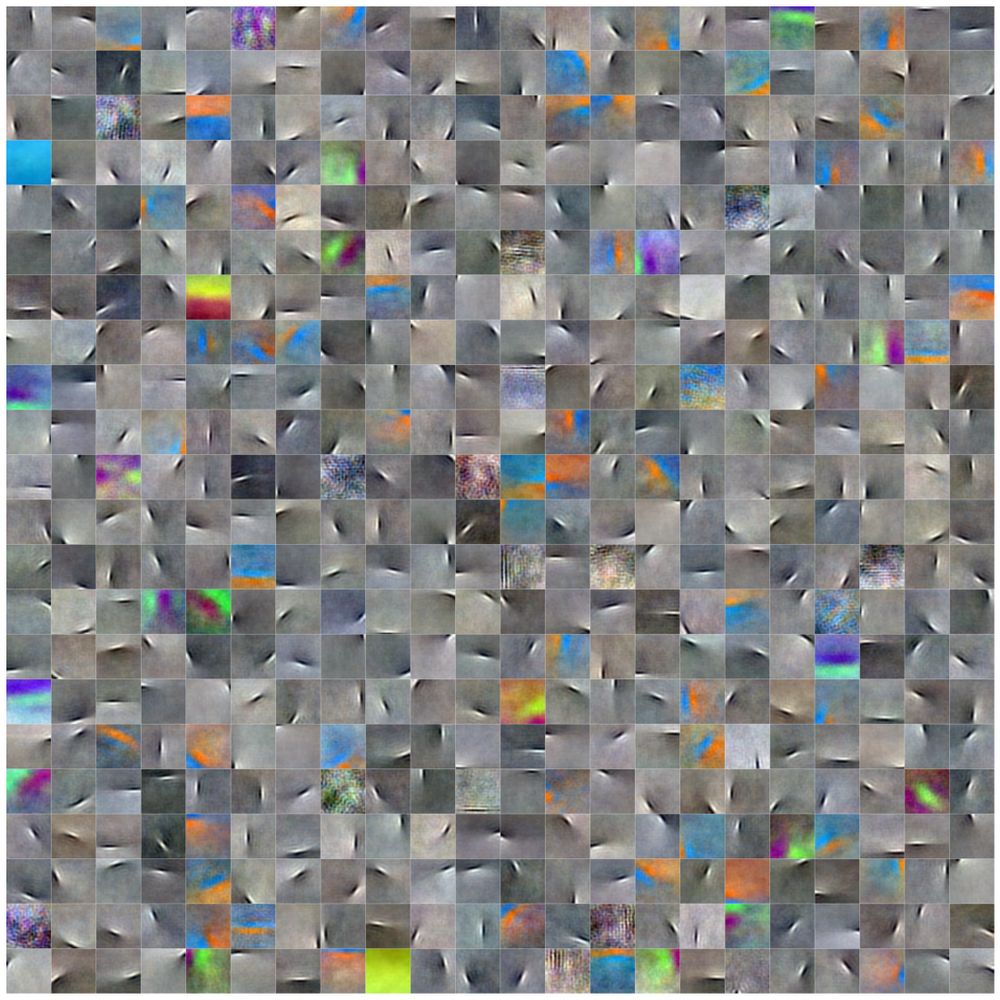

In [21]:
import warnings
import pickle

warnings.filterwarnings('ignore')

for i in range(1, 15, 1):
    print(i)
    model.fit(dl, 1 , X_val=dlv, logging=1, lr=1e-2)
    
    plt.rcParams["figure.figsize"] = (20, 20)
    show_filters_color(model.mixing_matrix.T) # Epoch i
    plt.savefig(f"components-imagenet-484-GHA-ep-{i}.png")

    pickle.dump({"W" : model.sphering_matrix,
                 "I" : model.mixing_matrix}, open( f"imagenet-weights-484-GHA-ep{i}.p", "wb" ) )

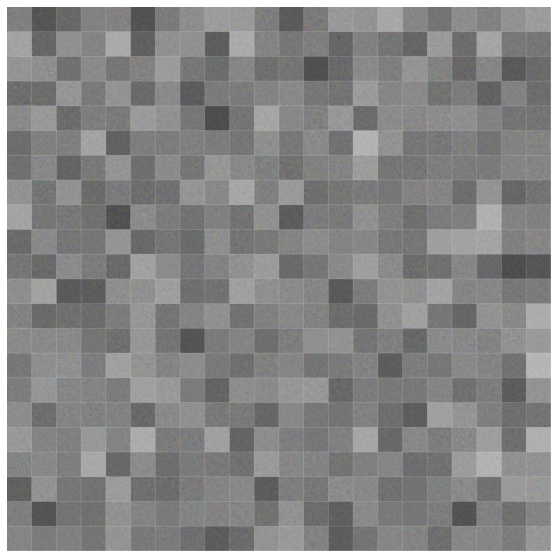

  0%|          | 1/64050 [01:18<1391:08:39, 78.19s/it]


In [15]:
plt.rcParams["figure.figsize"] = (10, 10)
show_filters_color(model.mixing_matrix.T)

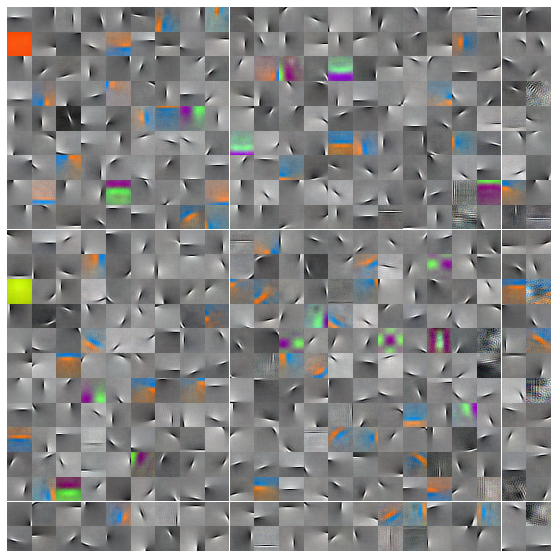

In [97]:
show_filters_color(model.mixing_matrix.T)

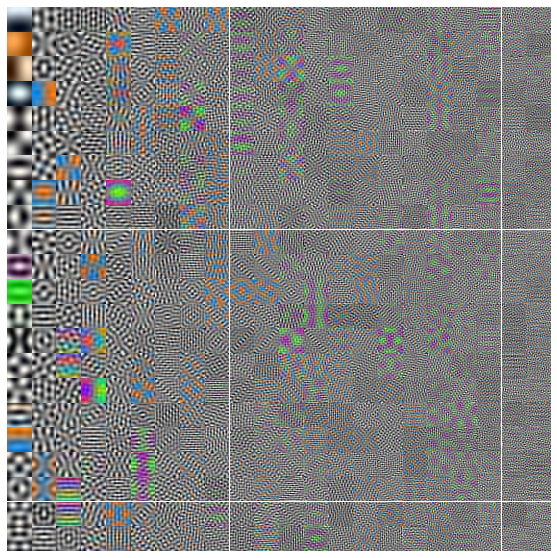

In [93]:
show_filters_color(model.sphering_matrix)

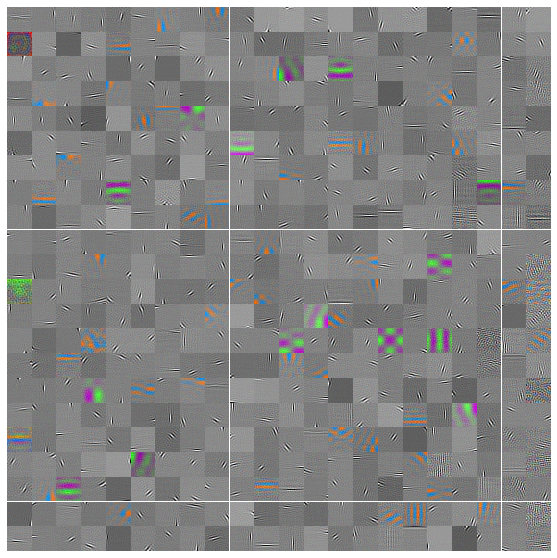

In [94]:
show_filters_color(model.unmixing_matrix)

In [14]:
model.mixing_matrix.T.shape

(120000, 10)

In [67]:
dlv = torch.utils.data.DataLoader(imagenetv, num_workers=1, batch_size=1000)

samples, clusters = 25, 10
E = np.zeros((samples, clusters, 40000*3))
E_p = np.zeros((samples, clusters))
rand_clusters = np.random.permutation(range(529))[:clusters]
for e,b in enumerate(dlv):
    b = b[0]
    S = model.transform(b.cuda()).detach().cpu().numpy()
    S = S[:, rand_clusters]
    S_p = S**2 # power
    for c in range(clusters):
        merge_p = np.concatenate([E_p[:, c], S_p[:, c]])
        merge_d = np.vstack([E[:, c] , b.numpy()])
        idx = np.argsort(merge_p)[-samples:]
        E_p[:, c] = merge_p[idx].copy()
        E[:, c] = merge_d[idx].copy()
    print(e , "/" ,len(dlv))

0 / 1


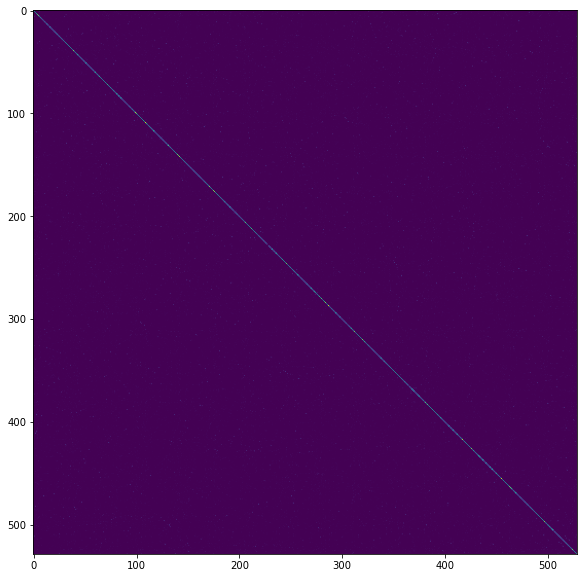

In [72]:
A_inv = model.unmixing_matrix
D = A_inv.T @ A_inv
plt.imshow(np.clip(D, 1e-7, 2))

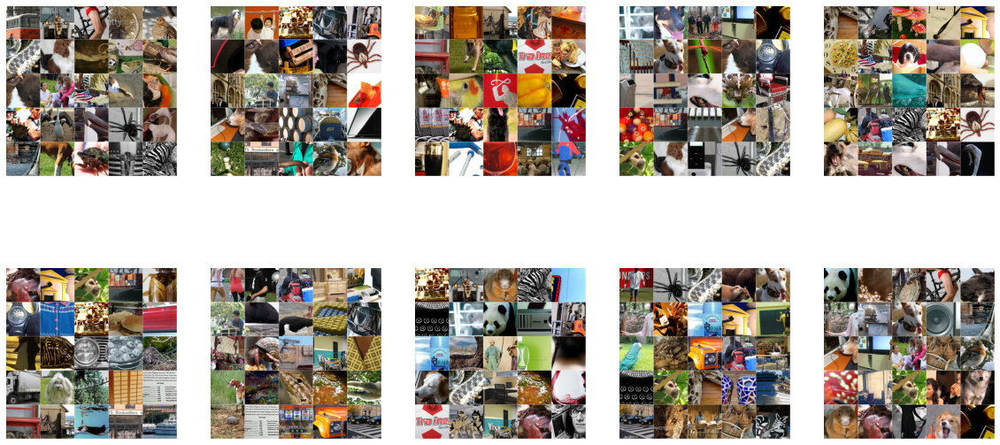

In [68]:
plt.rcParams["figure.figsize"] = (20, 10)

for i in range(clusters):
    plt.subplot(2, clusters//2, i+1)
    show_filters_color(E[:,i].T)